# Data Mining Project - ABCDEatsInc.

**Group_16 members:** <br>
- Ana Margarida Valente, 20240936 <br>
- Catarina Carneiro, 20240690 <br>
- Rui Reis, 20240854 <br>
- Mara Mesquita, 20241039 <br>

**MSc:** Data Science and Advanced Analytics - Nova IMS <br>
**Course:** Data Mining <br>
2024/2025

## Introduction
The client, a fictional food delivery service partnering with a range of restaurants to offer diverse meal options - "ABCDEatsInc." - aims to gain a deeper understanding of its customers' behaviors by identifying distinct segments within its database through customer segmentation. A dataset containing data collected over three months from three cities was provided to define, describe, and analyze the resulting clusters. The goal is to uncover actionable insights and briefly recommend marketing strategies tailored to each segment. 


## Variables:
- customer_id: Unique identifier for each customer.
- customer_region: Geographic region where the customer is located.
- customer_age: Age of the customer.
- vendor_count: Number of unique vendors the customer has ordered from.
- product_count: Total number of products the customer has ordered.
- is_chain: Indicates whether the customer’s order was from a chain restaurant.
- first_order: Number of days from the start of the dataset when the customer first placed an order.
- last_order: Number of days from the start of the dataset when the customer most recently placed an order.
- last_promo: The category of the promotion or discount most recently used by the customer.
- payment_method: Method most recently used by the customer to pay for their orders.
- CUI_American,CUI_Asian,CUI_Chinese,CUI_Italian, etc.: The amount in monetary units spent by the customer from the indicated type of cuisine.
- DOW_0 to DOW_6: Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).
- HR_0 to HR_23: Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).

<a class="anchor" id="libraries1">

## 1. Import 
    
</a>


<a class="anchor" id="libraries">

## 1.1 Import libraries
    
</a>

In [313]:
import sqlite3
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

from itertools import product
from scipy.stats import skewnorm

from datetime import datetime
from sklearn.impute import KNNImputer

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

from sklearn.preprocessing import MinMaxScaler, StandardScaler



# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Setting seaborn style
sns.set()

# Display all the df
pd.options.display.max_columns = None

<a class="anchor" id="dataset">

## 1.2 Import the dataset
    
</a>

In [314]:
# Read the CSV file
df = pd.read_csv(r"C:\Users\anama\OneDrive\Ambiente de Trabalho\Mestrado\Projects\DM2425_ABCDEats_DATASET.csv")

In [315]:
#Create a backup of the original df
df_backup=df

<a class="anchor" id="exploration">

# 2. Data Exploration
    
</a>

<a class="anchor" id="general">

## 2.1 General Data Analysis
    
</a>

In [316]:
df.shape

(31888, 56)

In [317]:
# Display the first few rows of the dataframe
df.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [318]:
#Check columns
df.columns.values

array(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order',
       'last_promo', 'payment_method', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'], dtype=object)

In [319]:
#Check Data Types
df.dtypes

customer_id                  object
customer_region              object
customer_age                float64
vendor_count                  int64
product_count                 int64
is_chain                      int64
first_order                 float64
last_order                    int64
last_promo                   object
payment_method               object
CUI_American                float64
CUI_Asian                   float64
CUI_Beverages               float64
CUI_Cafe                    float64
CUI_Chicken Dishes          float64
CUI_Chinese                 float64
CUI_Desserts                float64
CUI_Healthy                 float64
CUI_Indian                  float64
CUI_Italian                 float64
CUI_Japanese                float64
CUI_Noodle Dishes           float64
CUI_OTHER                   float64
CUI_Street Food / Snacks    float64
CUI_Thai                    float64
DOW_0                         int64
DOW_1                         int64
DOW_2                       

In [320]:
# Summary Statistics of the Categorical variables
df.describe(include='O').T

,count,unique,top,freq
customer_id,31888,31875,742ca068fc,2
customer_region,31888,9,8670,9761
last_promo,31888,4,-,16748
payment_method,31888,3,CARD,20161


In [321]:
# Summary Statistics of the Numerical variables
df.describe().T


,count,mean,std,min,25%,50%,75%,max
customer_age,31161.0,27.506499,7.160898,15.0,23.0,26.0,31.00,80.00
vendor_count,31888.0,3.102609,2.771587,0.0,1.0,2.0,4.00,41.00
product_count,31888.0,5.668245,6.957287,0.0,2.0,3.0,7.00,269.00
is_chain,31888.0,2.818866,3.977529,0.0,1.0,2.0,3.00,83.00
first_order,31782.0,28.478604,24.109086,0.0,7.0,22.0,45.00,90.00
last_order,31888.0,63.675521,23.226123,0.0,49.0,70.0,83.00,90.00
CUI_American,31888.0,4.880438,11.654018,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31888.0,9.960451,23.564351,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31888.0,2.300633,8.479734,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31888.0,0.801163,6.427132,0.0,0.0,0.0,0.00,326.10


In [322]:
# Check duplicates
df.isna().any()

customer_id                 False
customer_region             False
customer_age                 True
vendor_count                False
product_count               False
is_chain                    False
first_order                  True
last_order                  False
last_promo                  False
payment_method              False
CUI_American                False
CUI_Asian                   False
CUI_Beverages               False
CUI_Cafe                    False
CUI_Chicken Dishes          False
CUI_Chinese                 False
CUI_Desserts                False
CUI_Healthy                 False
CUI_Indian                  False
CUI_Italian                 False
CUI_Japanese                False
CUI_Noodle Dishes           False
CUI_OTHER                   False
CUI_Street Food / Snacks    False
CUI_Thai                    False
DOW_0                       False
DOW_1                       False
DOW_2                       False
DOW_3                       False
DOW_4         

In [323]:
df.isna().sum()

customer_id                    0
customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5     

In [324]:
#Check the % of the missing values:
missing_percentage = (df.isnull().mean() * 100).sort_values(ascending=False)

print("Percentage of Missing Values:")
print(missing_percentage)

Percentage of Missing Values:
HR_0                        3.653412
customer_age                2.279854
first_order                 0.332413
customer_id                 0.000000
HR_10                       0.000000
DOW_6                       0.000000
HR_1                        0.000000
HR_2                        0.000000
HR_3                        0.000000
HR_4                        0.000000
HR_5                        0.000000
HR_6                        0.000000
HR_7                        0.000000
HR_8                        0.000000
HR_9                        0.000000
HR_12                       0.000000
HR_11                       0.000000
DOW_4                       0.000000
HR_13                       0.000000
HR_14                       0.000000
HR_15                       0.000000
HR_16                       0.000000
HR_17                       0.000000
HR_18                       0.000000
HR_19                       0.000000
HR_20                       0.000000
HR_21   

<a class="anchor" id="treat">

## 2.2 Data Treatment
    
</a>

<a class="anchor" id="rename">

### 2.2.1 Rename Columns
    
</a>

- Change the DOW columns to the days of the week names

In [325]:
df= df.rename(columns={'DOW_0':'Sunday', 'DOW_1':'Monday', 'DOW_2':'Tuesday', 'DOW_3':'Wednesday', 'DOW_4':'Thursday', 'DOW_5':'Friday','DOW_6':'Saturday'})

<a class="anchor" id="types">

### 2.2.2 Data Types
    
</a>

- customer_age -> float? (change to int)
- first_order -> float? (change to int)
- HR_0 -> float? (change to int)

In [326]:
df['customer_age'] = df['customer_age'].astype('Int64')
df['first_order'] = df['first_order'].astype('Int64')
df['HR_0'] = df['HR_0'].astype('Int64')

<a class="anchor" id="nan">

### 2.2.3 Missing Values
    
</a>

**Missing Values : HR_0**

In [327]:
#Check when HR_0 = NaN, which is the variable with most missing values
nan_HR_0 = df[df['HR_0'].isna()]
pd.set_option('display.max_columns', None)
nan_HR_0

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
34,ae38da6386,8670,21,2,3,1,0,7,DELIVERY,DIGI,0.00,23.70,0.0,0.0,0.0,12.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,2,<NA>,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
87,a21a839c77,4140,19,1,4,4,0,21,-,CARD,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,22.09,0.0,0,0,0,0,0,0,4,<NA>,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
121,9237d23413,8670,22,3,4,2,0,27,-,CARD,5.77,17.76,5.9,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,1,0,0,0,1,2,<NA>,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
132,8c6ffd7357,4660,25,3,4,1,0,28,-,CARD,27.54,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.10,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,3,<NA>,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
186,67c6c9f9c4,4660,24,1,3,0,0,36,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.14,0.0,0.0,0.0,0.00,0.0,1,0,1,0,0,0,1,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31298,37b72b449d,2360,23,1,4,0,85,85,DELIVERY,DIGI,0.00,24.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,1,0,0,0,0,0,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31549,ac382ddfd1,-,28,1,2,2,87,89,DELIVERY,CARD,0.00,17.87,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,1,0,1,0,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
31615,96f1fc25e3,8670,25,2,2,1,88,88,DELIVERY,CASH,0.00,17.98,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,2,0,0,0,<NA>,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31781,d7c7face7e,2440,26,1,1,1,90,90,DELIVERY,CASH,2.61,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,1,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [328]:
#Define the columns of the DOW and the HR columns
dow_columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hr_columns = [col for col in df.columns if col.startswith('HR_')]

In [329]:
#To replace the NaN's of HR_0, let's compare the sum of orders of the DOW with the sum of orders of the HR:
#If it's the same, then HR_0 should be 0, if not, it's the difference between the 2 values, since the sum should be equal

row_sum_dow = df[dow_columns].sum(axis=1)
row_sum_hr = df[hr_columns].sum(axis=1)

row_difference = row_sum_dow - row_sum_hr

df.loc[df['HR_0'].isna(), 'HR_0'] = row_difference

df['HR_0'].head()

0    0
1    0
2    0
3    0
4    0
Name: HR_0, dtype: Int64

In [330]:
df['HR_0'].isna().sum()

0

In [331]:
#Check if the sum of the DOW is equal to the sum of the Hours; It must be
check = (df[dow_columns].sum(axis=1) == df[hr_columns].sum(axis=1)).all()

if check:
    print("Yes")
else:
    print("No")

Yes


**Missing Values : first_order**

In [332]:
#Check when first_order = NaN
nan_first_order = df[df['first_order'].isna()]
nan_first_order

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31782,0366fbb035,8670,24,1,1,0,<NA>,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31783,039d7c8a20,4660,23,1,1,0,<NA>,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31784,04c9d25c93,8670,27,1,1,1,<NA>,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31785,09118ae9e7,8670,36,1,1,0,<NA>,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
31786,0d1f298bbd,4660,22,1,1,1,<NA>,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30,1,1,1,<NA>,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,<NA>,1,1,0,<NA>,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24,1,1,1,<NA>,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34,1,1,0,<NA>,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


It seem that when the first_order is a missing value, the last_order = 0.

In [333]:
df[df['first_order'].isna() & (df['last_order'] == 0)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31782,0366fbb035,8670,24,1,1,0,<NA>,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31783,039d7c8a20,4660,23,1,1,0,<NA>,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31784,04c9d25c93,8670,27,1,1,1,<NA>,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31785,09118ae9e7,8670,36,1,1,0,<NA>,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
31786,0d1f298bbd,4660,22,1,1,1,<NA>,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30,1,1,1,<NA>,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,<NA>,1,1,0,<NA>,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24,1,1,1,<NA>,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34,1,1,0,<NA>,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [334]:
#First we are checking to see if in this situation, there was only one order placed
check = (df[df['first_order'].isna() & (df['last_order'] == 0)][dow_columns].sum(axis=1) == 1).all()

if check:
    print("All rows have row_sum_dow equal to 1 (indicating only one order).")
else:
    print("There are rows where row_sum_dow is not 1.")

There are rows where row_sum_dow is not 1.


In [335]:
#Check which rows do not meet the condition
non_matching_rows = df[(df['first_order'].isna() & (df['last_order'] == 0)) & (df[dow_columns].sum(axis=1) != 1)]

non_matching_rows

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31796,1f9cd0d268,2360,30,2,2,2,<NA>,0,-,CARD,0.0,0.0,0.0,0.0,0.0,0.0,4.08,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
31855,c3690a6fa1,8670,27,2,7,1,<NA>,0,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,25.69,0.0,0.0,0.0,0.0,0.0,0.0,79.86,0.0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0


There are only 2 cases that do not meet the condition. Both cases show that 2 orders were placed on the same day (Saturday). 

Based on the previous analysis, we will assume that when first_order is missing it should be replaced with 0, ensuring that both first_order and last_order occur on the same day (the day the dataset begins).

In [336]:
#first_order is missing only when last_order = 0
#first_order cannot happen after last_order. So we will set the missing first_order values to 0
df.loc[df['first_order'].isna() & (df['last_order'] == 0), 'first_order'] = 0

**Missing Values : customer_age**

In [337]:
#Check when customer_age = NaN
nan_customer_age = df[df['customer_age'].isna()]
nan_customer_age

#Replace the missing values with the mean or median

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3,180c632ed8,4660,<NA>,2,3,1,0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.00,0.0,17.86,0.00,0.0,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
27,8e8652bdc8,4660,<NA>,2,3,2,0,6,DISCOUNT,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,34.88,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
37,6137fa5620,8670,<NA>,2,2,2,0,8,DISCOUNT,CARD,6.13,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,13.15,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
69,2a90e9da84,4660,<NA>,2,2,1,0,17,-,CARD,15.99,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,1.54,0.0,0.0,0.00,0.00,0.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
73,a67d3108cb,8670,<NA>,2,2,1,0,17,-,CARD,0.00,25.85,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31488,46aa9dfeb0,8670,<NA>,1,2,0,87,87,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,25.05,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
31572,29207a92c8,2360,<NA>,1,1,1,88,88,-,CASH,0.00,0.00,3.88,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31762,d7bf721199,2360,<NA>,1,1,1,89,89,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,3.74,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
31877,ee49f4eb0a,2440,<NA>,1,1,1,0,0,DELIVERY,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,3.16,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


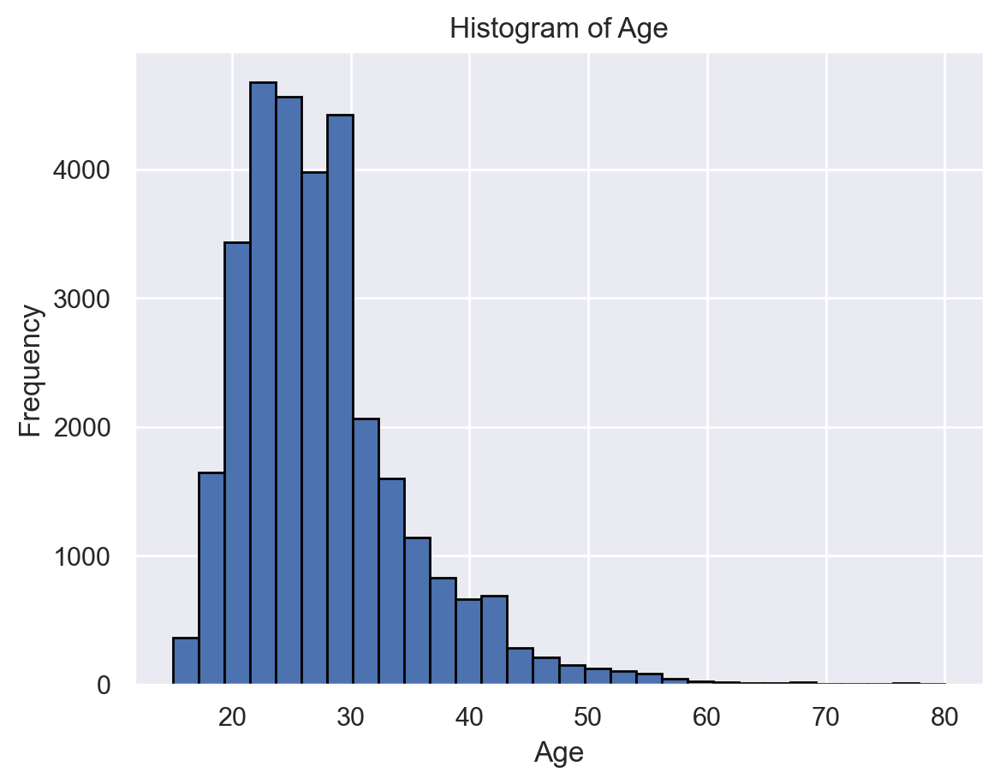

In [338]:
plt.hist(df['customer_age'].dropna(), bins=30, edgecolor='black')  
plt.title('Histogram of Age')
plt.xlabel('Age') 
plt.ylabel('Frequency') 
plt.show()

In [339]:
#Since the histogram is skewed, the median is preferred to replace the missing values
median_age = df['customer_age'].median()
df['customer_age'] = df['customer_age'].fillna(median_age)
print(f"Median = {median_age}")

Median = 26.0


<a class="anchor" id="duplicates">

### 2.2.4 Check for Duplicates
    
</a>

In [340]:
df.duplicated().sum()

13

In [341]:
df.loc[df.duplicated(keep=False)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3355,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3379,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7867,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
7887,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
16227,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
16230,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
20855,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
20907,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
24328,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24329,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [342]:
#% of duplicates:
df.duplicated().mean()*100

0.040767686904164574

In [343]:
#Identify customer_id duplicated (it should be a unique value, since it represents 1 customer)
duplicate_values = df['customer_id'].value_counts()[df['customer_id'].value_counts() > 1]

duplicate_rows = df[df['customer_id'].isin(duplicate_values.index)]

print("\n")
print(f'Total: {len(duplicate_rows)}') 
duplicate_rows



Total: 26


,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3355,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3379,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7867,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
7887,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
16227,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
16230,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
20855,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
20907,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
24328,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24329,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


The duplicates are only the cases where the customer_id is duplicated, meaning that are 2 entries of the same customer in the dataset

In [344]:
df.drop_duplicates(inplace=True)

In [345]:
df = df.drop('customer_id', axis=1)

<a class="anchor" id="uniqueandstrange">

### 2.2.5 Check Unique and Strange values
    
</a>

**Vendor_count**

In [346]:
df['vendor_count'].unique()

array([ 2,  1,  3,  4,  5,  7,  6, 11,  9,  8, 12, 14, 20, 13, 10, 16, 24,
       18, 17, 15, 25, 30, 19, 21, 23, 22, 28, 32, 41, 40, 26,  0, 27, 34,
       31, 35, 29], dtype=int64)

In [347]:
df[df['vendor_count'] == 41]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1263,2360,20,41,110,73,0,88,DELIVERY,DIGI,33.25,0.0,46.6,4.74,12.06,6.08,10.19,13.97,0.0,1.25,15.35,5.55,202.54,1.3,9.89,6,15,15,11,8,13,14,0,1,0,1,1,0,0,0,1,3,4,0,0,1,5,16,22,8,6,4,4,1,1,3


**Product_count**

In [348]:
df['product_count'].unique()

array([  5,   2,   3,   4,   6,  10,   8,  17,   7,  26,   9,  32,  15,
        13,  16,  28,  19,  12,  18,  11,  25,  14,  23,  29,  21,  31,
        95,  24,  64,  27,  37,  49,  22,  41,  51,  34,  39,  20,  30,
        47,  40,  53,  38,  54,  35,  33,  56,  65,  45,  63,  36,  79,
        48,  70,  44,  84,  46,  66,  57,  58,  83, 110, 117, 269,  75,
        55,  42,  81,  91,  43,  69,  67,  72,  59,   1,   0,  77,  97,
        87,  73,  76,  60, 109,  52,  62,  94,  80,  89,  61,  82,  50,
        88,  68], dtype=int64)

In [349]:
df[df['product_count'] == 269]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1270,2360,23,40,269,81,0,88,-,CARD,19.08,70.01,37.92,18.3,0.0,739.73,0.0,0.0,0.0,20.11,84.05,197.84,109.31,12.34,109.64,15,17,14,10,9,9,20,0,0,0,0,0,0,0,0,0,1,3,9,12,3,4,3,8,14,7,15,9,2,2,2


**Customer_region**

In [350]:
df['customer_region'].value_counts()

customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64

In [351]:
(len(df[df['customer_region'] == '-']) / len(df))*100

1.3866666666666667

In [352]:
# Replace '-' with the mode
mode_value = df['customer_region'].mode()[0]  

df['customer_region'] = df['customer_region'].replace('-', mode_value)

- '-' -> Strange = 1,386%; Assuming it's a missing value and Use Mode
- There are 3 cities, aggregate the cities by the first number of the region (2,4,8)

**Customer_age**

In [353]:
df['customer_age'].unique()

<IntegerArray>
[18, 17, 38, 26, 20, 40, 24, 27, 33, 21, 51, 35, 22, 31, 15, 47, 19, 28, 32,
 25, 37, 42, 48, 16, 34, 29, 23, 30, 39, 46, 41, 49, 53, 36, 43, 44, 45, 57,
 58, 68, 56, 61, 60, 54, 59, 50, 55, 52, 65, 75, 66, 79, 80, 63, 77, 62, 69,
 72, 64, 76, 74, 67, 70, 78, 71, 73]
Length: 66, dtype: Int64

In [354]:
df[(df['customer_age'] == 15) | (df['customer_age'] == 16)| (df['customer_age'] == 17)]
#It could be a problem since it's a minor

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1,8670,17,2,2,2,0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
20,8670,15,2,3,1,0,5,DELIVERY,DIGI,6.06,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,23.92,0.00,0.0,0.00,0.00,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
55,8670,16,5,8,1,0,13,-,CARD,0.00,56.16,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,24.56,0.00,2,2,0,0,0,1,1,0,0,1,1,0,0,0,0,1,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0
65,2360,17,2,4,2,0,16,-,CASH,0.00,0.00,0.00,0.0,6.88,0.0,0.0,0.0,0.00,0.0,0.00,12.40,0.0,0.00,0.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
154,2360,17,4,6,4,0,31,-,DIGI,0.00,0.00,9.06,0.0,0.00,0.0,0.0,0.0,0.00,0.0,19.15,4.09,0.0,0.00,0.00,0,0,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31454,4660,17,1,2,0,86,86,DELIVERY,CARD,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,18.87,0.00,0.0,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
31511,4140,17,1,1,1,87,87,-,CARD,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,7.50,0.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
31654,4140,17,1,3,0,88,89,-,CASH,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,17.13,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
31662,8670,17,1,2,0,89,89,FREEBIE,DIGI,0.00,23.86,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


**last_promo**

In [355]:
df['last_promo'].value_counts()

last_promo
-           16744
DELIVERY     6282
DISCOUNT     4496
FREEBIE      4353
Name: count, dtype: int64

- '-' -> Changing to 'NO PROMO', to be more perceptible

In [356]:
df['last_promo'] = df['last_promo'].replace('-', 'NO PROMO')

**Payment_method**

In [357]:
df['payment_method'].value_counts()

payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64

**First_order**

In [358]:
df['first_order'].unique()

<IntegerArray>
[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
Length: 91, dtype: Int64

In [359]:
df['first_order'].max()
#Makes sense because the dataset is from a three-month period

90

**Last_order**

In [360]:
df['last_order'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90,  9, 15,  0], dtype=int64)

In [361]:
df['first_order'].max()

90

**is_chain**

This variable needs to be fixed. The metadata does not correspond to the dataset

In [362]:
df['is_chain'].unique()

array([ 1,  2,  0,  3,  5,  4,  7, 12,  6, 23,  8, 11, 20, 14,  9, 10, 16,
       15, 13, 25, 17, 27, 30, 32, 24, 18, 26, 28, 22, 40, 31, 39, 21, 37,
       19, 33, 65, 38, 29, 45, 47, 73, 81, 56, 35, 46, 67, 44, 61, 34, 36,
       49, 83, 75, 43, 42, 48, 63, 54, 80], dtype=int64)

In [363]:
# Most of the orders are on bevarages
df[df['is_chain'] == 83]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
2435,2360,28,27,109,83,1,89,NO PROMO,CARD,2.57,28.41,229.22,2.86,0.0,2.84,10.34,58.29,10.43,2.27,0.0,0.0,79.47,7.44,0.0,16,17,10,17,15,8,8,0,0,0,0,0,0,0,2,2,2,8,13,17,12,6,7,3,3,6,8,2,0,0,0


Change the is_chain variable to Binary Type

In [364]:
threshold = 0
df['is_chain'] = (df['is_chain'] > threshold).astype(int)

In [365]:
#df['is_chain']

**DOW**

In [366]:
for column in dow_columns:
    unique_values = df[column].unique()  # Get unique values
    print(f"Column: {column}")
    print(f"Unique Values: {unique_values}")
    print("-" * 70)

Column: Monday
Unique Values: [ 0  1  2  3  6  4  9  5 10  8  7 11 13 15 17 16 12]
----------------------------------------------------------------------
Column: Tuesday
Unique Values: [ 0  1  2  3  4  9  5  7  6  8 15 14 10 11 12 13]
----------------------------------------------------------------------
Column: Wednesday
Unique Values: [ 0  1  2  3  4  8  5  6  7  9 10 14 11 17 13 12 16]
----------------------------------------------------------------------
Column: Thursday
Unique Values: [ 0  1  2  3  6 10  4  7  5  8  9 11 14 12 13 15 16]
----------------------------------------------------------------------
Column: Friday
Unique Values: [ 0  1  2  3  5  4 10  7  9  6  8 13 11 15 12 20 14]
----------------------------------------------------------------------
Column: Saturday
Unique Values: [ 1  2  3  4  7  9  6  5  8 10 11 17 13 12 14 20  0]
----------------------------------------------------------------------
Column: Sunday
Unique Values: [ 1  0  2  3  5  4  9  6  8 10  7 11 15 1

**Hours**

In [367]:
for column in hr_columns:
    unique_values = df[column].unique()  # Get unique values
    print(f"Column: {column}")
    print(f"Unique Values: {unique_values}")
    print("-" * 70)

Column: HR_0
Unique Values: <IntegerArray>
[0, 1, 2, 3, 5, 4, 12, 9, 8, 7, 6, 11, 15]
Length: 13, dtype: Int64
----------------------------------------------------------------------
Column: HR_1
Unique Values: [ 0  1  2  4  3  5  9  6  8 14  7]
----------------------------------------------------------------------
Column: HR_2
Unique Values: [ 0  1  2  5  7  3 12  6  8 10  9  4]
----------------------------------------------------------------------
Column: HR_3
Unique Values: [ 0  1  2  5  7  3  4  6  8 10 11  9]
----------------------------------------------------------------------
Column: HR_4
Unique Values: [ 0  1  2 13  5 10  3  7  4 14  8  6  9]
----------------------------------------------------------------------
Column: HR_5
Unique Values: [0 1 2 4 3 7 5]
----------------------------------------------------------------------
Column: HR_6
Unique Values: [0 1 2 4 3 7 8 5 6]
----------------------------------------------------------------------
Column: HR_7
Unique Values: [ 0  1  

In [368]:
df[df['HR_8'] == 52]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3368,2360,17,2,75,1,2,89,FREEBIE,CARD,0.0,0.0,173.16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.18,11,11,14,9,10,10,10,0,0,0,0,0,0,1,13,52,4,2,0,0,0,0,0,0,2,1,0,0,0,0,0


**Cuisine Types**

In [369]:
for col in df.columns:
    if col.startswith('CUI_'):
        unique_values = df[col].unique()  
        print(f"Column: {col}")
        print(f"Unique Values: {unique_values}")
        print("-" * 70)

Column: CUI_American
Unique Values: [ 0.   12.82  9.2  ... 14.45 23.12  8.65]
----------------------------------------------------------------------
Column: CUI_Asian
Unique Values: [ 0.    6.39 13.7  ... 22.71 17.23  2.21]
----------------------------------------------------------------------
Column: CUI_Beverages
Unique Values: [ 0.    1.53 24.4  ... 62.8  23.44 32.57]
----------------------------------------------------------------------
Column: CUI_Cafe
Unique Values: [ 0.    5.07  2.6  ... 10.9   2.73 13.06]
----------------------------------------------------------------------
Column: CUI_Chicken Dishes
Unique Values: [ 0.    6.21  5.59 ...  4.92 11.53 10.76]
----------------------------------------------------------------------
Column: CUI_Chinese
Unique Values: [ 0.   11.31 31.05 ...  0.68 38.27 24.74]
----------------------------------------------------------------------
Column: CUI_Desserts
Unique Values: [ 0.    9.72  5.82 ...  4.08 25.69 17.79]
-----------------------------

<a class="anchor" id="visual">

# 3. Data Visualization
    
</a>

 Define Numerical and Categorical Features

In [370]:
numerical_features=['customer_age', 'vendor_count','product_count', 'first_order', 'last_order']
categorical_features=['customer_region','last_promo','payment_method','is_chain']

<a class="anchor" id="num">

## 3.1 Numerical Features
    
</a>

In [371]:
def analyze_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_lim = Q1 - 1.5 * IQR
    upper_lim = Q3 + 1.5 * IQR
    outliers = data[(data < lower_lim) | (data > upper_lim)]
    percentage = (len(outliers) / len(data)) * 100  
    return len(outliers), percentage, lower_lim, upper_lim

 Statistics for column: customer_age
  Mean: 27.47
  Median: 26.00
  Standard Deviation: 7.08
  Min: 15
  Max: 80
  Skewness: 1.59
  Kurtosis: 4.26
--------------------------------------------------
Count of outliers: 1083
Percentage of outliers: 3.40%
Lower Lim:11.0
Upper Lim:43.0
----------------------------------------
 Statistics for column: vendor_count
  Mean: 3.10
  Median: 2.00
  Standard Deviation: 2.77
  Min: 0
  Max: 41
  Skewness: 3.02
  Kurtosis: 15.60
--------------------------------------------------
Count of outliers: 1523
Percentage of outliers: 4.78%
Lower Lim:-3.5
Upper Lim:8.5
----------------------------------------
 Statistics for column: product_count
  Mean: 5.67
  Median: 3.00
  Standard Deviation: 6.96
  Min: 0
  Max: 269
  Skewness: 5.71
  Kurtosis: 92.86
--------------------------------------------------
Count of outliers: 2370
Percentage of outliers: 7.44%
Lower Lim:-5.5
Upper Lim:14.5
----------------------------------------
 Statistics for column: first_o

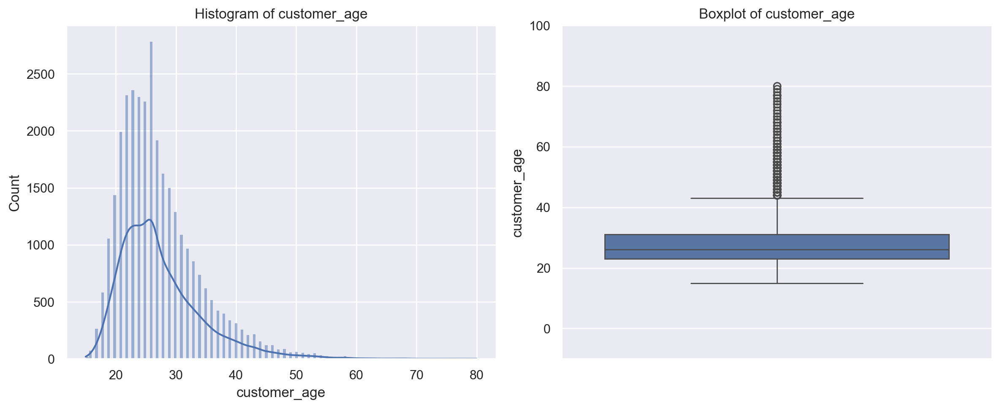

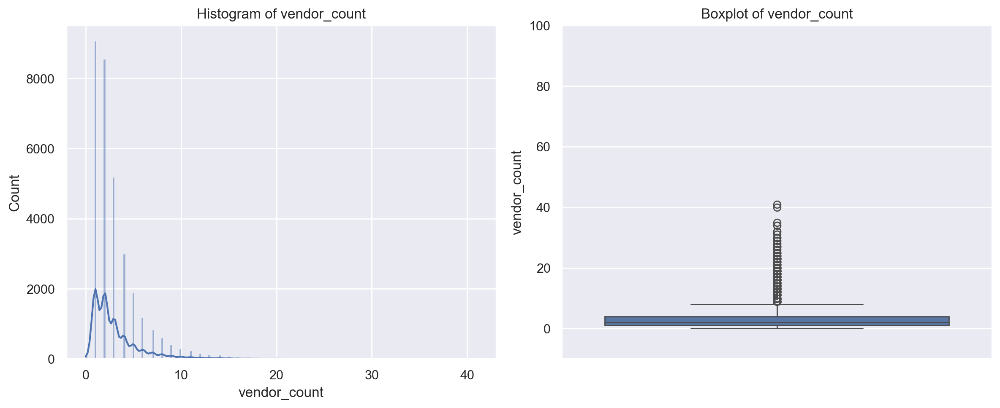

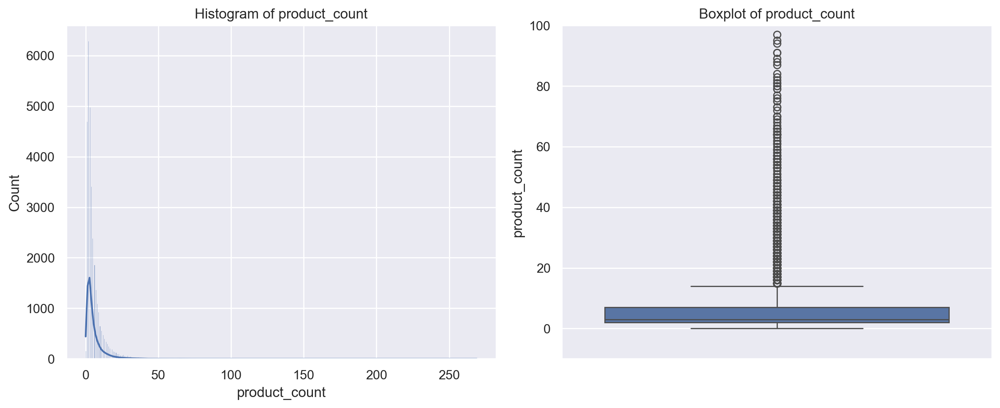

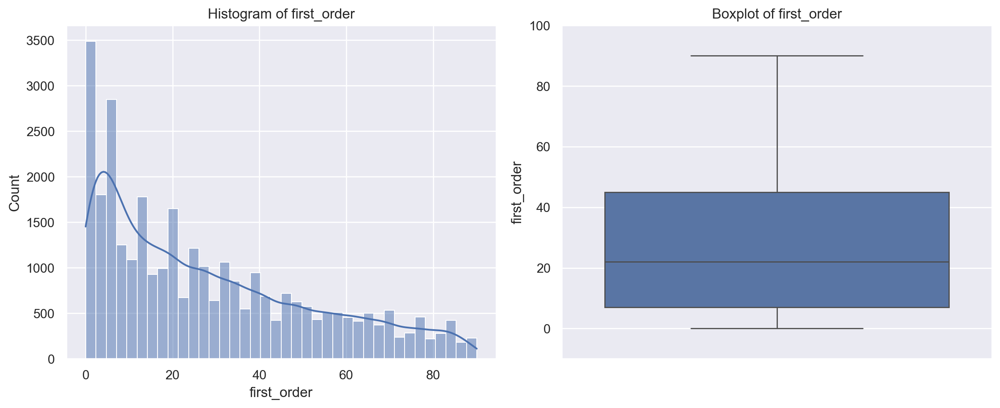

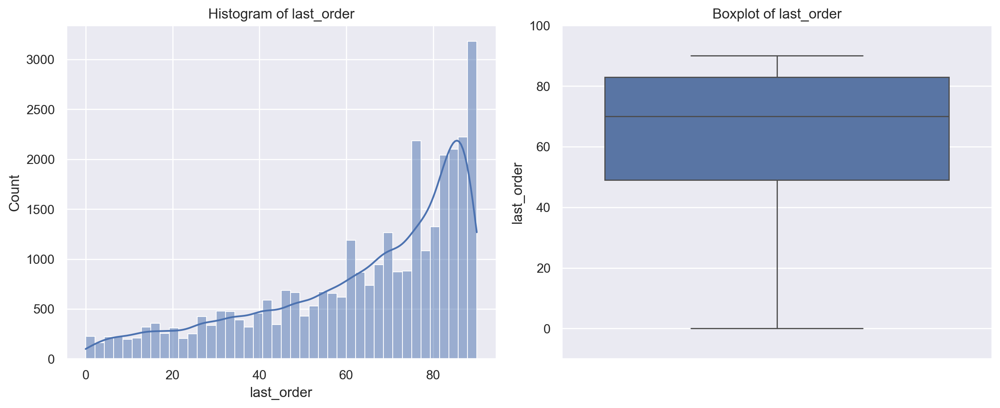

In [372]:
for col in numerical_features:
    print(f" Statistics for column: {col}")
    
    # Calculate key statistics
    mean = df[col].mean()
    median = df[col].median()
    std_dev = df[col].std()
    min_val = df[col].min()
    max_val = df[col].max()
    skewness = df[col].skew()
    kurtosis = df[col].kurt()

    # Display the statistics
    print(f'  Mean: {mean:.2f}')
    print(f'  Median: {median:.2f}')
    print(f'  Standard Deviation: {std_dev:.2f}')
    print(f'  Min: {min_val}')
    print(f'  Max: {max_val}')
    print(f'  Skewness: {skewness:.2f}')
    print(f'  Kurtosis: {kurtosis:.2f}')
    print('-' * 50 )
    
    # Visualization of each Variable:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')

    #set fixed scale between -10 and 100 (to analyse better the outliers)
    plt.ylim(-10,100)

    # Analyze outliers for the numerical variables
    outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
    print(f'Count of outliers: {outlier_count}')
    print(f'Percentage of outliers: {outlier_percentage:.2f}%')
    print(f'Lower Lim:{lower_lim}')
    print(f'Upper Lim:{upper_lim}')
    print('-' * 40)
   
    plt.tight_layout()

 Statistics for column: CUI_American
  Mean: 4.88
  Median: 0.00
  Standard Deviation: 11.65
  Min: 0.0
  Max: 280.21
  Skewness: 5.44
  Kurtosis: 54.77
--------------------------------------------------
Count of outliers: 3507
Percentage of outliers: 11.00%
Lower Lim:-8.49
Upper Lim:14.15
----------------------------------------


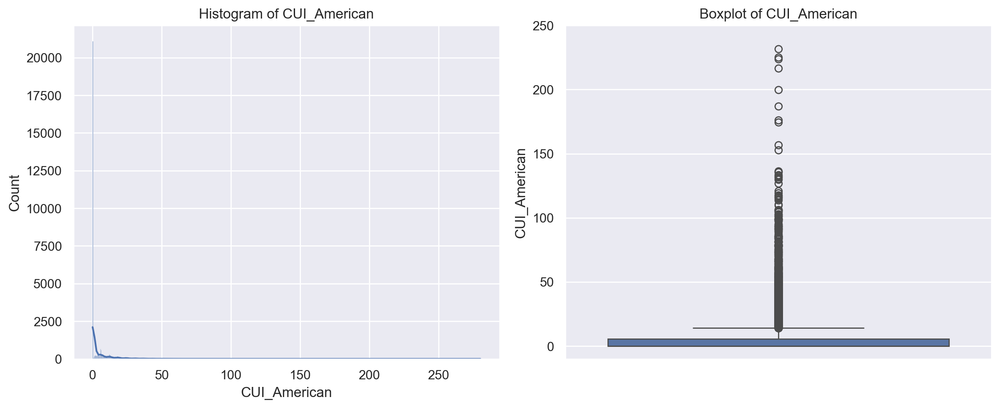

 Statistics for column: CUI_Asian
  Mean: 9.96
  Median: 0.00
  Standard Deviation: 23.56
  Min: 0.0
  Max: 896.71
  Skewness: 6.65
  Kurtosis: 108.73
--------------------------------------------------
Count of outliers: 3472
Percentage of outliers: 10.89%
Lower Lim:-17.745
Upper Lim:29.575000000000003
----------------------------------------


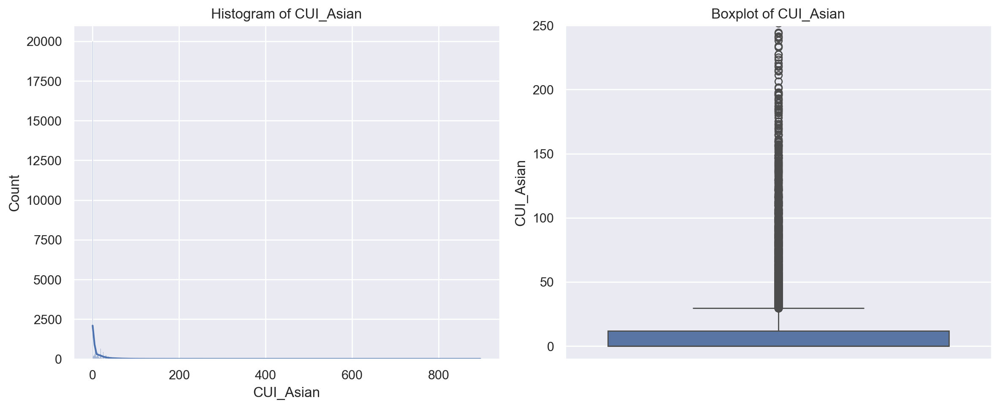

 Statistics for column: CUI_Beverages
  Mean: 2.30
  Median: 0.00
  Standard Deviation: 8.48
  Min: 0.0
  Max: 229.22
  Skewness: 8.15
  Kurtosis: 107.95
--------------------------------------------------
Count of outliers: 5431
Percentage of outliers: 17.04%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


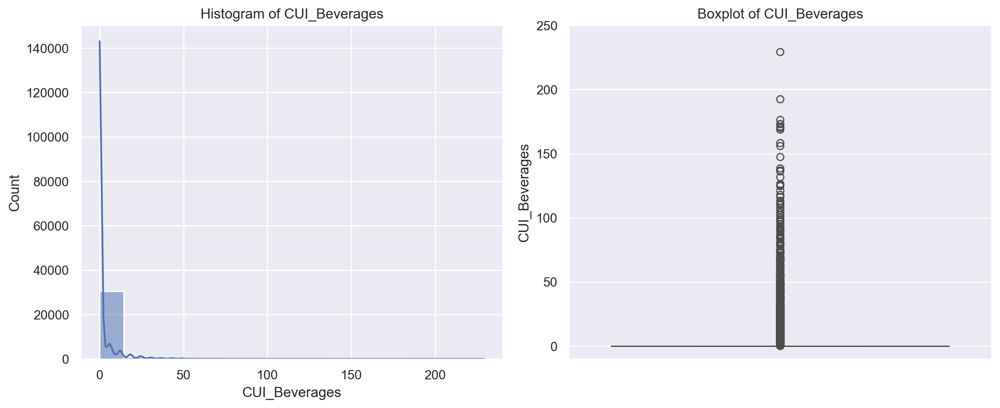

 Statistics for column: CUI_Cafe
  Mean: 0.80
  Median: 0.00
  Standard Deviation: 6.43
  Min: 0.0
  Max: 326.1
  Skewness: 19.14
  Kurtosis: 574.03
--------------------------------------------------
Count of outliers: 1366
Percentage of outliers: 4.29%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


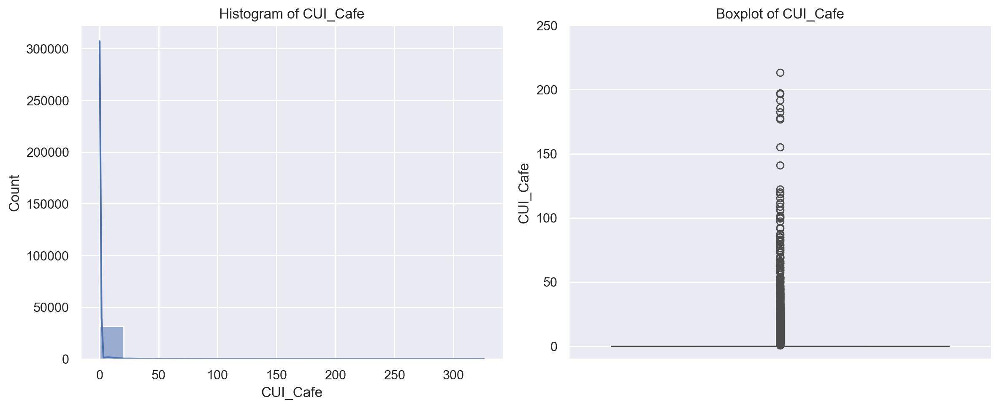

 Statistics for column: CUI_Chicken Dishes
  Mean: 0.77
  Median: 0.00
  Standard Deviation: 3.66
  Min: 0.0
  Max: 219.66
  Skewness: 15.84
  Kurtosis: 577.94
--------------------------------------------------
Count of outliers: 3248
Percentage of outliers: 10.19%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


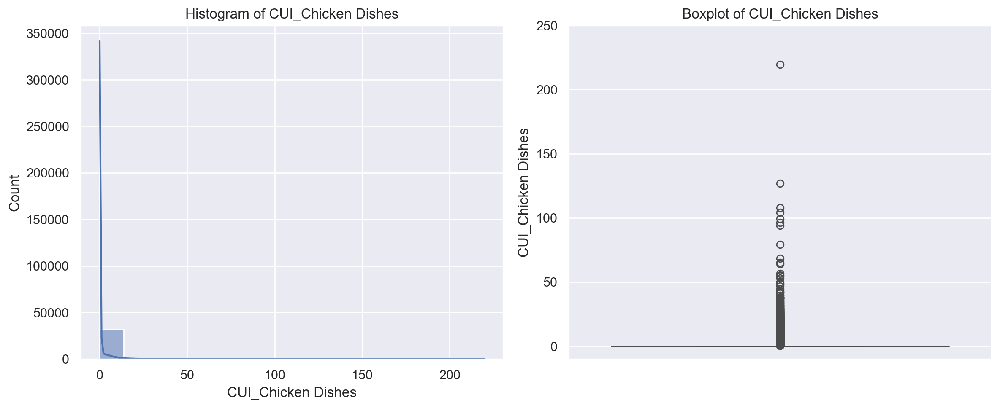

 Statistics for column: CUI_Chinese
  Mean: 1.43
  Median: 0.00
  Standard Deviation: 8.19
  Min: 0.0
  Max: 739.73
  Skewness: 34.80
  Kurtosis: 2487.95
--------------------------------------------------
Count of outliers: 3522
Percentage of outliers: 11.05%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


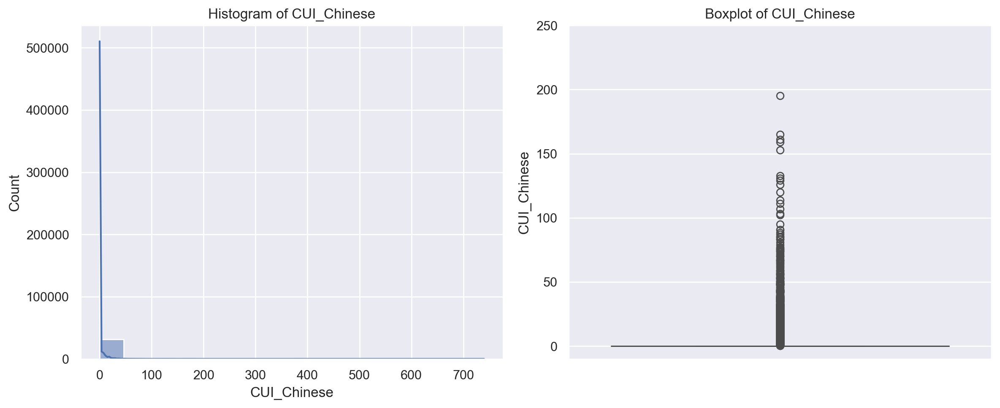

 Statistics for column: CUI_Desserts
  Mean: 0.88
  Median: 0.00
  Standard Deviation: 5.26
  Min: 0.0
  Max: 230.07
  Skewness: 14.35
  Kurtosis: 382.34
--------------------------------------------------
Count of outliers: 2016
Percentage of outliers: 6.32%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


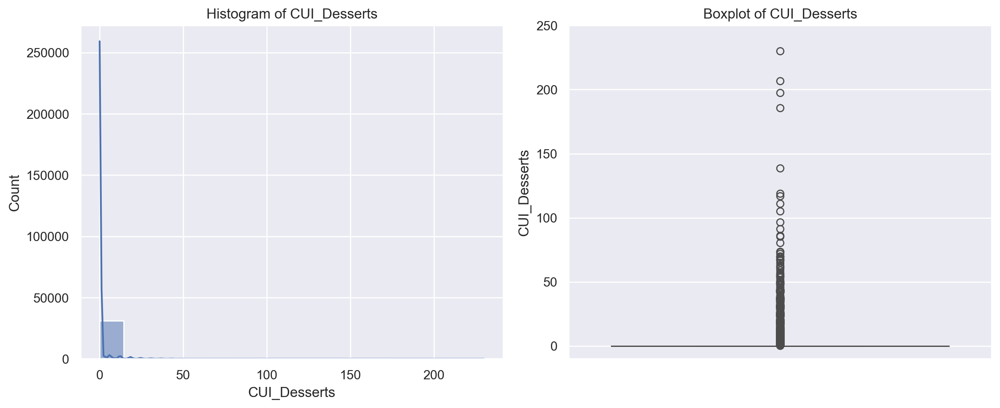

 Statistics for column: CUI_Healthy
  Mean: 0.95
  Median: 0.00
  Standard Deviation: 5.83
  Min: 0.0
  Max: 255.81
  Skewness: 14.88
  Kurtosis: 379.49
--------------------------------------------------
Count of outliers: 2169
Percentage of outliers: 6.80%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


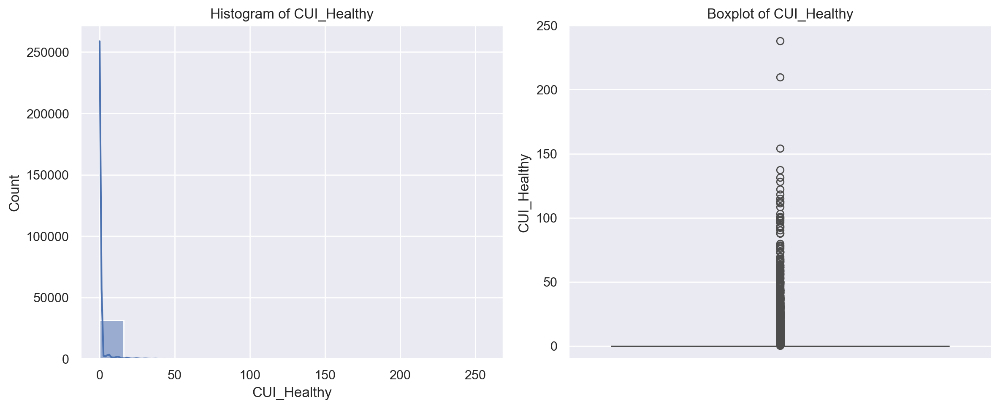

 Statistics for column: CUI_Indian
  Mean: 1.63
  Median: 0.00
  Standard Deviation: 7.44
  Min: 0.0
  Max: 309.07
  Skewness: 10.85
  Kurtosis: 219.64
--------------------------------------------------
Count of outliers: 3448
Percentage of outliers: 10.82%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


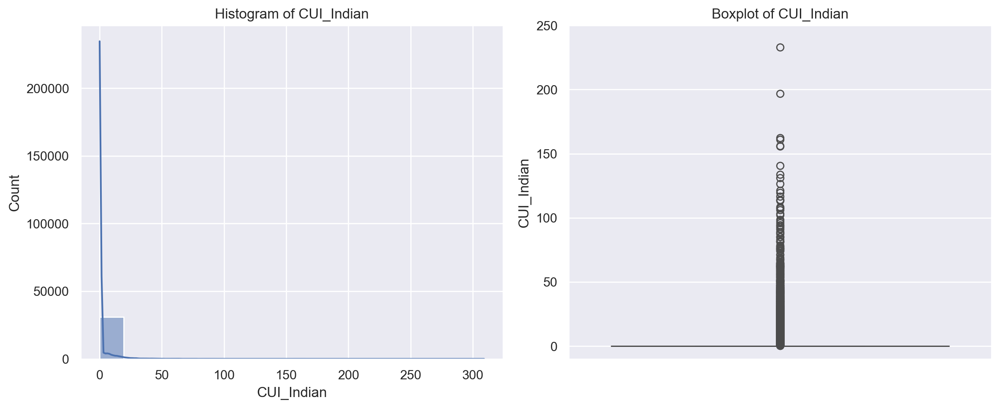

 Statistics for column: CUI_Italian
  Mean: 3.23
  Median: 0.00
  Standard Deviation: 11.25
  Min: 0.0
  Max: 468.33
  Skewness: 9.53
  Kurtosis: 192.00
--------------------------------------------------
Count of outliers: 6448
Percentage of outliers: 20.23%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


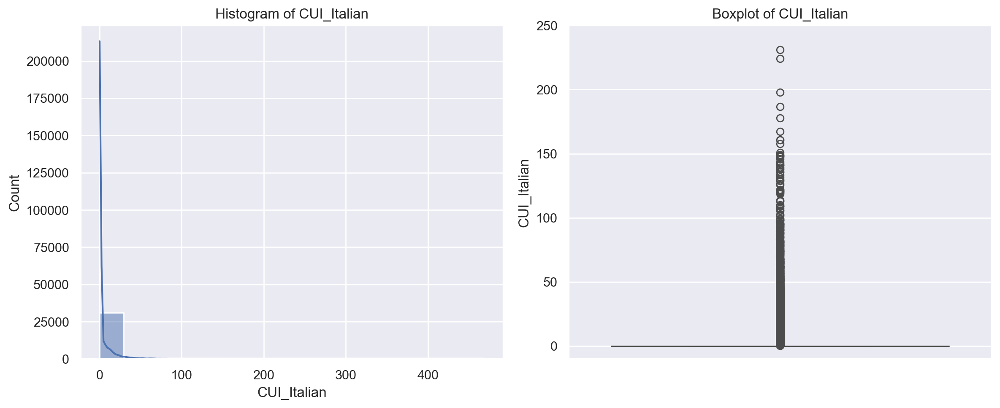

 Statistics for column: CUI_Japanese
  Mean: 3.00
  Median: 0.00
  Standard Deviation: 10.18
  Min: 0.0
  Max: 706.14
  Skewness: 15.67
  Kurtosis: 771.18
--------------------------------------------------
Count of outliers: 6300
Percentage of outliers: 19.76%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


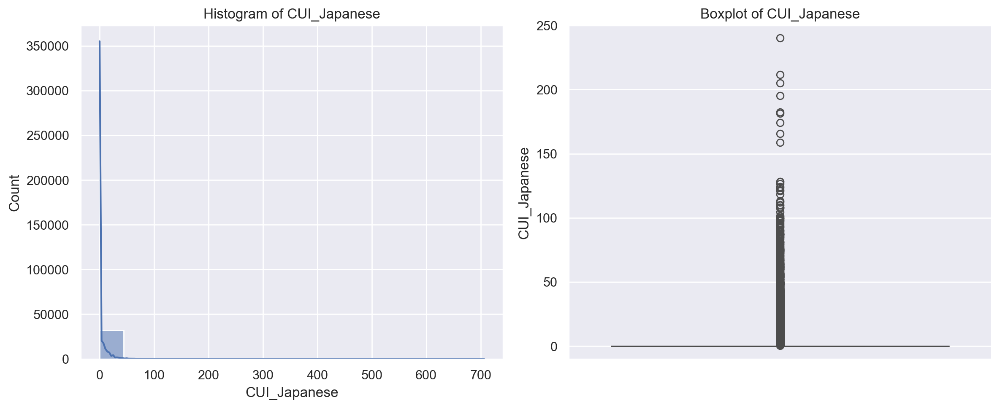

 Statistics for column: CUI_Noodle Dishes
  Mean: 0.71
  Median: 0.00
  Standard Deviation: 4.54
  Min: 0.0
  Max: 275.11
  Skewness: 18.58
  Kurtosis: 687.94
--------------------------------------------------
Count of outliers: 2226
Percentage of outliers: 6.98%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


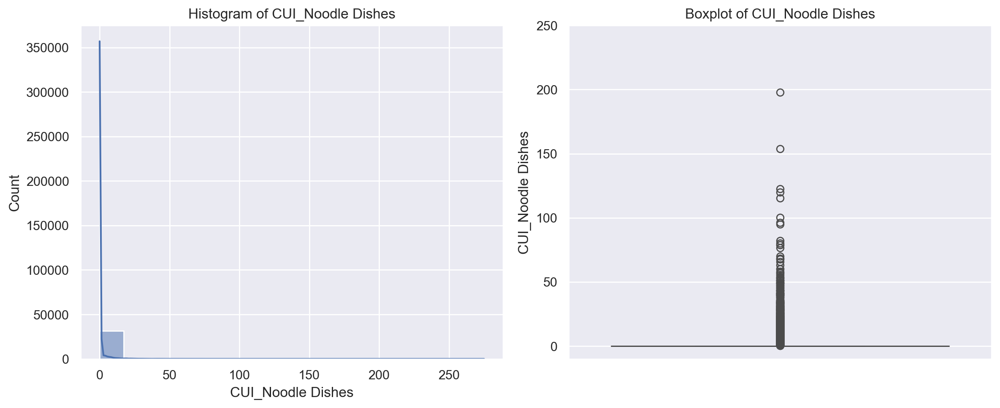

 Statistics for column: CUI_OTHER
  Mean: 3.00
  Median: 0.00
  Standard Deviation: 9.77
  Min: 0.0
  Max: 366.08
  Skewness: 8.70
  Kurtosis: 148.94
--------------------------------------------------
Count of outliers: 7041
Percentage of outliers: 22.09%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


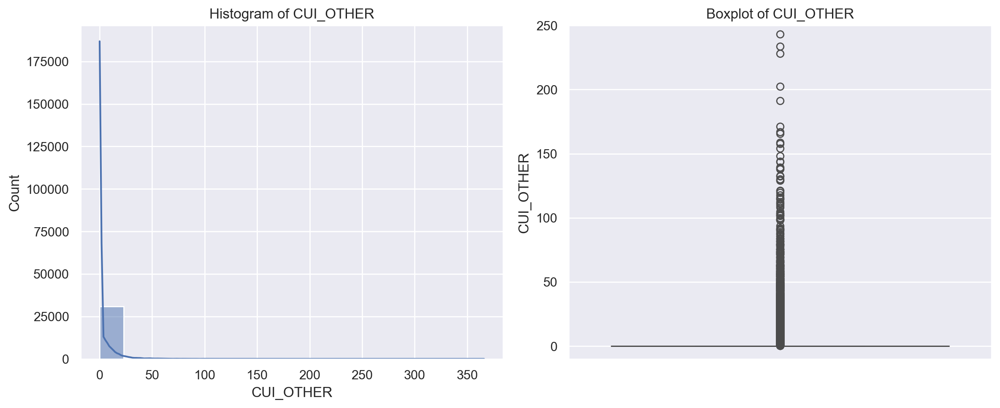

 Statistics for column: CUI_Street Food / Snacks
  Mean: 3.91
  Median: 0.00
  Standard Deviation: 15.55
  Min: 0.0
  Max: 454.45
  Skewness: 7.79
  Kurtosis: 100.58
--------------------------------------------------
Count of outliers: 4244
Percentage of outliers: 13.31%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


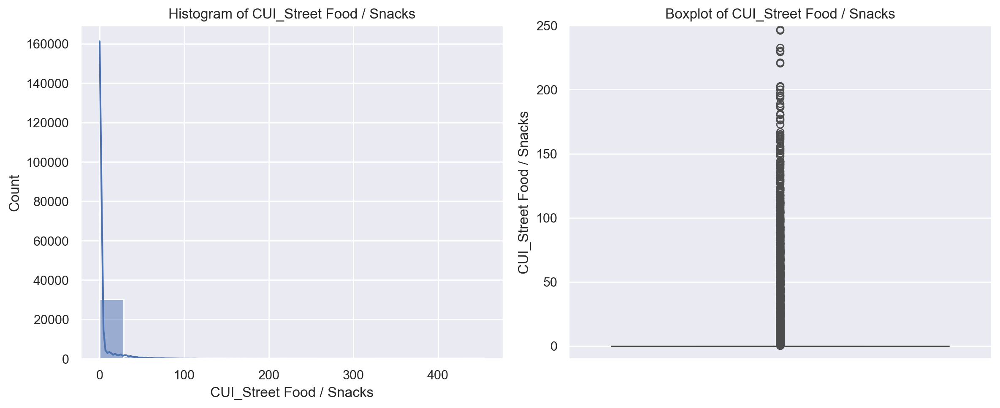

 Statistics for column: CUI_Thai
  Mean: 0.84
  Median: 0.00
  Standard Deviation: 4.43
  Min: 0.0
  Max: 136.38
  Skewness: 10.79
  Kurtosis: 183.84
--------------------------------------------------
Count of outliers: 2378
Percentage of outliers: 7.46%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


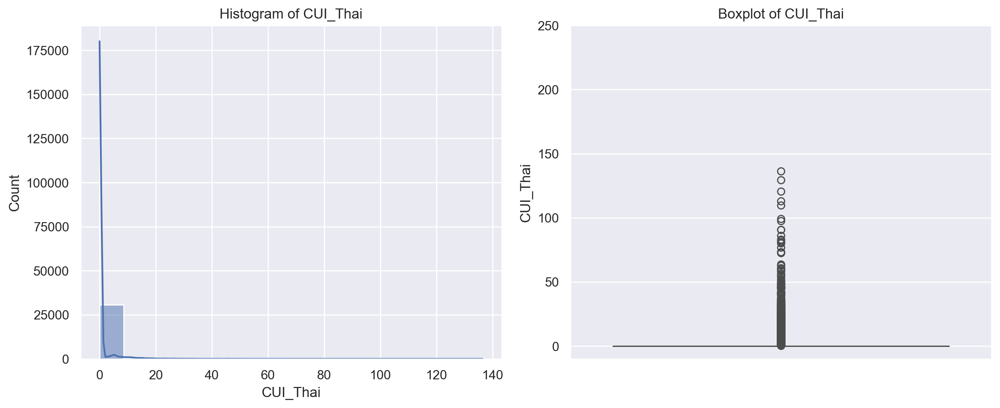

In [373]:
cui_bx=['CUI_American', 'CUI_Asian', 'CUI_Beverages','CUI_Cafe', 'CUI_Chicken Dishes', 
        'CUI_Chinese', 'CUI_Desserts','CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 
        'CUI_Japanese','CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks','CUI_Thai']

for col in cui_bx:
    print(f" Statistics for column: {col}")
    
    # Calculate key statistics
    mean = df[col].mean()
    median = df[col].median()
    std_dev = df[col].std()
    min_val = df[col].min()
    max_val = df[col].max()
    skewness = df[col].skew()
    kurtosis = df[col].kurt()

    # Display the statistics
    print(f'  Mean: {mean:.2f}')
    print(f'  Median: {median:.2f}')
    print(f'  Standard Deviation: {std_dev:.2f}')
    print(f'  Min: {min_val}')
    print(f'  Max: {max_val}')
    print(f'  Skewness: {skewness:.2f}')
    print(f'  Kurtosis: {kurtosis:.2f}')
    print('-' * 50 )
    
    # Visualization of each Variable:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')

    #set fixed scale between -10 and 250 (to analyse better the outliers)
    plt.ylim(-10, 250)

    # Analyze outliers for the numerical variables
    outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
    print(f'Count of outliers: {outlier_count}')
    print(f'Percentage of outliers: {outlier_percentage:.2f}%')
    print(f'Lower Lim:{lower_lim}')
    print(f'Upper Lim:{upper_lim}')
    print('-' * 40)
   
    plt.tight_layout()
    plt.show()

 Statistics for column: HR_0
  Mean: 0.05
  Median: 0.00
  Standard Deviation: 0.31
  Min: 0
  Max: 15
  Skewness: 14.26
  Kurtosis: 392.43
--------------------------------------------------
Count of outliers: 1164
Percentage of outliers: 3.65%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


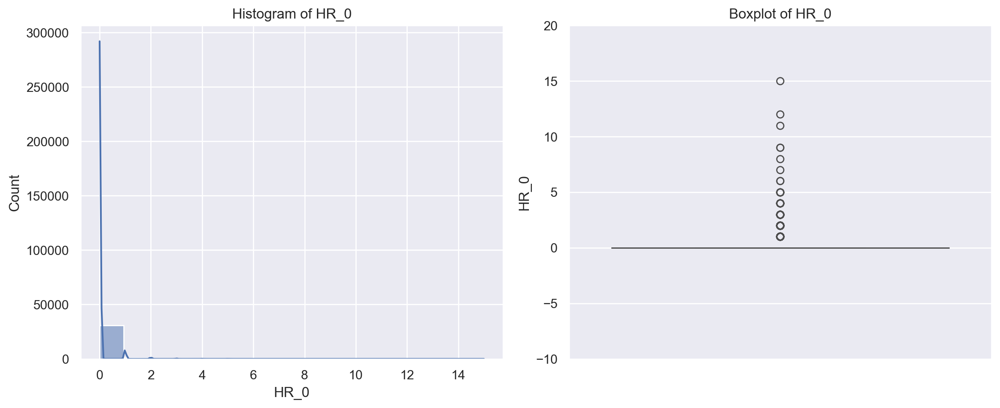

 Statistics for column: HR_1
  Mean: 0.05
  Median: 0.00
  Standard Deviation: 0.32
  Min: 0
  Max: 14
  Skewness: 10.96
  Kurtosis: 229.23
--------------------------------------------------
Count of outliers: 1283
Percentage of outliers: 4.03%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


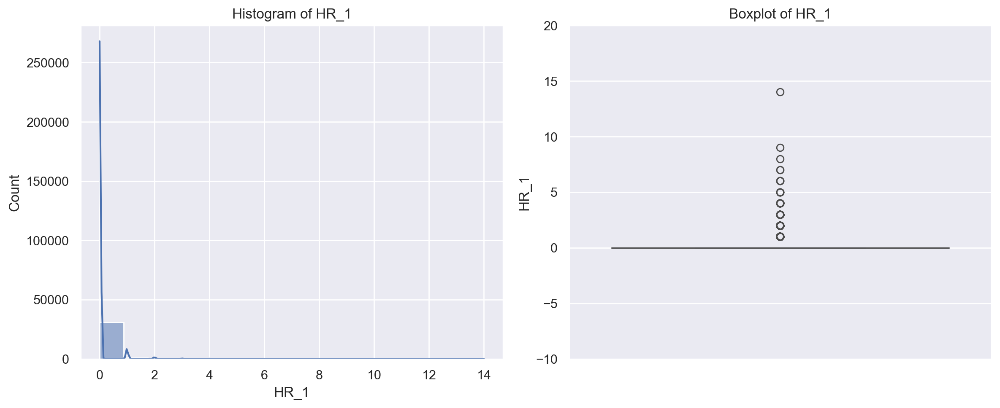

 Statistics for column: HR_2
  Mean: 0.06
  Median: 0.00
  Standard Deviation: 0.35
  Min: 0
  Max: 12
  Skewness: 10.86
  Kurtosis: 207.38
--------------------------------------------------
Count of outliers: 1490
Percentage of outliers: 4.67%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


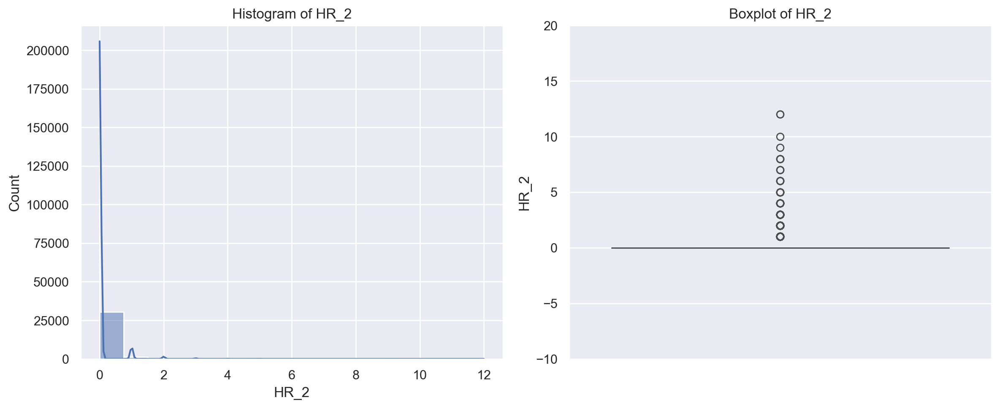

 Statistics for column: HR_3
  Mean: 0.12
  Median: 0.00
  Standard Deviation: 0.50
  Min: 0
  Max: 11
  Skewness: 6.97
  Kurtosis: 75.42
--------------------------------------------------
Count of outliers: 2521
Percentage of outliers: 7.91%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


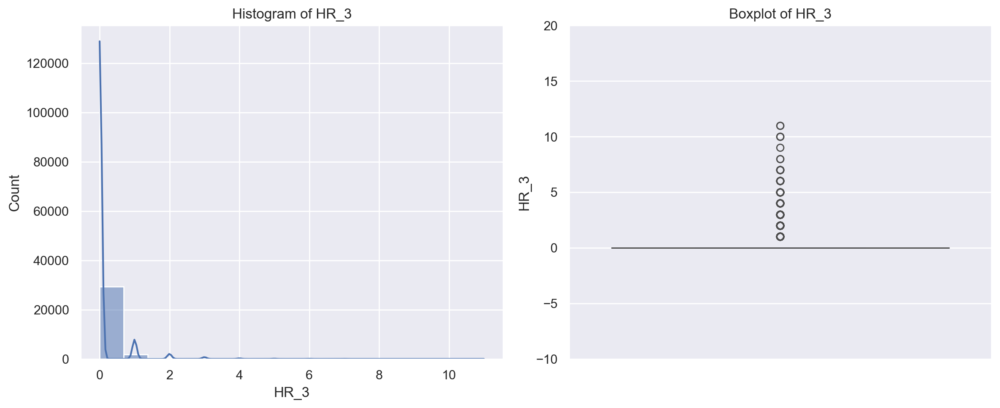

 Statistics for column: HR_4
  Mean: 0.10
  Median: 0.00
  Standard Deviation: 0.44
  Min: 0
  Max: 14
  Skewness: 8.01
  Kurtosis: 119.66
--------------------------------------------------
Count of outliers: 2368
Percentage of outliers: 7.43%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


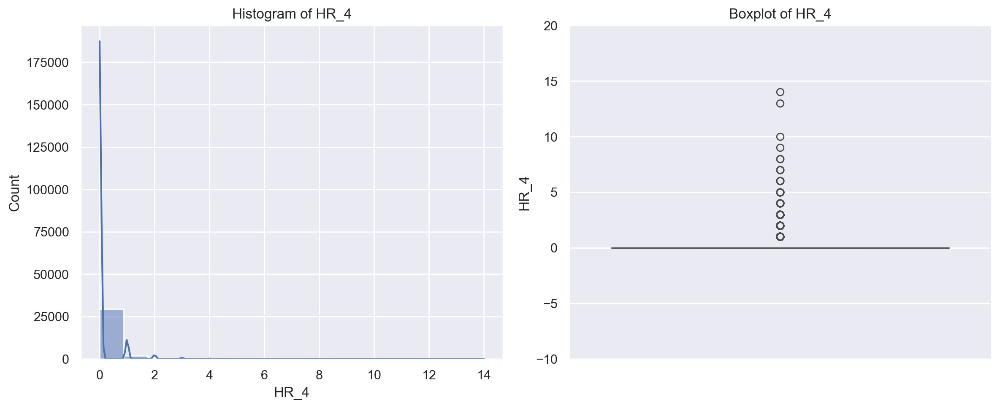

 Statistics for column: HR_5
  Mean: 0.08
  Median: 0.00
  Standard Deviation: 0.36
  Min: 0
  Max: 7
  Skewness: 6.16
  Kurtosis: 53.43
--------------------------------------------------
Count of outliers: 2026
Percentage of outliers: 6.36%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


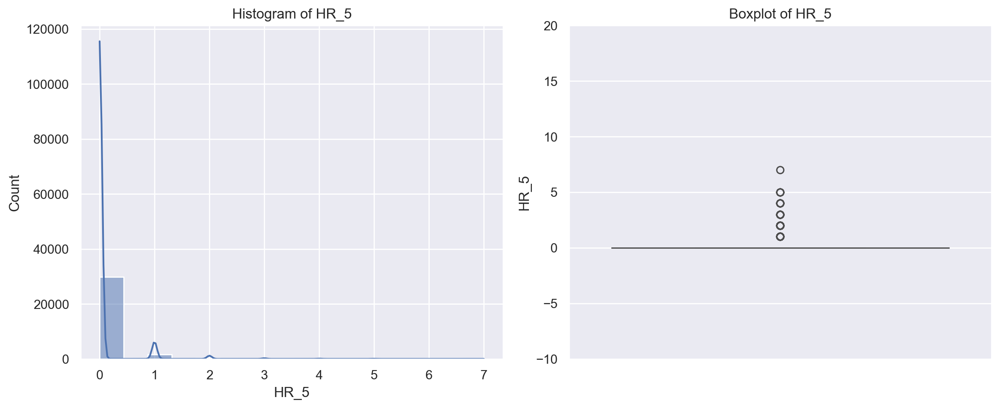

 Statistics for column: HR_6
  Mean: 0.07
  Median: 0.00
  Standard Deviation: 0.33
  Min: 0
  Max: 8
  Skewness: 6.95
  Kurtosis: 73.84
--------------------------------------------------
Count of outliers: 1750
Percentage of outliers: 5.49%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


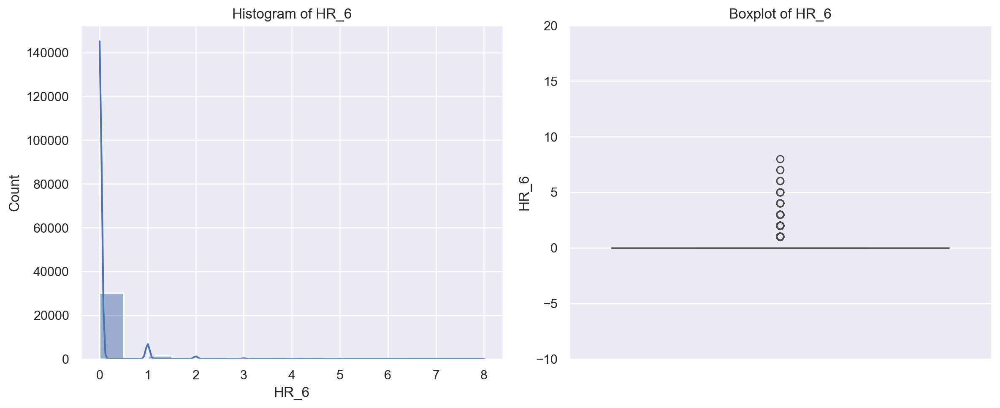

 Statistics for column: HR_7
  Mean: 0.08
  Median: 0.00
  Standard Deviation: 0.38
  Min: 0
  Max: 15
  Skewness: 11.64
  Kurtosis: 283.73
--------------------------------------------------
Count of outliers: 1893
Percentage of outliers: 5.94%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


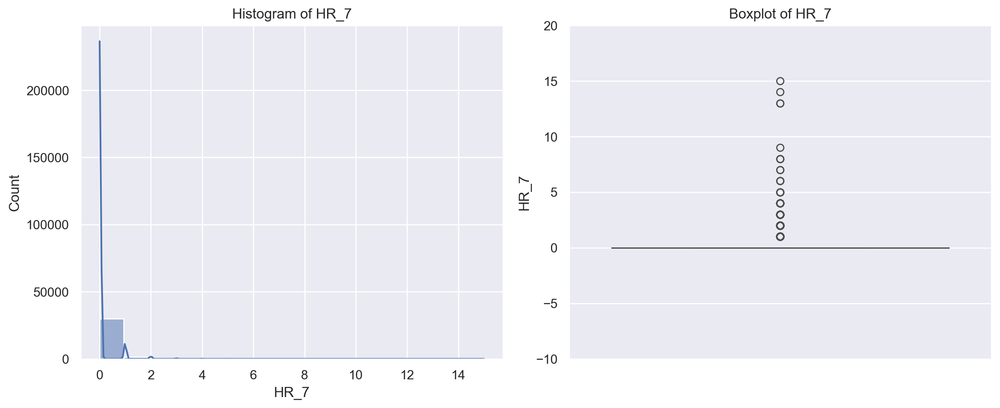

 Statistics for column: HR_8
  Mean: 0.13
  Median: 0.00
  Standard Deviation: 0.64
  Min: 0
  Max: 52
  Skewness: 27.74
  Kurtosis: 1713.02
--------------------------------------------------
Count of outliers: 2952
Percentage of outliers: 9.26%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


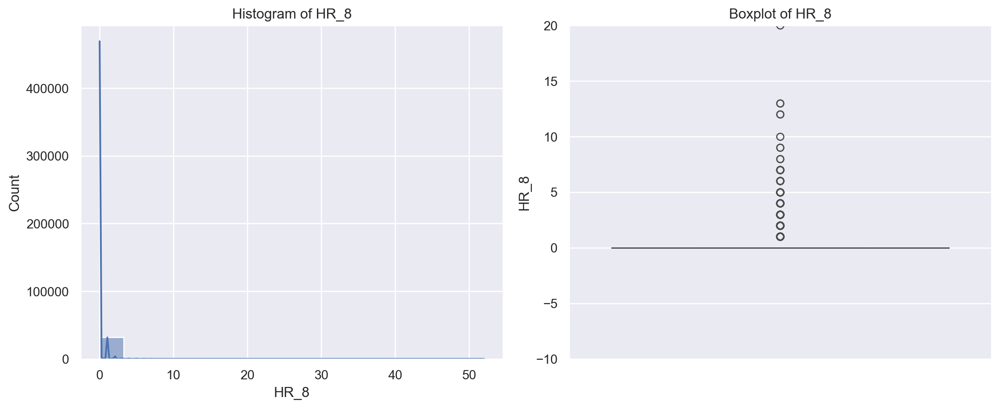

 Statistics for column: HR_9
  Mean: 0.23
  Median: 0.00
  Standard Deviation: 0.73
  Min: 0
  Max: 23
  Skewness: 6.79
  Kurtosis: 92.89
--------------------------------------------------
Count of outliers: 4923
Percentage of outliers: 15.44%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


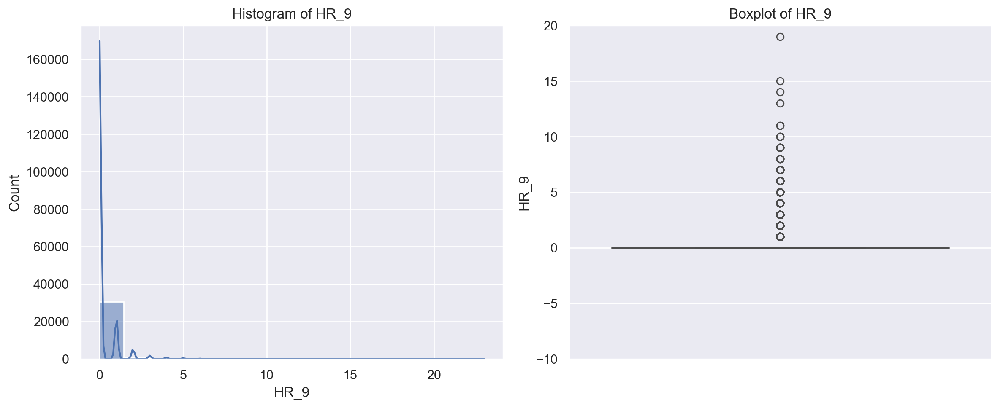

 Statistics for column: HR_10
  Mean: 0.33
  Median: 0.00
  Standard Deviation: 0.89
  Min: 0
  Max: 25
  Skewness: 6.49
  Kurtosis: 84.58
--------------------------------------------------
Count of outliers: 6598
Percentage of outliers: 20.70%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


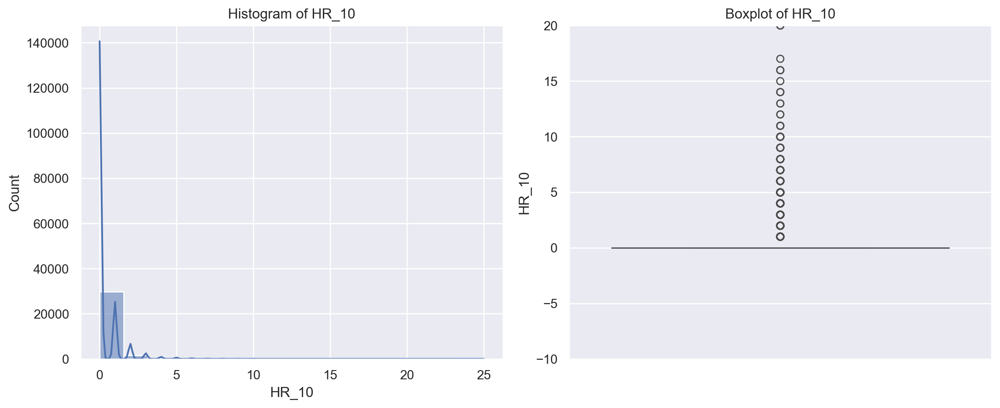

 Statistics for column: HR_11
  Mean: 0.38
  Median: 0.00
  Standard Deviation: 0.96
  Min: 0
  Max: 36
  Skewness: 6.93
  Kurtosis: 116.08
--------------------------------------------------
Count of outliers: 7530
Percentage of outliers: 23.62%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


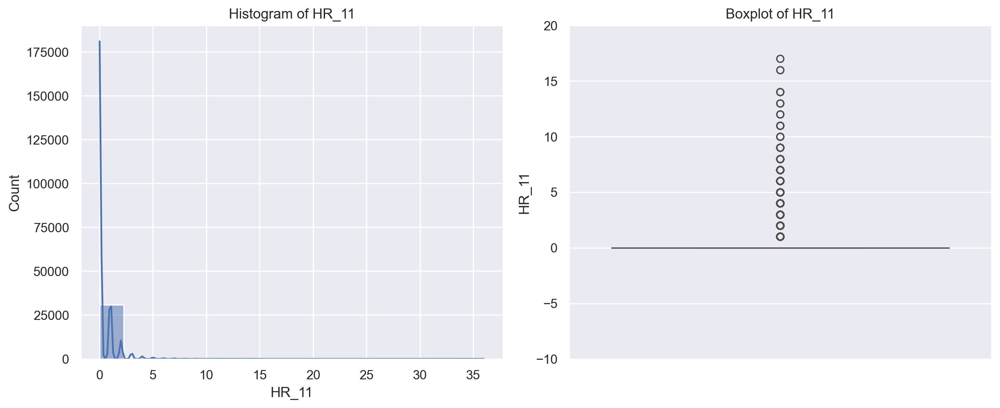

 Statistics for column: HR_12
  Mean: 0.31
  Median: 0.00
  Standard Deviation: 0.84
  Min: 0
  Max: 26
  Skewness: 6.26
  Kurtosis: 81.17
--------------------------------------------------
Count of outliers: 6497
Percentage of outliers: 20.38%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


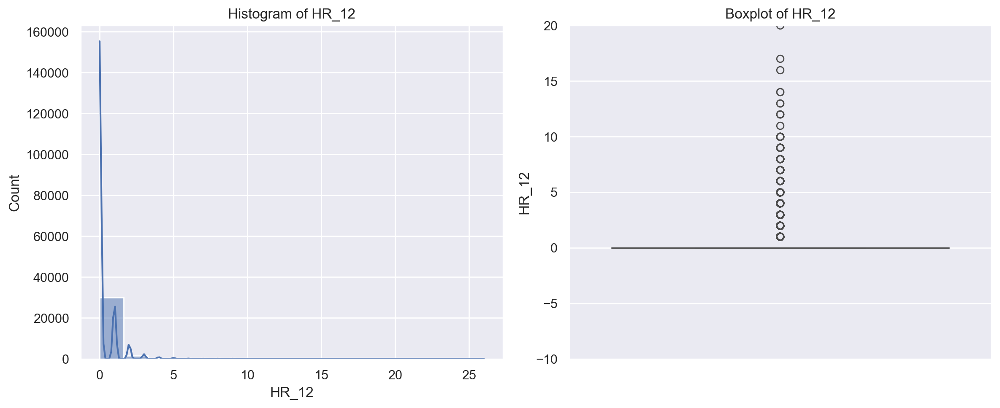

 Statistics for column: HR_13
  Mean: 0.24
  Median: 0.00
  Standard Deviation: 0.64
  Min: 0
  Max: 14
  Skewness: 4.74
  Kurtosis: 41.24
--------------------------------------------------
Count of outliers: 5454
Percentage of outliers: 17.11%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


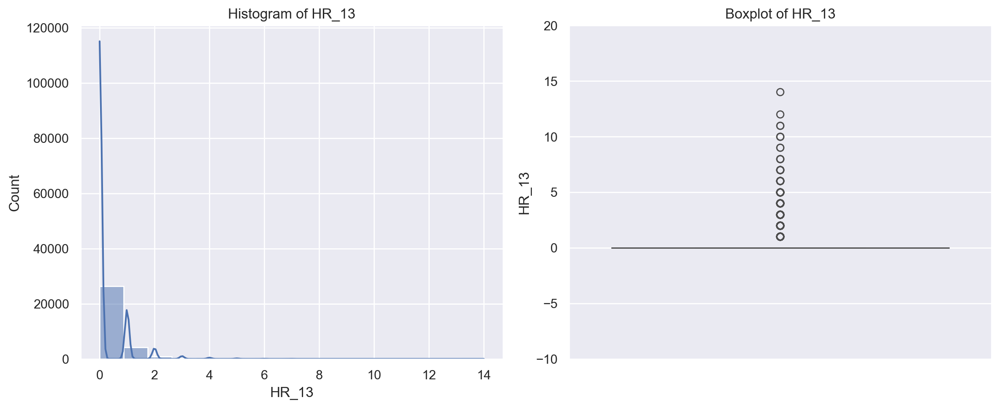

 Statistics for column: HR_14
  Mean: 0.22
  Median: 0.00
  Standard Deviation: 0.60
  Min: 0
  Max: 13
  Skewness: 4.83
  Kurtosis: 42.02
--------------------------------------------------
Count of outliers: 5104
Percentage of outliers: 16.01%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


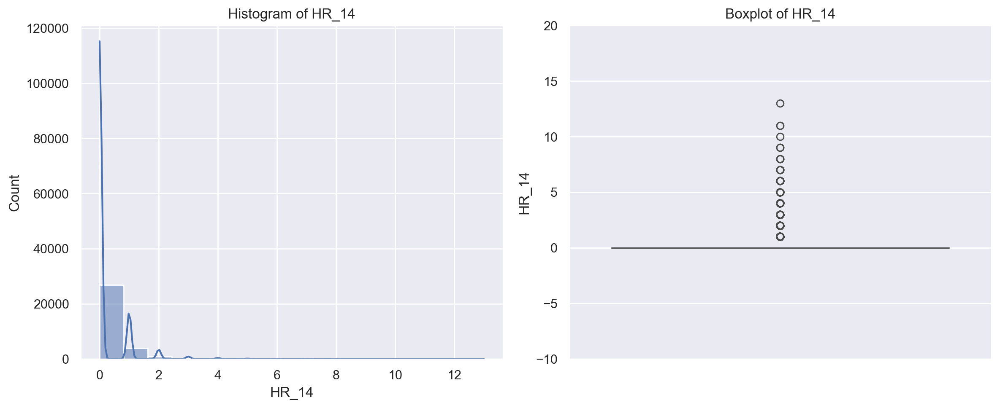

 Statistics for column: HR_15
  Mean: 0.28
  Median: 0.00
  Standard Deviation: 0.74
  Min: 0
  Max: 23
  Skewness: 5.73
  Kurtosis: 74.35
--------------------------------------------------
Count of outliers: 6038
Percentage of outliers: 18.94%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


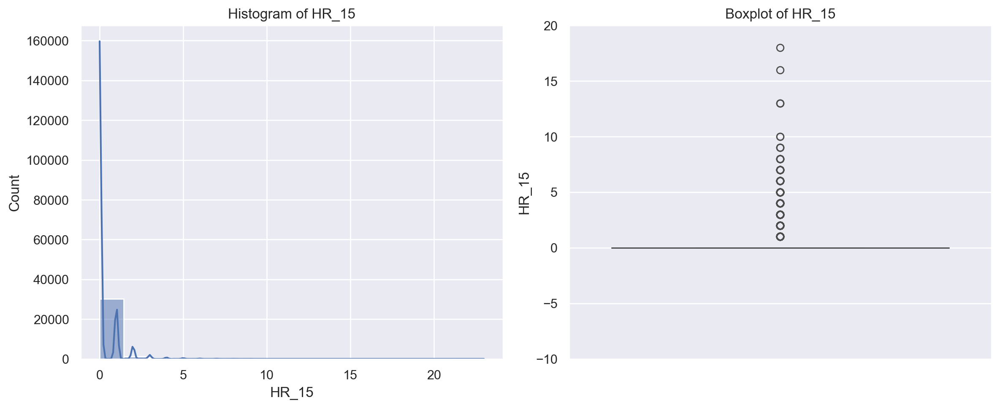

 Statistics for column: HR_16
  Mean: 0.36
  Median: 0.00
  Standard Deviation: 0.87
  Min: 0
  Max: 22
  Skewness: 4.62
  Kurtosis: 39.22
--------------------------------------------------
Count of outliers: 7143
Percentage of outliers: 22.41%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


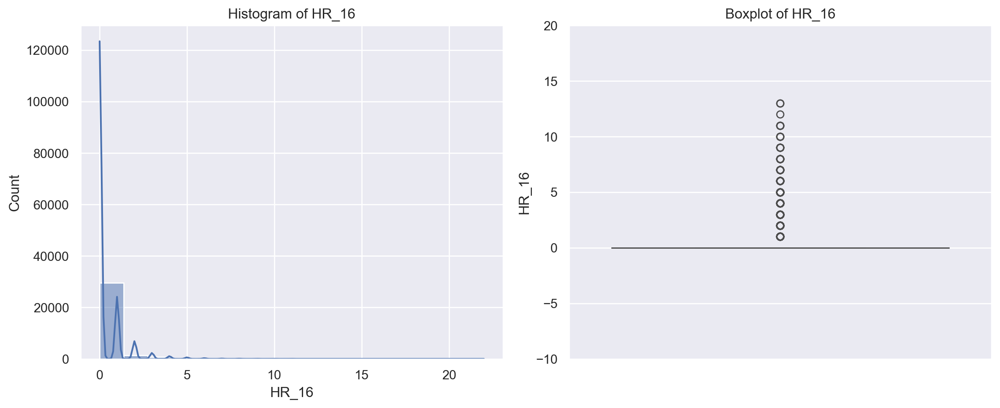

 Statistics for column: HR_17
  Mean: 0.39
  Median: 0.00
  Standard Deviation: 0.94
  Min: 0
  Max: 20
  Skewness: 4.94
  Kurtosis: 45.11
--------------------------------------------------
Count of outliers: 7614
Percentage of outliers: 23.89%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


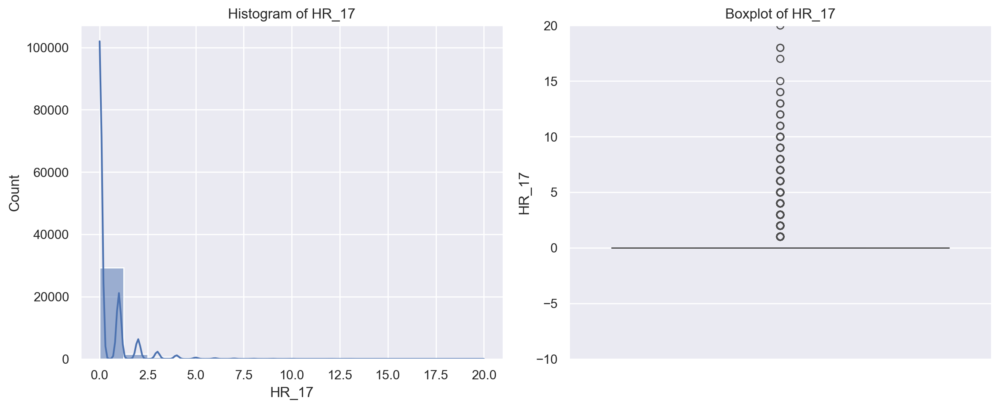

 Statistics for column: HR_18
  Mean: 0.34
  Median: 0.00
  Standard Deviation: 0.89
  Min: 0
  Max: 24
  Skewness: 5.79
  Kurtosis: 64.30
--------------------------------------------------
Count of outliers: 6691
Percentage of outliers: 20.99%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


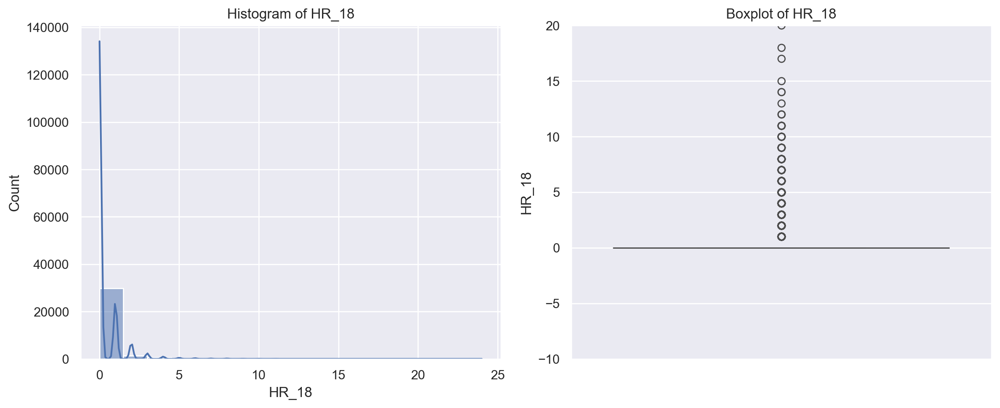

 Statistics for column: HR_19
  Mean: 0.25
  Median: 0.00
  Standard Deviation: 0.80
  Min: 0
  Max: 35
  Skewness: 8.72
  Kurtosis: 187.05
--------------------------------------------------
Count of outliers: 4891
Percentage of outliers: 15.34%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


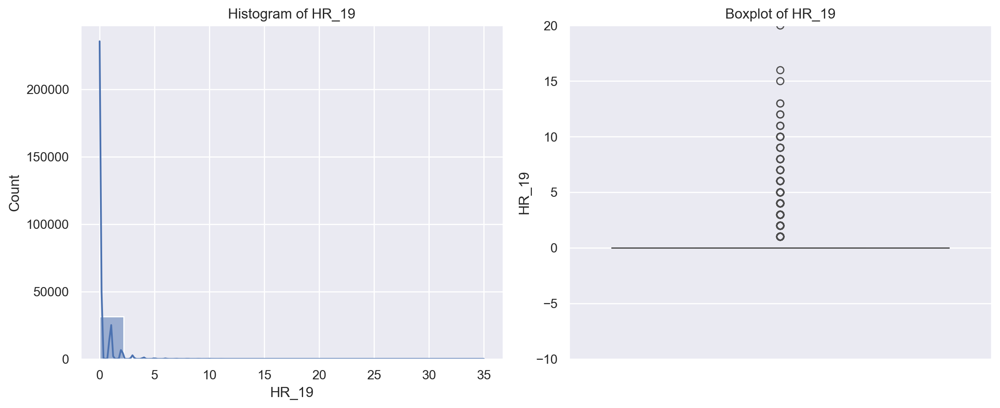

 Statistics for column: HR_20
  Mean: 0.14
  Median: 0.00
  Standard Deviation: 0.59
  Min: 0
  Max: 36
  Skewness: 13.97
  Kurtosis: 552.46
--------------------------------------------------
Count of outliers: 3068
Percentage of outliers: 9.63%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


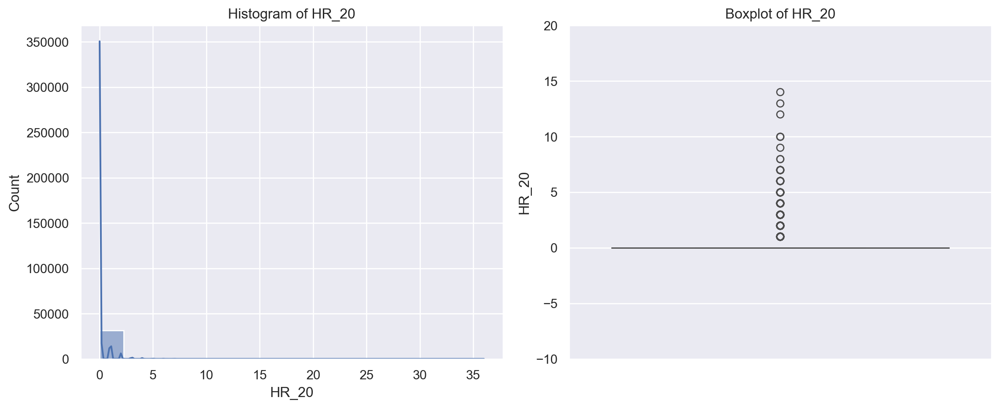

 Statistics for column: HR_21
  Mean: 0.07
  Median: 0.00
  Standard Deviation: 0.35
  Min: 0
  Max: 11
  Skewness: 8.54
  Kurtosis: 129.79
--------------------------------------------------
Count of outliers: 1760
Percentage of outliers: 5.52%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


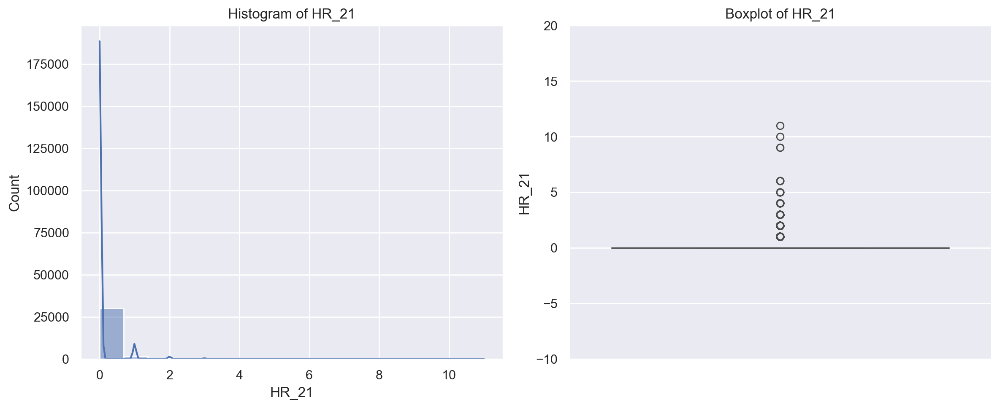

 Statistics for column: HR_22
  Mean: 0.05
  Median: 0.00
  Standard Deviation: 0.30
  Min: 0
  Max: 15
  Skewness: 13.13
  Kurtosis: 366.56
--------------------------------------------------
Count of outliers: 1181
Percentage of outliers: 3.71%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


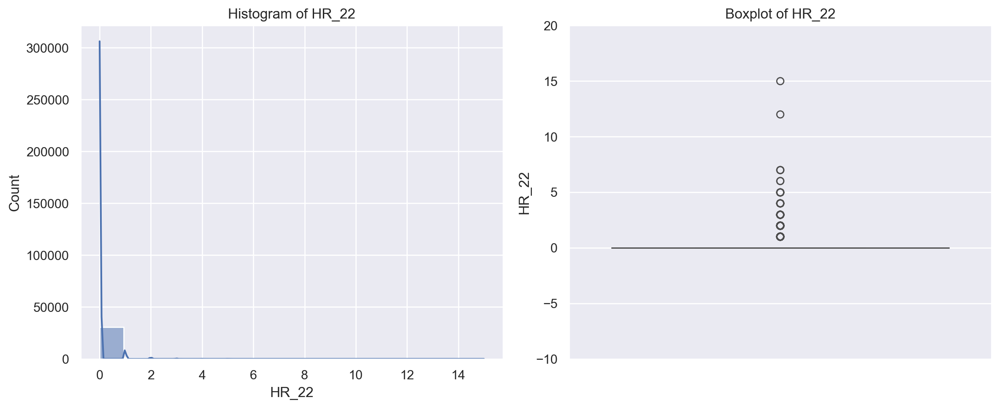

 Statistics for column: HR_23
  Mean: 0.05
  Median: 0.00
  Standard Deviation: 0.28
  Min: 0
  Max: 13
  Skewness: 12.24
  Kurtosis: 302.66
--------------------------------------------------
Count of outliers: 1123
Percentage of outliers: 3.52%
Lower Lim:0.0
Upper Lim:0.0
----------------------------------------


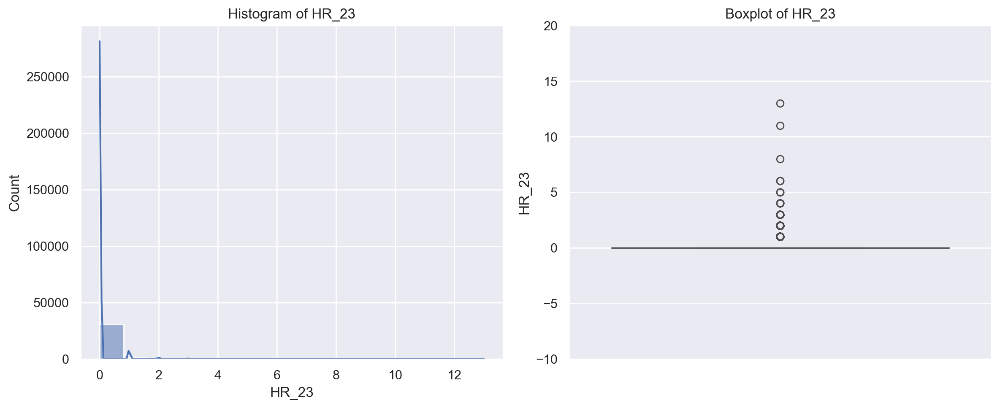

In [374]:
hr_bx= ['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5','HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 
        'HR_11', 'HR_12', 'HR_13','HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21','HR_22', 'HR_23']

for col in hr_bx:
    print(f" Statistics for column: {col}")
    
    # Calculate key statistics
    mean = df[col].mean()
    median = df[col].median()
    std_dev = df[col].std()
    min_val = df[col].min()
    max_val = df[col].max()
    skewness = df[col].skew()
    kurtosis = df[col].kurt()

    # Display the statistics
    print(f'  Mean: {mean:.2f}')
    print(f'  Median: {median:.2f}')
    print(f'  Standard Deviation: {std_dev:.2f}')
    print(f'  Min: {min_val}')
    print(f'  Max: {max_val}')
    print(f'  Skewness: {skewness:.2f}')
    print(f'  Kurtosis: {kurtosis:.2f}')
    print('-' * 50 )
    
    # Visualization of each Variable:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')

    #set fixed scale between -10 and 20 (to analyse better the outliers)
    plt.ylim(-10,20)
    
    # Analyze outliers for the numerical variables
    outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
    print(f'Count of outliers: {outlier_count}')
    print(f'Percentage of outliers: {outlier_percentage:.2f}%')
    print(f'Lower Lim:{lower_lim}')
    print(f'Upper Lim:{upper_lim}')
    print('-' * 40)
   
    plt.tight_layout()
    plt.show()

 Statistics for column: Sunday
  Mean: 0.56
  Median: 0.00
  Standard Deviation: 1.01
  Min: 0
  Max: 16
  Skewness: 3.33
  Kurtosis: 18.76
--------------------------------------------------
Count of outliers: 1405
Percentage of outliers: 4.41%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


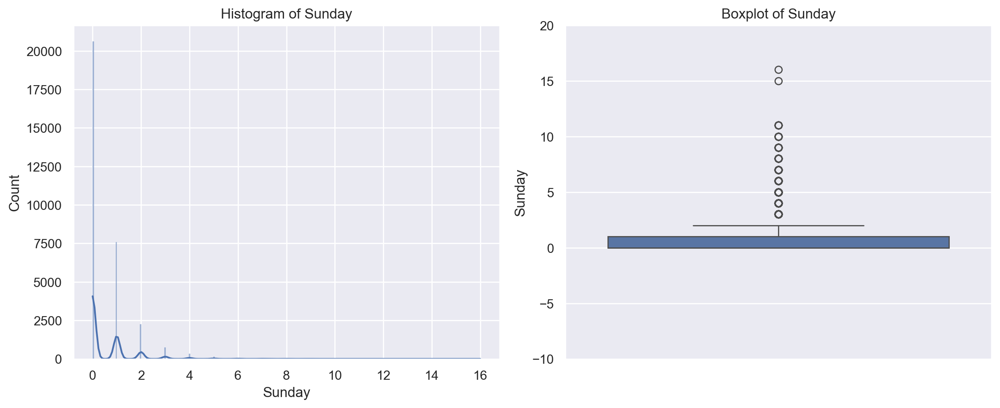

 Statistics for column: Monday
  Mean: 0.57
  Median: 0.00
  Standard Deviation: 1.04
  Min: 0
  Max: 17
  Skewness: 3.63
  Kurtosis: 24.38
--------------------------------------------------
Count of outliers: 1495
Percentage of outliers: 4.69%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


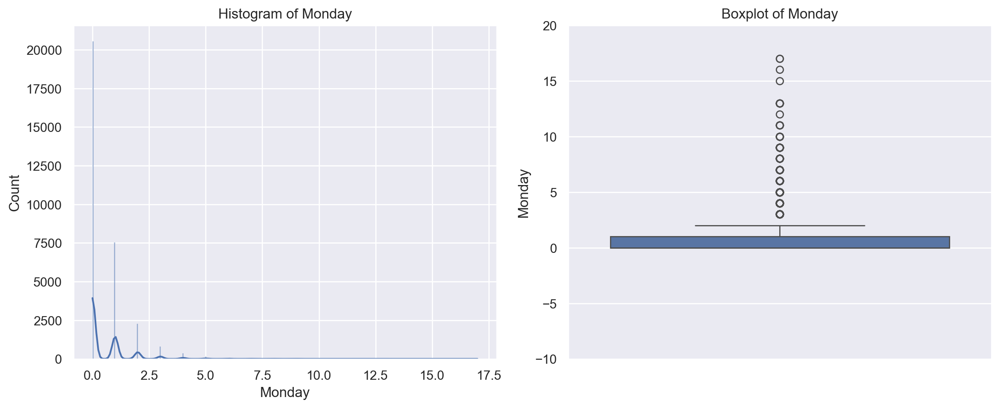

 Statistics for column: Tuesday
  Mean: 0.59
  Median: 0.00
  Standard Deviation: 1.05
  Min: 0
  Max: 15
  Skewness: 3.30
  Kurtosis: 19.43
--------------------------------------------------
Count of outliers: 1587
Percentage of outliers: 4.98%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


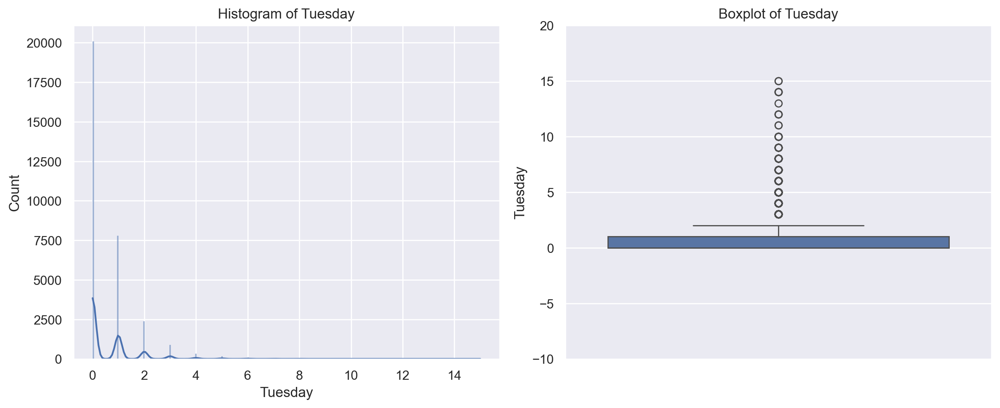

 Statistics for column: Wednesday
  Mean: 0.62
  Median: 0.00
  Standard Deviation: 1.07
  Min: 0
  Max: 17
  Skewness: 3.26
  Kurtosis: 19.28
--------------------------------------------------
Count of outliers: 1653
Percentage of outliers: 5.19%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


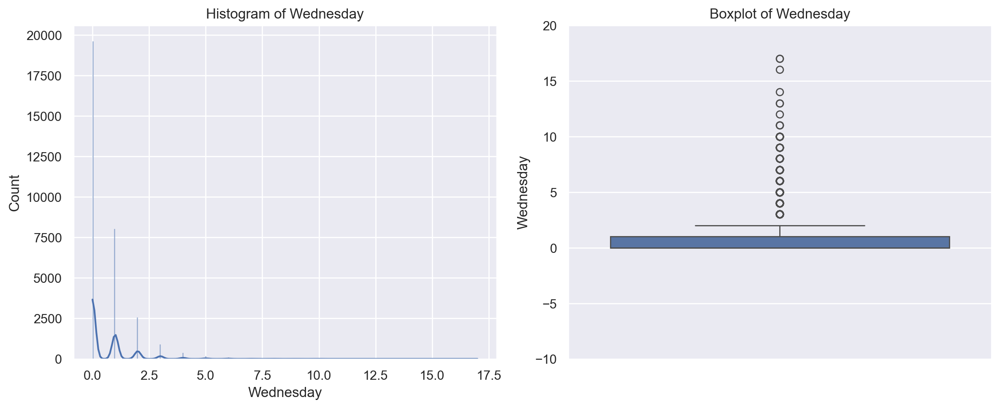

 Statistics for column: Thursday
  Mean: 0.68
  Median: 0.00
  Standard Deviation: 1.09
  Min: 0
  Max: 16
  Skewness: 3.04
  Kurtosis: 16.73
--------------------------------------------------
Count of outliers: 1784
Percentage of outliers: 5.60%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


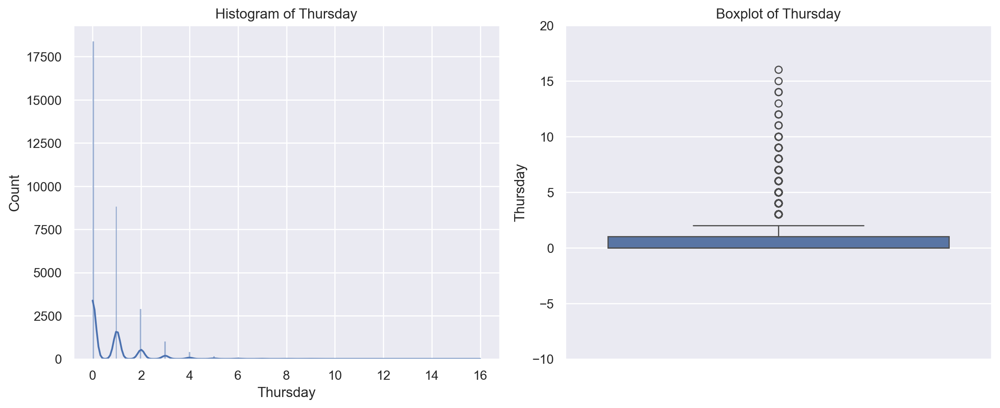

 Statistics for column: Friday
  Mean: 0.65
  Median: 0.00
  Standard Deviation: 1.07
  Min: 0
  Max: 20
  Skewness: 3.18
  Kurtosis: 19.58
--------------------------------------------------
Count of outliers: 1707
Percentage of outliers: 5.36%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


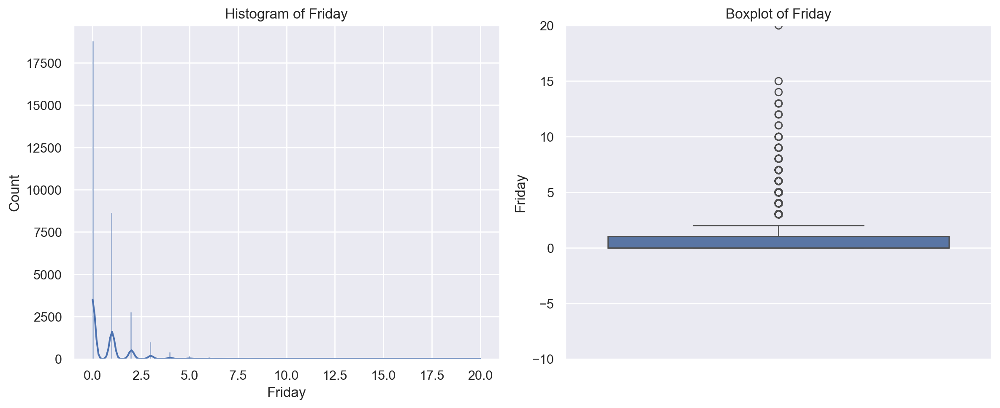

 Statistics for column: Saturday
  Mean: 0.70
  Median: 0.00
  Standard Deviation: 1.17
  Min: 0
  Max: 20
  Skewness: 3.23
  Kurtosis: 18.72
--------------------------------------------------
Count of outliers: 1978
Percentage of outliers: 6.21%
Lower Lim:-1.5
Upper Lim:2.5
----------------------------------------


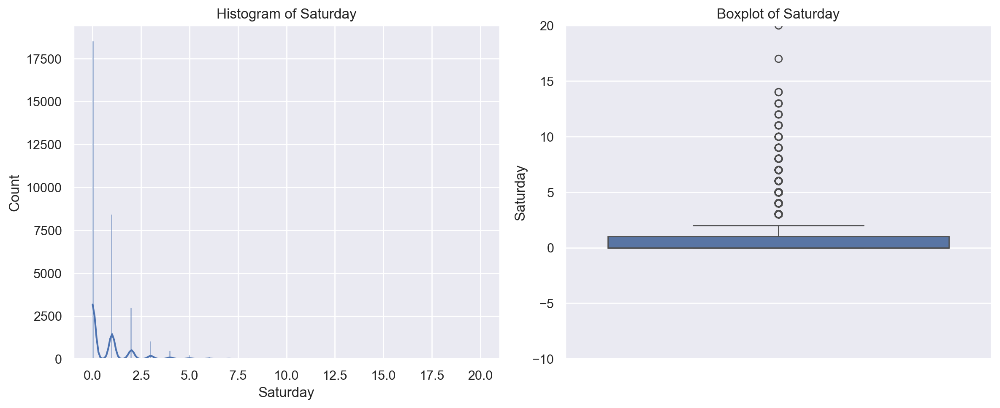

In [375]:
dow_bx=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday', 'Saturday']

for col in dow_bx:
    print(f" Statistics for column: {col}")
    
    # Calculate key statistics
    mean = df[col].mean()
    median = df[col].median()
    std_dev = df[col].std()
    min_val = df[col].min()
    max_val = df[col].max()
    skewness = df[col].skew()
    kurtosis = df[col].kurt()

    # Display the statistics
    print(f'  Mean: {mean:.2f}')
    print(f'  Median: {median:.2f}')
    print(f'  Standard Deviation: {std_dev:.2f}')
    print(f'  Min: {min_val}')
    print(f'  Max: {max_val}')
    print(f'  Skewness: {skewness:.2f}')
    print(f'  Kurtosis: {kurtosis:.2f}')
    print('-' * 50 )
    
    # Visualization of each Variable:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')

    #set fixed scale between -10 and 20 (to analyse better the outliers)
    plt.ylim(-10, 20)

    # Analyze outliers for the numerical variables
    outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
    print(f'Count of outliers: {outlier_count}')
    print(f'Percentage of outliers: {outlier_percentage:.2f}%')
    print(f'Lower Lim:{lower_lim}')
    print(f'Upper Lim:{upper_lim}')
    print('-' * 40)
   
    plt.tight_layout()
    plt.show()

In [376]:
#Define groups of columns of the same category
dow_columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hr_columns = [col for col in df.columns if col.startswith('HR_')]
CUI_columns = [col for col in df.columns if col.startswith('CUI_')]
#Define the sum of the columns
DOW_counts = df[dow_columns].sum()
HR_counts = df[hr_columns].sum()
CUI_counts = df[CUI_columns].sum()

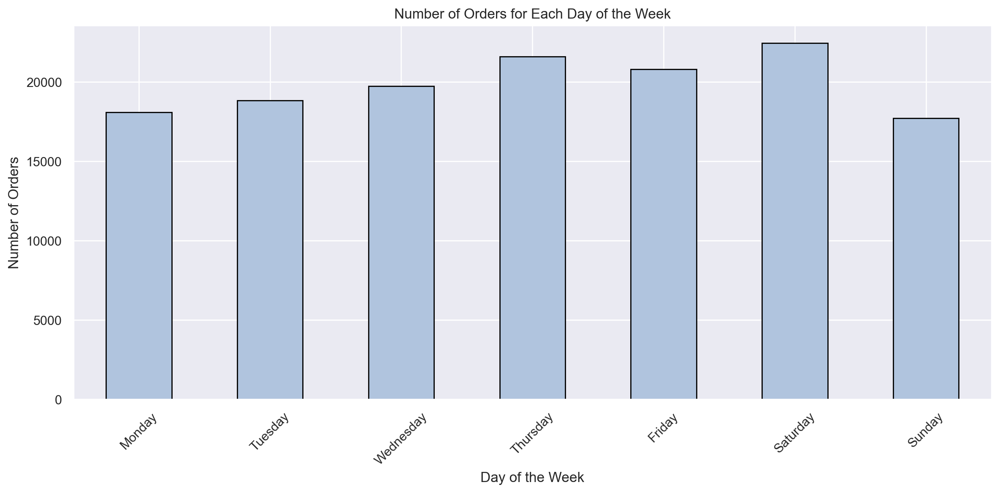

In [377]:
plt.figure(figsize=(12, 6))
DOW_counts.plot(kind='bar', 
                color='lightsteelblue', 
                edgecolor='black')

plt.title('Number of Orders for Each Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

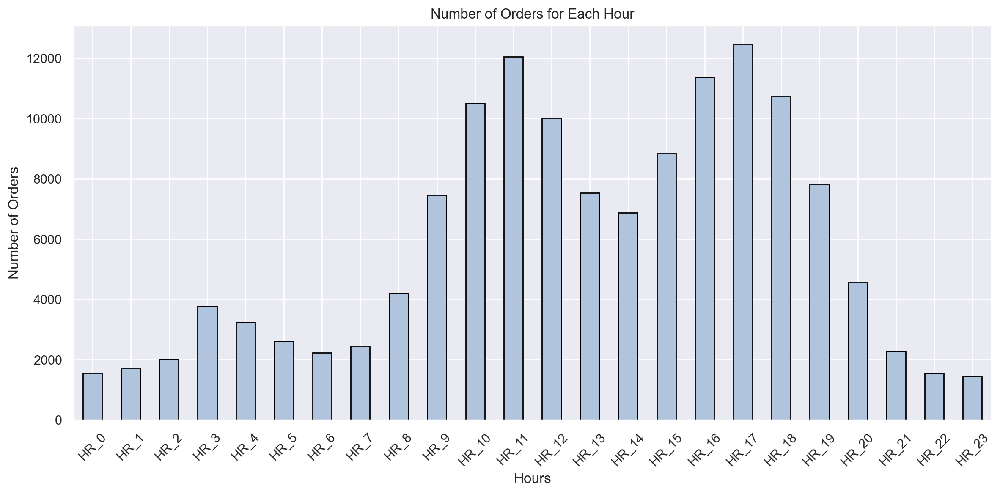

In [378]:
plt.figure(figsize=(12, 6))
HR_counts.plot(kind='bar', 
               color='lightsteelblue', 
               edgecolor='black')

plt.title('Number of Orders for Each Hour')
plt.xlabel('Hours')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

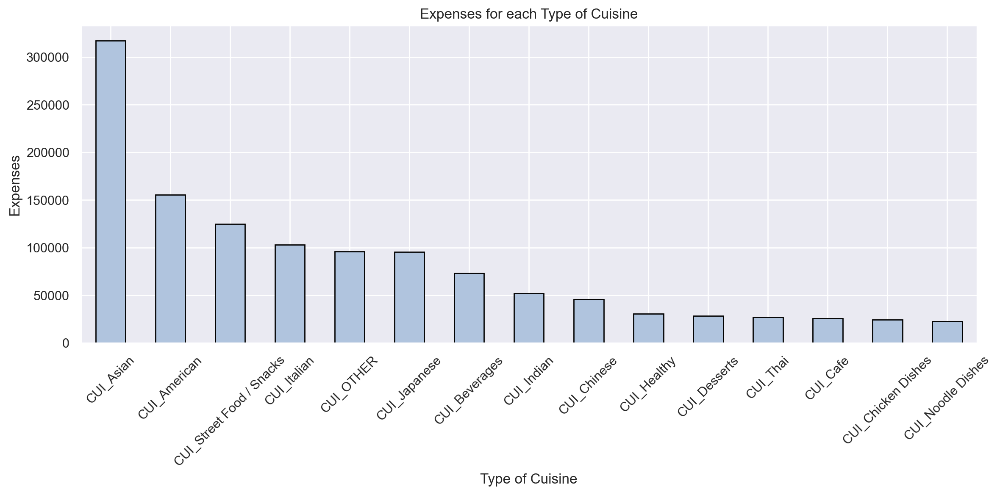

In [379]:
CUI_counts_sorted = CUI_counts.sort_values(ascending=False)

plt.figure(figsize=(12, 6))
CUI_counts_sorted.plot(kind='bar', 
                       color='lightsteelblue', 
                       edgecolor='black')

plt.title('Expenses for each Type of Cuisine')
plt.xlabel('Type of Cuisine')
plt.ylabel('Expenses')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

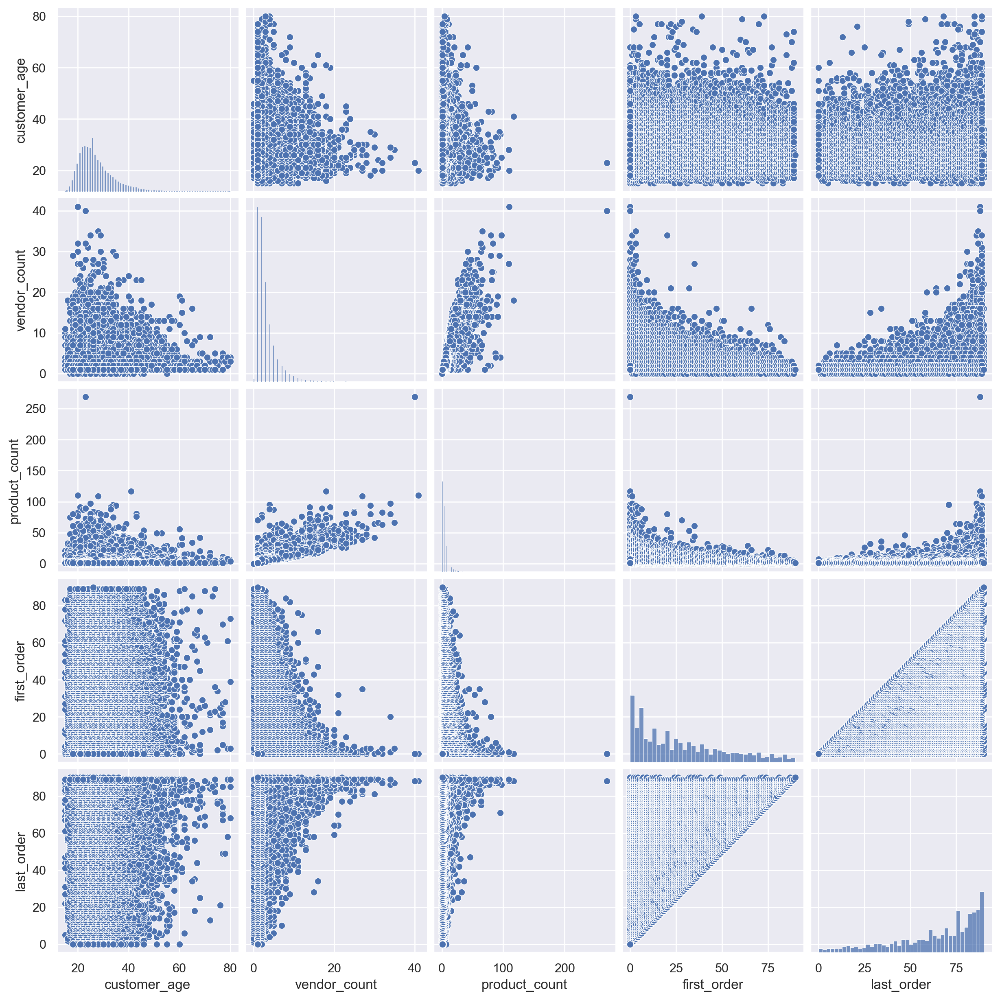

In [380]:
sns.pairplot(df, vars= numerical_features)

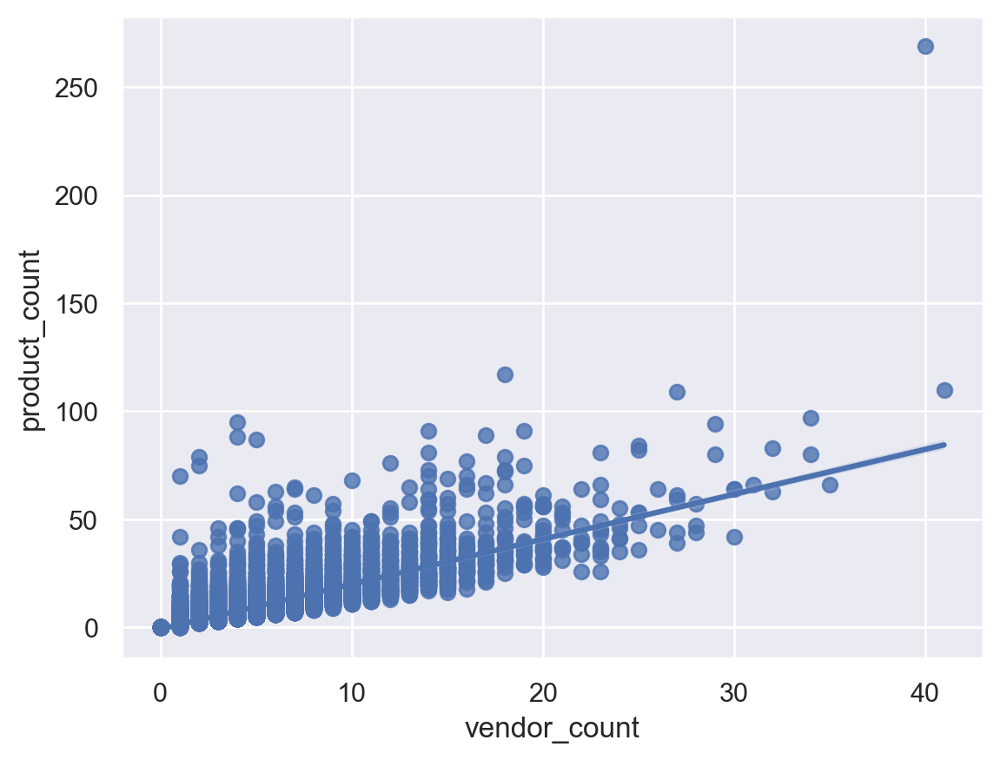

In [381]:
sns.regplot(x=df['vendor_count'], y=df['product_count'])
plt.show()

<a class="anchor" id="cat">

## 3.2 Categorical Features
    
</a>

Analysis for categorical column: customer_region
Frequency counts:
customer_region
8670    10203
4660     9550
2360     8829
2440     1483
4140      857
8370      495
2490      445
8550       13
Name: count, dtype: int64
--------------------------------------------------


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1930442003.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='viridis')


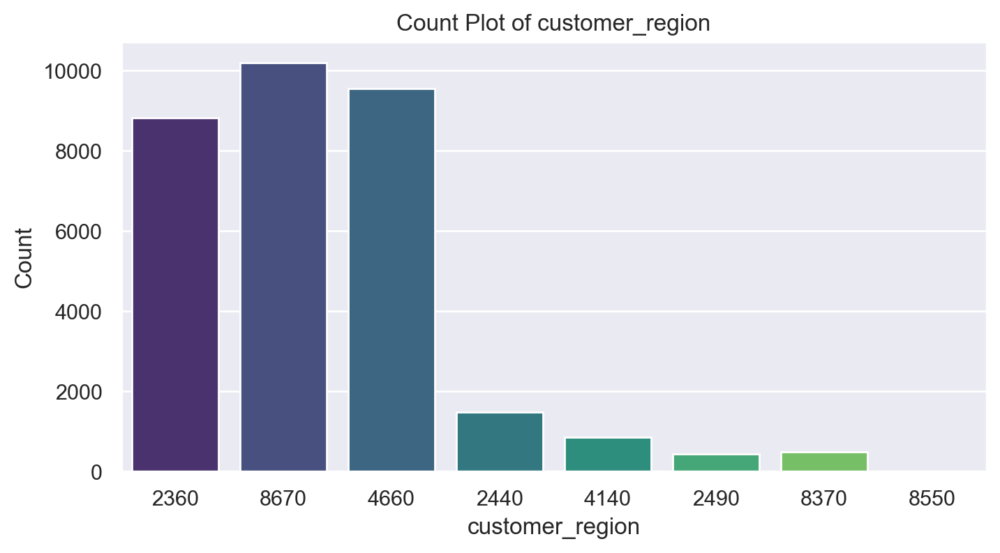

Analysis for categorical column: last_promo
Frequency counts:
last_promo
NO PROMO    16744
DELIVERY     6282
DISCOUNT     4496
FREEBIE      4353
Name: count, dtype: int64
--------------------------------------------------


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1930442003.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='viridis')


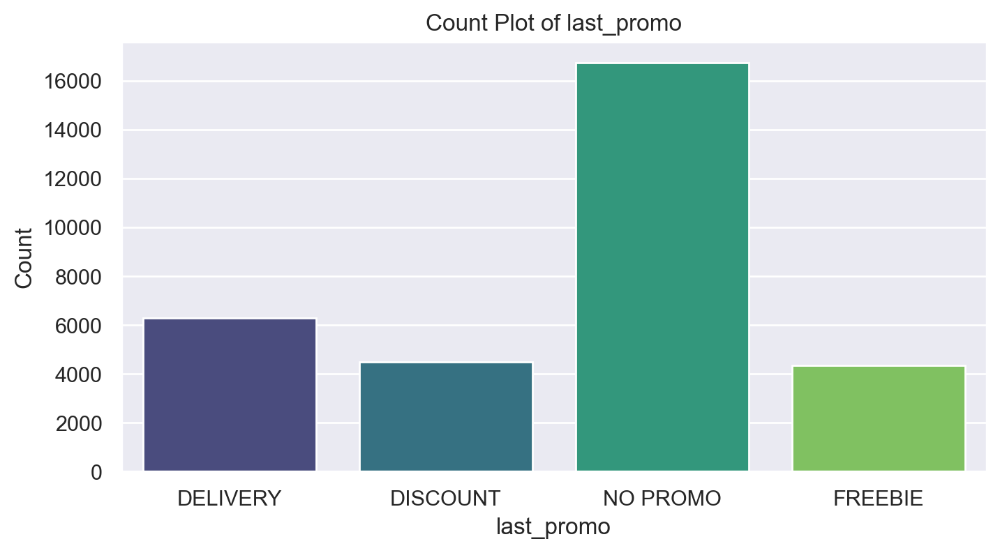

Analysis for categorical column: payment_method
Frequency counts:
payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64
--------------------------------------------------


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1930442003.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='viridis')


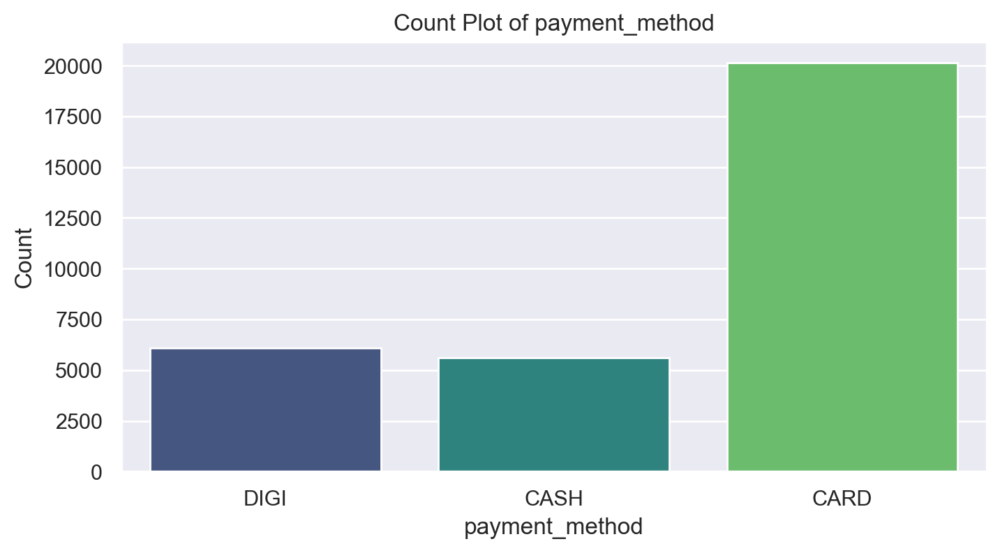

Analysis for categorical column: is_chain
Frequency counts:
is_chain
1    25776
0     6099
Name: count, dtype: int64
--------------------------------------------------


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1930442003.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='viridis')


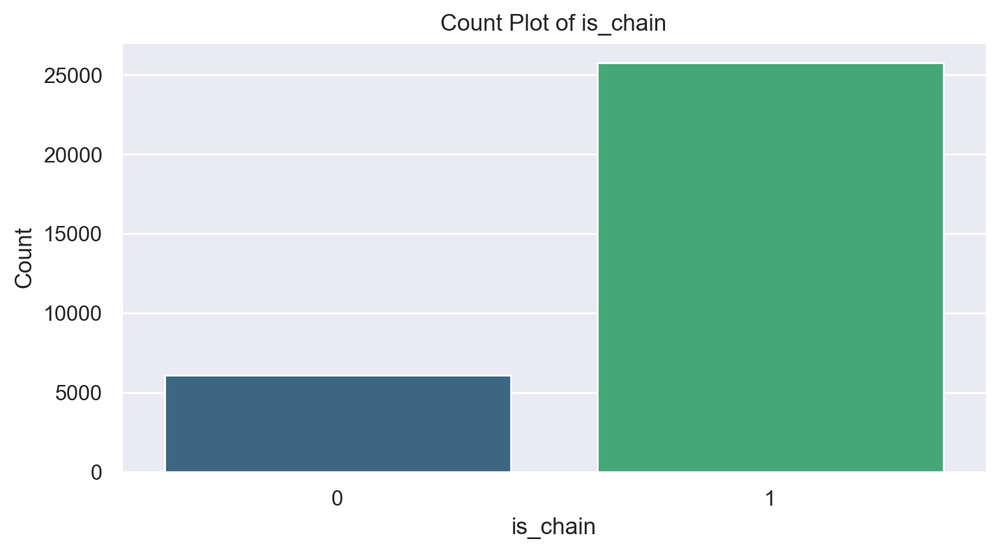

In [382]:
for col in categorical_features:
    print(f"Analysis for categorical column: {col}")
    
    # Calculate frequency counts
    freq_counts = df[col].value_counts()
    
    # Display the frequency counts
    print("Frequency counts:")
    print(freq_counts)
    print("-"*50 )
    
    # Visualization for categorical variables:
    plt.figure(figsize=(8, 4))
    sns.countplot(x=df[col], palette='viridis')
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3963137222.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='payment_method', data=df, ax=axes[1], palette="viridis")


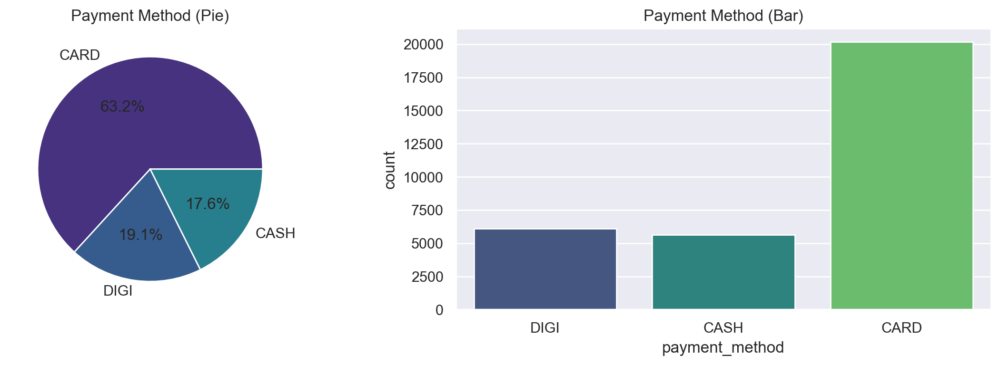

In [383]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot Pie Chart
df['payment_method'].value_counts().plot(
    kind='pie', 
    ax=axes[0],  
    title='Payment Method (Pie)', 
    autopct='%1.1f%%', 
    colors=sns.color_palette("viridis"), 
    ylabel="", 
    legend=False
)

# Plot Bar Chart
sns.countplot(x='payment_method', data=df, ax=axes[1], palette="viridis")
axes[1].set_title('Payment Method (Bar)')

# Adjust the layout to prevent overlapping
plt.tight_layout()

plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\272405882.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=customer_region_counts.index, y=customer_region_counts.values, ax=axes[1], palette="viridis")


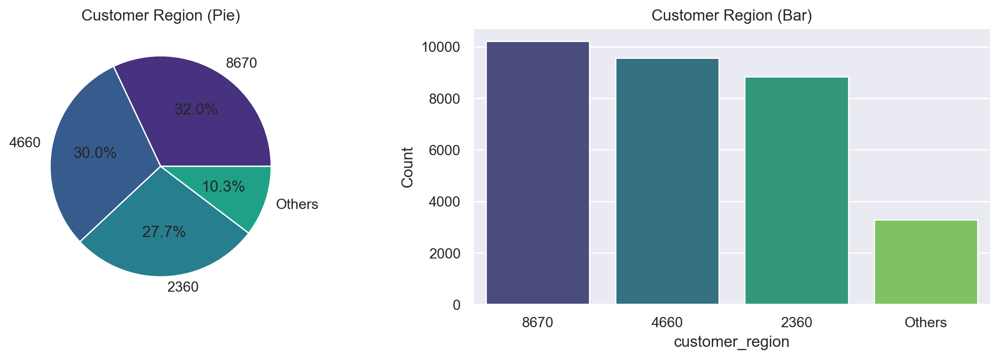

In [384]:
# Calculate the threshold for "Others"
threshold = 0.05 * df['customer_region'].value_counts().sum()

# Get value counts for customer_region
customer_region_counts = df['customer_region'].value_counts()

# Sum the regions smaller than the threshold
others = customer_region_counts[customer_region_counts < threshold].sum()

# Filter out the regions below the threshold and add "Others"
customer_region_counts = customer_region_counts[customer_region_counts >= threshold]
customer_region_counts['Others'] = others

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot Pie Chart
customer_region_counts.plot(
    kind='pie', 
    ax=axes[0],  
    title='Customer Region (Pie)', 
    autopct='%1.1f%%', 
    colors=sns.color_palette("viridis"), 
    ylabel="", 
    legend=False
)

# Plot Bar Chart
sns.barplot(x=customer_region_counts.index, y=customer_region_counts.values, ax=axes[1], palette="viridis")
axes[1].set_title('Customer Region (Bar)')
axes[1].set_ylabel('Count')  

# Adjust the layout to prevent overlapping
plt.tight_layout()

plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\2185225742.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=promo_category.index, y=promo_category.values, ax=axes[1], palette="viridis")


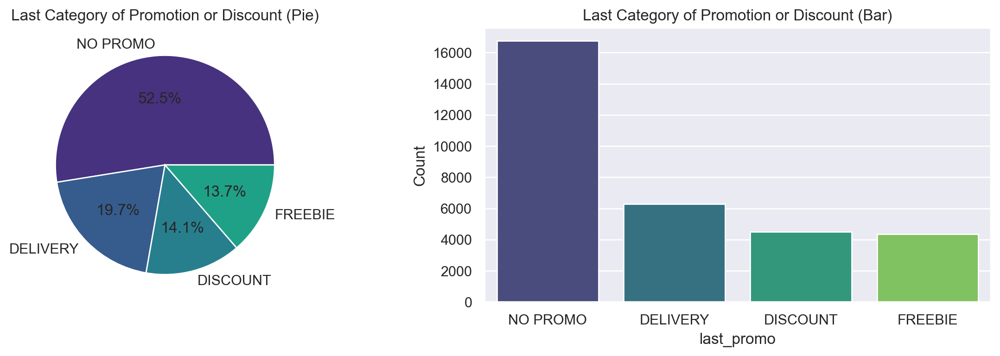

In [385]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Pie Chart for last_promo
promo_category = df['last_promo'].value_counts()
promo_category.plot(
    kind='pie', 
    ax=axes[0],  
    title='Last Category of Promotion or Discount (Pie)', 
    autopct='%1.1f%%', 
    colors=sns.color_palette("viridis"), 
    ylabel="", 
    legend=False
)

# Bar Chart for last_promo
sns.barplot(x=promo_category.index, y=promo_category.values, ax=axes[1], palette="viridis")
axes[1].set_title('Last Category of Promotion or Discount (Bar)')
axes[1].set_ylabel('Count')  

# Adjust the layout to prevent overlapping
plt.tight_layout()

plt.show()

<a class="anchor" id="out">

# 4. Outliers
    
</a>

<a class="anchor" id="outanalysis">

## 4.1 Analysis
    
</a>


In [386]:
#Define groups of columns of the same category
dow_columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hr_columns = [col for col in df.columns if col.startswith('HR_')]
CUI_columns = [col for col in df.columns if col.startswith('CUI_')]

#Define the sum of the columns
DOW_counts = df[dow_columns].sum()
HR_counts = df[hr_columns].sum()
CUI_counts = df[CUI_columns].sum()

In [387]:
combined_list_numerical = numerical_features + hr_columns + dow_columns + CUI_columns 

In [388]:
#computing the interquartile range 
q1= df[combined_list_numerical].quantile(0.25)
q3=df[combined_list_numerical].quantile(0.75)
iqr=q3-q1

#compute the limits 
lower_lim= q1-(1.5*iqr)
upper_lim=q3+(1.5*iqr)

for feature in combined_list_numerical: 
    print(f"{feature:<25} Lower Limit:{lower_lim[feature]:>10}      Upper Limit:{upper_lim[feature]:>10}")

customer_age              Lower Limit:      11.0      Upper Limit:      43.0
vendor_count              Lower Limit:      -3.5      Upper Limit:       8.5
product_count             Lower Limit:      -5.5      Upper Limit:      14.5
first_order               Lower Limit:     -50.0      Upper Limit:     102.0
last_order                Lower Limit:      -2.0      Upper Limit:     134.0
HR_0                      Lower Limit:       0.0      Upper Limit:       0.0
HR_1                      Lower Limit:       0.0      Upper Limit:       0.0
HR_2                      Lower Limit:       0.0      Upper Limit:       0.0
HR_3                      Lower Limit:       0.0      Upper Limit:       0.0
HR_4                      Lower Limit:       0.0      Upper Limit:       0.0
HR_5                      Lower Limit:       0.0      Upper Limit:       0.0
HR_6                      Lower Limit:       0.0      Upper Limit:       0.0
HR_7                      Lower Limit:       0.0      Upper Limit:       0.0

In [389]:
def identify_outliers(df, list, lower_lim, upper_lim):
    outliers = {}
    obvious_outliers = []

    for metric in combined_list_numerical:
        if metric not in df.columns:
            continue
        
        if metric not in lower_lim.keys() or metric not in upper_lim.keys():
            continue
        
        outliers[metric] = []
        llim = lower_lim[metric]
        ulim = upper_lim[metric]
        
        for i, value in enumerate(df[metric]):
            if pd.isna(value):
                continue
            
            if value < llim or value > ulim:
                outliers[metric].append(value)
        
        print(f"Total outliers in {metric}: {len(outliers[metric])}")

    # Check for observations that are outliers in all features (Obvious Outliers)
    for index, row in df.iterrows():
        is_global_outlier = True
        for metric in combined_list_numerical:
            if metric not in df.columns or metric not in lower_lim or metric not in upper_lim:
                is_global_outlier = False
                break
            
            value = row[metric]
            if pd.isna(value):
                is_global_outlier = False
                break
            
            llim = lower_lim[metric]
            ulim = upper_lim[metric]
            
            if llim <= value <= ulim:
                is_global_outlier = False
                break
        
        if is_global_outlier:
            obvious_outliers.append(index)
    print("-----------------------------")
    print(f"Total global outliers: {len(obvious_outliers)}")
    return outliers, obvious_outliers
    
    
outliers, obvious_outliers = identify_outliers(df, combined_list_numerical, lower_lim, upper_lim)

Total outliers in customer_age: 1083
Total outliers in vendor_count: 1523
Total outliers in product_count: 2370
Total outliers in first_order: 0
Total outliers in last_order: 0
Total outliers in HR_0: 1164
Total outliers in HR_1: 1283
Total outliers in HR_2: 1490
Total outliers in HR_3: 2521
Total outliers in HR_4: 2368
Total outliers in HR_5: 2026
Total outliers in HR_6: 1750
Total outliers in HR_7: 1893
Total outliers in HR_8: 2952
Total outliers in HR_9: 4923
Total outliers in HR_10: 6598
Total outliers in HR_11: 7530
Total outliers in HR_12: 6497
Total outliers in HR_13: 5454
Total outliers in HR_14: 5104
Total outliers in HR_15: 6038
Total outliers in HR_16: 7143
Total outliers in HR_17: 7614
Total outliers in HR_18: 6691
Total outliers in HR_19: 4891
Total outliers in HR_20: 3068
Total outliers in HR_21: 1760
Total outliers in HR_22: 1181
Total outliers in HR_23: 1123
Total outliers in Monday: 1495
Total outliers in Tuesday: 1587
Total outliers in Wednesday: 1653
Total outliers i

Since we know that aren't outliers in the variables first_order and last_order, let's remove this features and analyse if there are any Total global outliers

In [390]:
combined_list_numerical_ = [col for col in combined_list_numerical if col not in ['first_order', 'last_order']]

outliers, obvious_outliers = identify_outliers(df, combined_list_numerical_, lower_lim, upper_lim)

Total outliers in customer_age: 1083
Total outliers in vendor_count: 1523
Total outliers in product_count: 2370
Total outliers in first_order: 0
Total outliers in last_order: 0
Total outliers in HR_0: 1164
Total outliers in HR_1: 1283
Total outliers in HR_2: 1490
Total outliers in HR_3: 2521
Total outliers in HR_4: 2368
Total outliers in HR_5: 2026
Total outliers in HR_6: 1750
Total outliers in HR_7: 1893
Total outliers in HR_8: 2952
Total outliers in HR_9: 4923
Total outliers in HR_10: 6598
Total outliers in HR_11: 7530
Total outliers in HR_12: 6497
Total outliers in HR_13: 5454
Total outliers in HR_14: 5104
Total outliers in HR_15: 6038
Total outliers in HR_16: 7143
Total outliers in HR_17: 7614
Total outliers in HR_18: 6691
Total outliers in HR_19: 4891
Total outliers in HR_20: 3068
Total outliers in HR_21: 1760
Total outliers in HR_22: 1181
Total outliers in HR_23: 1123
Total outliers in Monday: 1495
Total outliers in Tuesday: 1587
Total outliers in Wednesday: 1653
Total outliers i

In [391]:
# filter that will verify if an observation has every characteristic in the Interquartile Range or not 
filters_iqr = []                                            
for metric in combined_list_numerical:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters_iqr.append(df[metric].between(llim, ulim, inclusive='neither'))

filters_iqr_all = pd.concat(filters_iqr, axis=1).all(axis=1)

In [392]:
filters_iqr

[0        True
 1        True
 2        True
 3        True
 4        True
          ... 
 31883    True
 31884    True
 31885    True
 31886    True
 31887    True
 Name: customer_age, Length: 31875, dtype: boolean,
 0        True
 1        True
 2        True
 3        True
 4        True
          ... 
 31883    True
 31884    True
 31885    True
 31886    True
 31887    True
 Name: vendor_count, Length: 31875, dtype: bool,
 0        True
 1        True
 2        True
 3        True
 4        True
          ... 
 31883    True
 31884    True
 31885    True
 31886    True
 31887    True
 Name: product_count, Length: 31875, dtype: bool,
 0        True
 1        True
 2        True
 3        True
 4        True
          ... 
 31883    True
 31884    True
 31885    True
 31886    True
 31887    True
 Name: first_order, Length: 31875, dtype: boolean,
 0        True
 1        True
 2        True
 3        True
 4        True
          ... 
 31883    True
 31884    True
 31885    True
 31

In [393]:
filters_iqr_all  

0        False
1        False
2        False
3        False
4        False
         ...  
31883    False
31884    False
31885    False
31886    False
31887    False
Length: 31875, dtype: boolean

In [394]:
len(df[df[filters_iqr_all] == 'False'])      #These are the features that have at least one of its characteristics considered as an outlier (out of the IQR)

31875

In [395]:
df_iqr = df[filters_iqr_all]
print('Percentage of data kept after removing outliers:', 100*(np.round(df_iqr.shape[0] / df.shape[0], decimals=2)))

Percentage of data kept after removing outliers: 0.0


<a class="anchor" id="remove">

## 4.2 Manual Removal
    
</a>

In [396]:
filters_man = (
     (df['customer_age']<=80)  
    &
    (df['vendor_count']<=40)
    &
    (df['product_count']<=80)  
    &
    (df['is_chain']<=60)
    &
    (df['HR_0']<=10)
    &
    (df['HR_1']<=10)
    &
    (df['HR_2']<=10)  
    &
    (df['HR_3']<=10) 
    &
    (df['HR_4']<=10) 
    &
    (df['HR_5']<=10) 
    &
    (df['HR_6']<=10) 
    &
    (df['HR_7']<=10) 
    &
    (df['HR_8']<=15) 
    &
    (df['HR_9']<=15) 
    &
    (df['HR_10']<=15) 
    &
    (df['HR_11']<=15) 
    &
    (df['HR_12']<=15) 
    &
    (df['HR_13']<=15) 
    &
    (df['HR_14']<=10) 
    &
    (df['HR_15']<=10) 
    &
    (df['HR_16']<=15) 
    &
    (df['HR_17']<=15) 
    &
    (df['HR_18']<=15) 
    &
    (df['HR_19']<=15) 
    &
    (df['HR_20']<=10) 
    &
    (df['HR_21']<=10) 
    &
    (df['HR_22']<=10) 
    &
    (df['HR_23']<=10) 
    &
    (df['CUI_American']<=150)
    &
    (df['CUI_Asian']<=200)
    &
    (df['CUI_Beverages']<=150)  
    &
    (df['CUI_Cafe']<=150) 
    &
    (df['CUI_Chicken Dishes']<=50) 
    &
    (df['CUI_Chinese']<=100) 
    &
    (df['CUI_Desserts']<=100) 
    &
    (df['CUI_Healthy']<=150) 
    &
    (df['CUI_Indian']<=150) 
    &
    (df['CUI_Italian']<=150) 
    &
    (df['CUI_Japanese']<=150) 
    &
    (df['CUI_Noodle Dishes']<=100) 
    &
    (df['CUI_OTHER']<=200) 
    &
    (df['CUI_Street Food / Snacks']<=200) 
    &
    (df['CUI_Thai']<=150)
    & 
    (df['Sunday']<=15)
    &
    (df['Monday']<=15)
    &
    (df['Tuesday']<=15)  
    &
    (df['Wednesday']<=15) 
    &
    (df['Thursday']<=15) 
    &
    (df['Friday']<=15) 
    &
    (df['Saturday']<=15)  
)

df_outliers = df[filters_man]


In [397]:
print('Percentage of data kept after removing outliers:', 100*(np.round(df_outliers.shape[0] / df.shape[0], decimals=5)))

Percentage of data kept after removing outliers: 99.288


In [398]:
df = df[filters_man]

<a class="anchor" id="featengi">

# 5. Feature Engineering
    
</a>

  - Time Periods

In [399]:
#Time Periods
df['early_morning(0h-5h)'] = df.filter(regex=r'^HR_[0-5]$').sum(axis=1).astype(int)

df['morning(6h-11h)'] = df.filter(regex=r'^HR_([6-9]|1[0-1])$').sum(axis=1).astype(int)

df['afternoon(12h-17h)']= df.filter(regex=r'^HR_1[2-7]$').sum(axis=1).astype(int)

df['night(18h-23h)'] = df.filter(regex=r'^HR_(1[8-9]|2[0-3])$').sum(axis=1).astype(int)

time_columns = ['early_morning(0h-5h)','morning(6h-11h)','afternoon(12h-17h)', 'night(18h-23h)']
time_counts = df[time_columns].sum()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1270047862.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['early_morning(0h-5h)'] = df.filter(regex=r'^HR_[0-5]$').sum(axis=1).astype(int)
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1270047862.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['morning(6h-11h)'] = df.filter(regex=r'^HR_([6-9]|1[0-1])$').sum(axis=1).astype(int)
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1270047862.py:6: SettingWithCopyWarning: 
A value is trying to b

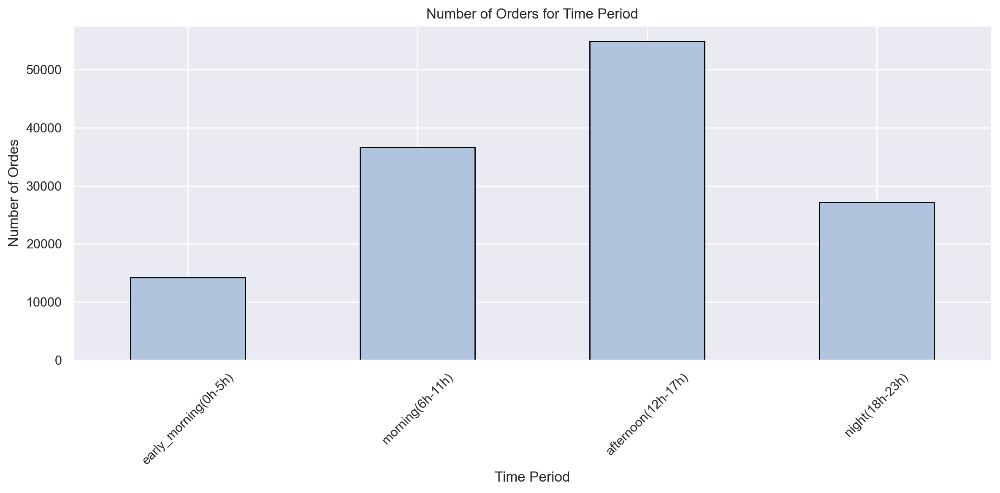

In [400]:
plt.figure(figsize=(12, 6))
time_counts.plot(kind='bar', 
                 color='lightsteelblue', 
                 edgecolor='black')

plt.title('Number of Orders for Time Period')
plt.xlabel('Time Period')
plt.ylabel('Number of Ordes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

  - Age Group

In [401]:
#Age Group
age_labels = ['Teenagers (15-19)', 'Young Adults (20-29)', 'Adults (30-49)', 'Middle-aged (50-64)', 'Seniors (65+)']
df['age_group'] = pd.cut(df['customer_age'], 
                         bins=[15, 20, 30, 50, 65, np.inf], 
                         labels=age_labels, 
                         right=False)

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3701566984.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['age_group'] = pd.cut(df['customer_age'],


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\826274190.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='age_group', data=df, palette='viridis')


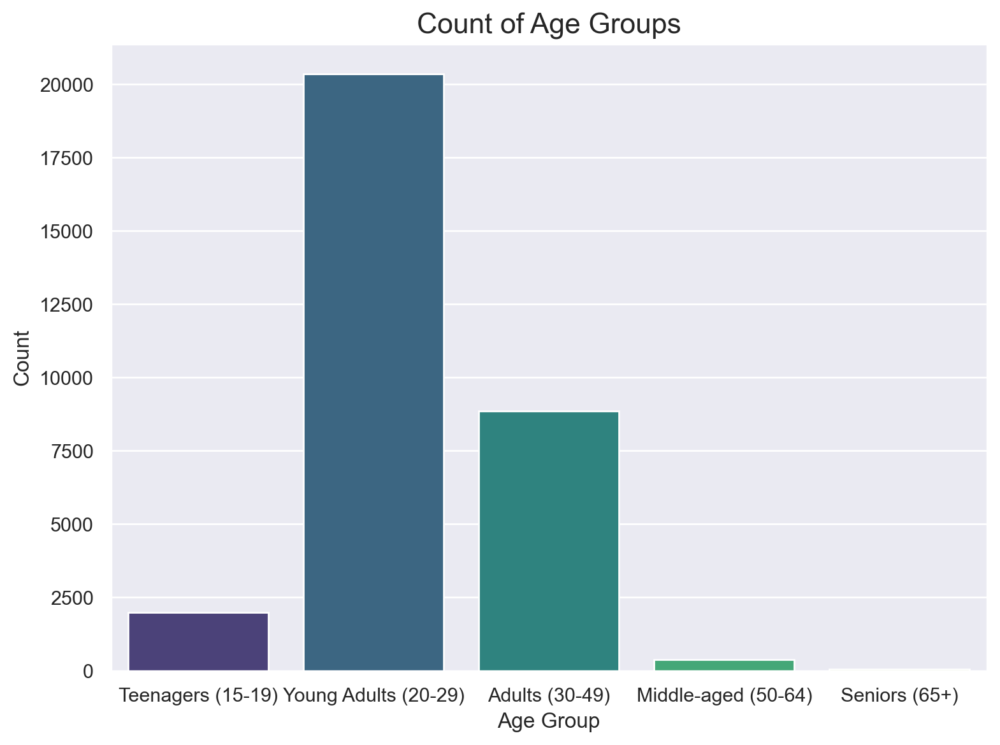

In [402]:
plt.figure(figsize=(8, 6))
sns.countplot(x='age_group', data=df, palette='viridis')

plt.title('Count of Age Groups', fontsize=16)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.tight_layout()
plt.show()

- Sum of Orders

In [403]:
#Define a new Feature that contains the sum of orders by customer (it has the same info as DOW_counts and HR_counts)
df['Sum_of_Orders'] = df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']].sum(axis=1)

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\440476729.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sum_of_Orders'] = df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']].sum(axis=1)


  Mean: 4.20
  Median: 3.00
  Standard Deviation: 4.41
  Min: 0
  Max: 61
  Skewness: 3.28
  Kurtosis: 17.03
--------------------------------------------------
Count of outliers: 2821
Percentage of outliers: 8.91%
Lower Lim:-2.5
Upper Lim:9.5
----------------------------------------


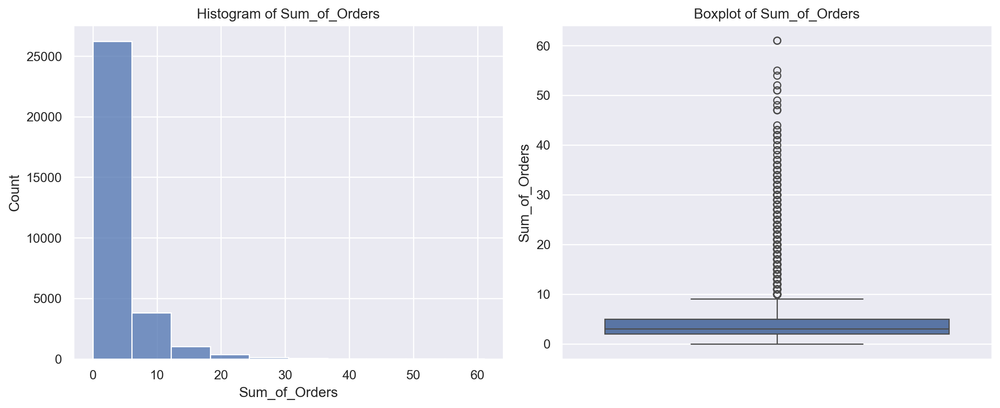

In [404]:
col='Sum_of_Orders'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

- Recency

In [405]:
# Determine the maximum number of days (most recent day in dataset)
max_days = df['last_order'].max()

# Calculate recency
df['recency'] = max_days - df['last_order']

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1236434135.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['recency'] = max_days - df['last_order']


  Mean: 26.47
  Median: 20.00
  Standard Deviation: 23.24
  Min: 0
  Max: 90
  Skewness: 0.92
  Kurtosis: -0.15
--------------------------------------------------
Count of outliers: 0
Percentage of outliers: 0.00%
Lower Lim:-44.0
Upper Lim:92.0
----------------------------------------


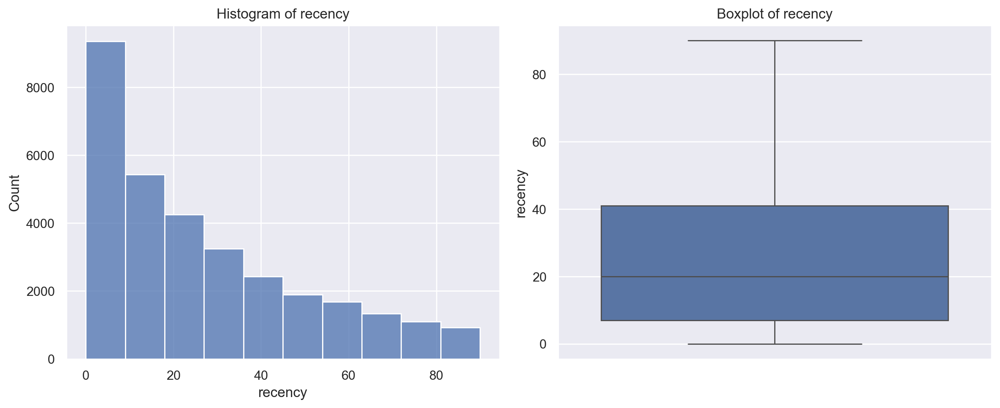

In [406]:
col='recency'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

- Frequency

In [407]:
# Calculate active period
df['active_period'] = df['last_order'] - df['first_order'] + 1

# Calculate frequency
df['frequency'] = df['Sum_of_Orders'] / df['active_period']

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1276780147.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['active_period'] = df['last_order'] - df['first_order'] + 1
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1276780147.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['frequency'] = df['Sum_of_Orders'] / df['active_period']


  Mean: 0.35
  Median: 0.13
  Standard Deviation: 0.42
  Min: 0.0
  Max: 4.0
  Skewness: 1.51
  Kurtosis: 2.36
--------------------------------------------------
Count of outliers: 330
Percentage of outliers: 1.04%
Lower Lim:-0.710126582278481
Upper Lim:1.3860759493670884
----------------------------------------


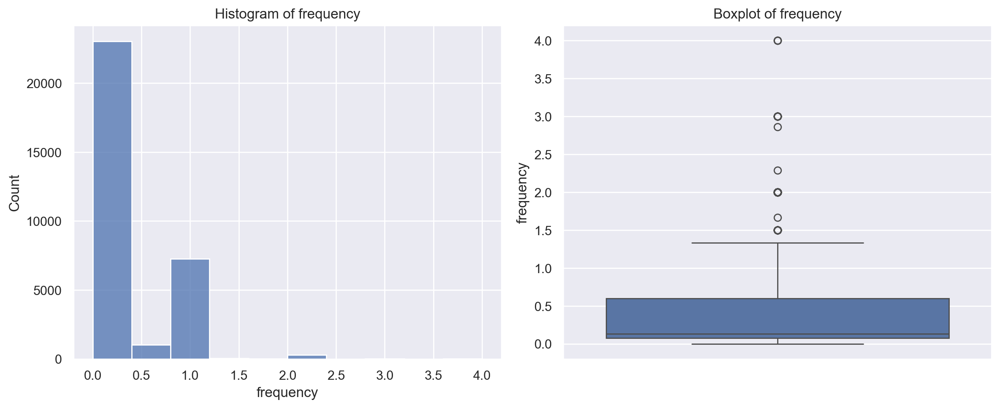

In [408]:
col='frequency'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

- Monetary 

In [409]:
# Total spend per customer
df['total_spend'] = df[CUI_columns].sum(axis=1)

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3594714597.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['total_spend'] = df[CUI_columns].sum(axis=1)


  Mean: 36.47
  Median: 24.04
  Standard Deviation: 39.01
  Min: 0.0
  Max: 467.37
  Skewness: 2.89
  Kurtosis: 12.42
--------------------------------------------------
Count of outliers: 2520
Percentage of outliers: 7.96%
Lower Lim:-34.19499999999999
Upper Lim:91.12499999999999
----------------------------------------


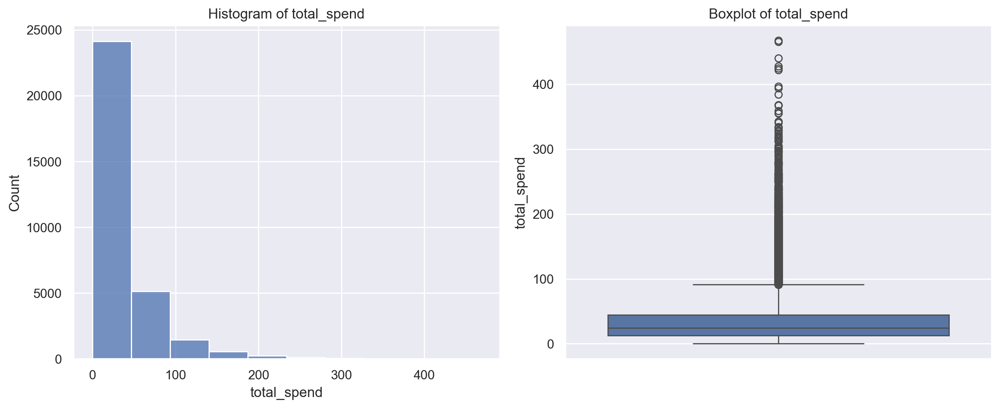

In [410]:
col='total_spend'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

RFM 
- Recency = 'recency'
- Frequency = 'frequency'
- moentary = 'total spend'

- Cuisine Diversity 

We decided to create a new variable called cuisine_diversity to measure the variety of cuisines each customer orders from. This variable will help us analyze which age groups or regions tend to explore a wider range of cuisines, indicating openness to new experiences. Conversely, it will allow us to identify customers who stick to fewer options, showing a strong preference for specific types of cuisine 

In [411]:
# Cuisine diversity (number of different cuisines ordered)
df['cuisine_diversity'] = (df[CUI_columns] > 0).sum(axis=1)

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\2039353440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cuisine_diversity'] = (df[CUI_columns] > 0).sum(axis=1)


  Mean: 2.26
  Median: 2.00
  Standard Deviation: 1.46
  Min: 0
  Max: 12
  Skewness: 1.65
  Kurtosis: 3.60
--------------------------------------------------
Count of outliers: 616
Percentage of outliers: 1.95%
Lower Lim:-2.0
Upper Lim:6.0
----------------------------------------


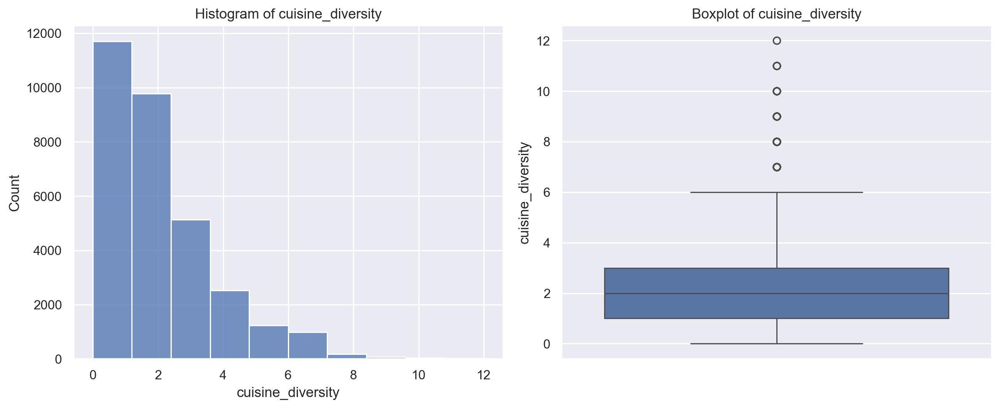

In [412]:
col='cuisine_diversity'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

- City
  
Aggregate Regions by the First Digit, which indicates the City

In [413]:
# Creating new Feature customer_city dividied into categories 
def categorize_city(customer_region):
    if pd.isna(customer_region):  # Check if the value is NaN
        return np.nan 
    elif customer_region== "-":
        return "Other"
    elif customer_region[0].isdigit():
        return customer_region[0]
    else:
        return "Other"


# Apply the function to create the new 'customer_city' column
df['customer_city'] = df['customer_region'].apply(categorize_city)

print(df['customer_city'].value_counts(dropna=False))

customer_city
2    10689
8    10618
4    10341
Name: count, dtype: int64


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\2581997637.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['customer_city'] = df['customer_region'].apply(categorize_city)


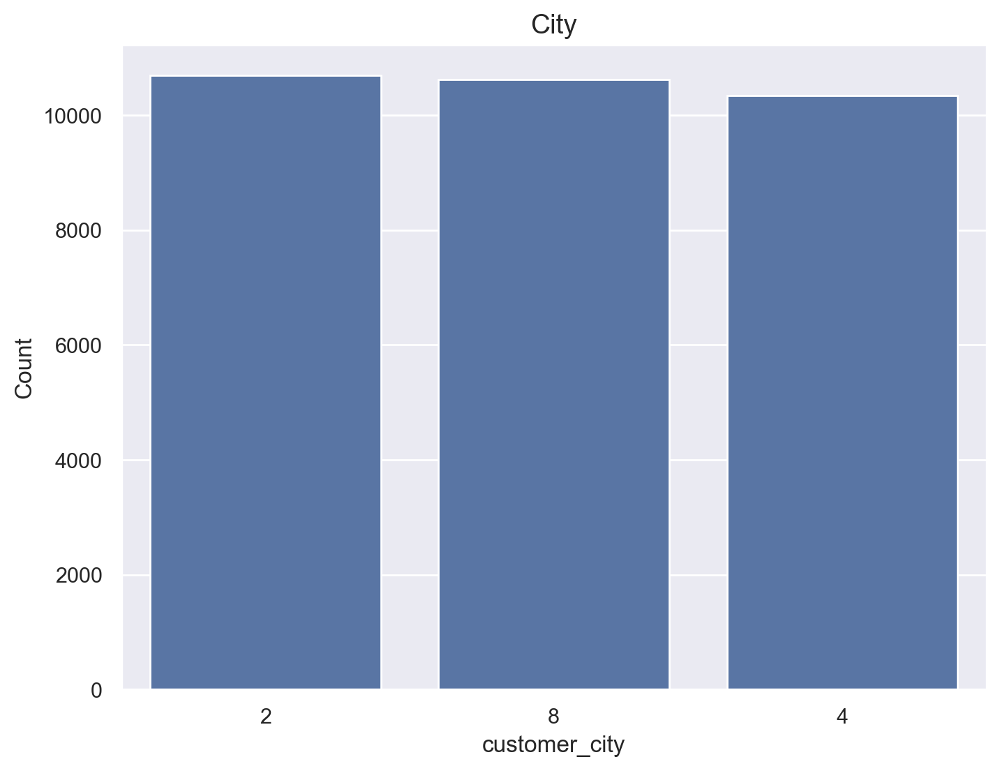

In [414]:
# Create the count plot
plt.figure(figsize=(8,6))
sns.countplot(x='customer_city', data=df)

# Add titles and labels
plt.title('City', fontsize=14)
plt.xlabel('customer_city', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.show()

- Weekdays and Weekends

In [415]:
df['Weekdays'] = df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']].sum(axis=1)
df['Weekends'] = df[['Saturday', 'Sunday']].sum(axis=1)

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1946503707.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Weekdays'] = df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']].sum(axis=1)
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1946503707.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Weekends'] = df[['Saturday', 'Sunday']].sum(axis=1)


<a class="anchor" id="visualization">

# 6. Visualizations
    
</a>

<a class="anchor" id="corr">

## 6.1 Correlations and Heatmaps
    
</a>

In [416]:
df_corr = df[['customer_age', 
              'vendor_count',
               'product_count', 
              'first_order', 
              'last_order'
             ]].corr()
df_corr

,customer_age,vendor_count,product_count,first_order,last_order
customer_age,1.000000,0.001857,0.006628,0.004197,0.012600
vendor_count,0.001857,1.000000,0.857508,-0.385749,0.381431
product_count,0.006628,0.857508,1.000000,-0.380161,0.377377
first_order,0.004197,-0.385749,-0.380161,1.000000,0.234963
last_order,0.012600,0.381431,0.377377,0.234963,1.000000


Text(0.5, 1.0, 'Correlation Heatmap between numerical variables')

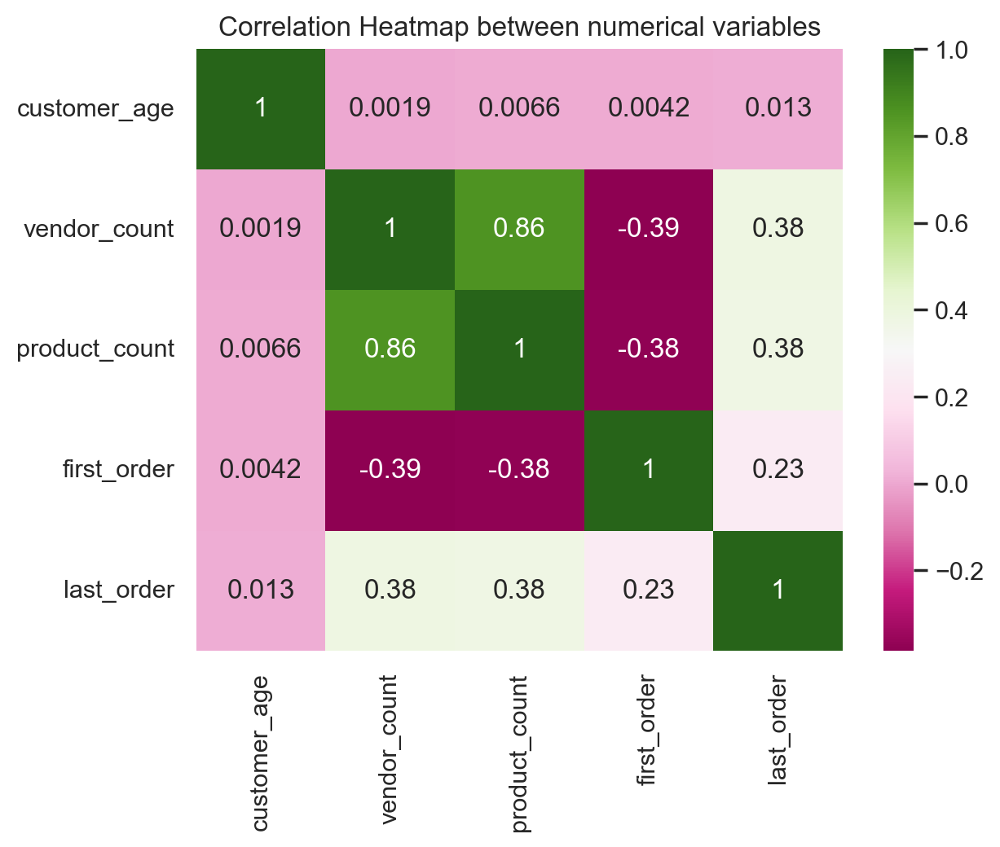

In [417]:
sns.heatmap(df_corr, 
            annot=True, 
            cmap='PiYG')

plt.title('Correlation Heatmap between numerical variables', fontsize=12)

- product_count and vendor_count have a very high correlation (0,83)

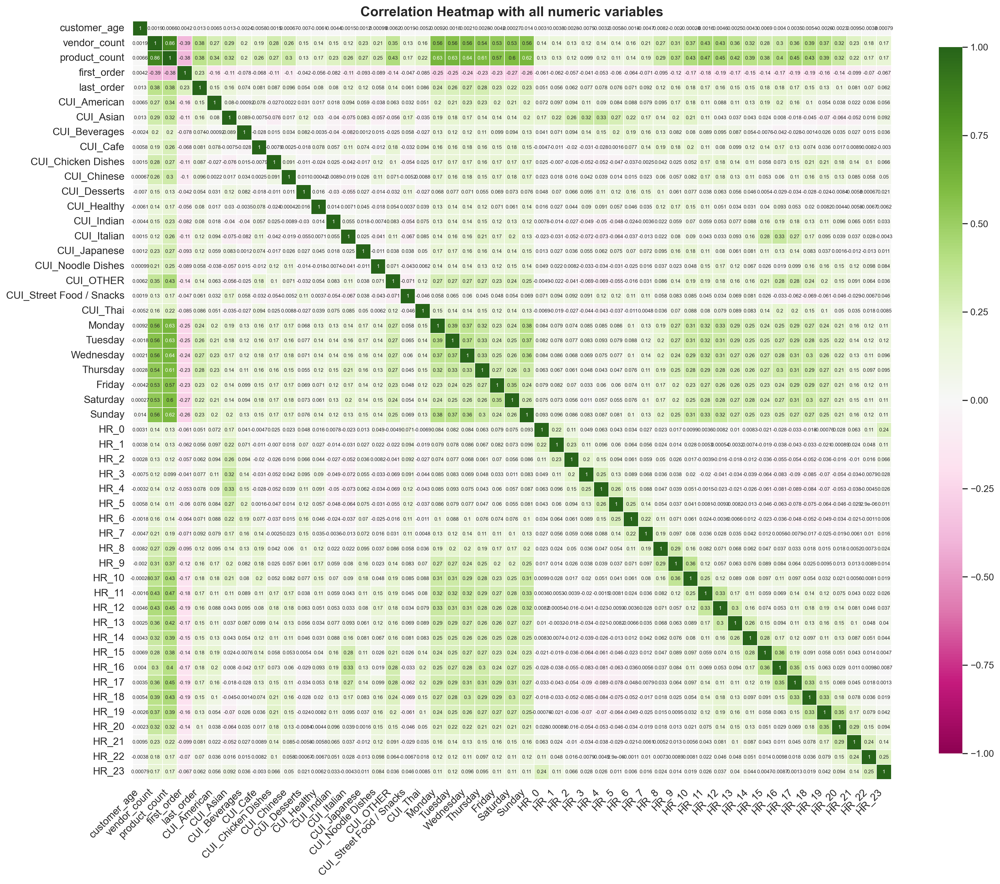

In [418]:
df_corr_all=df[['customer_age', 'vendor_count',
       'product_count', 'first_order', 'last_order', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday', 'Sunday', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5',
       'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13',
       'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21',
       'HR_22', 'HR_23']].corr()

plt.figure(figsize=(20, 20)) 


sns.heatmap(df_corr_all, annot=True,
            linewidths=0.7, vmin=-1, vmax=1, square=True,
            cbar_kws={'shrink': 0.75, 'aspect': 30}, 
            annot_kws={'size': 6 },  
            cmap='PiYG')  

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.title('Correlation Heatmap with all numeric variables', fontsize=16, weight='bold')

plt.show()

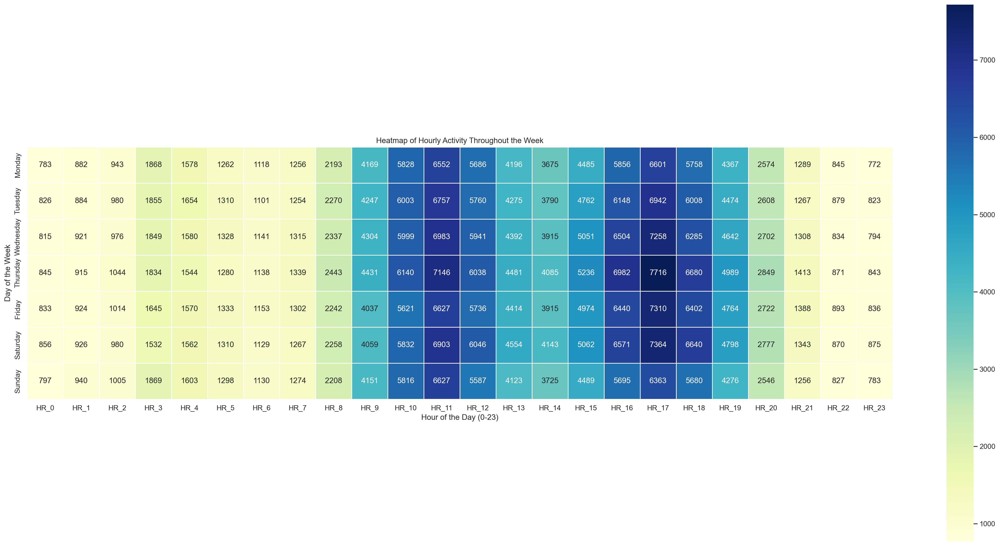

In [419]:
# Create an empty DataFrame to store the aggregated activity, initializing with zeros
heatmap_data = pd.DataFrame(index=dow_columns, columns=hr_columns)

# Sum of the hourly activity for each day and fill in the heatmap data
for day in dow_columns:
    # Summing the hourly columns for the current day and filling NaNs with zero
    heatmap_data.loc[day] = df.loc[df[day]  > 0, hr_columns].sum().fillna(0)

# Convert all data to numeric (float)
heatmap_data = heatmap_data.astype(float)

# Plot the heatmap
plt.figure(figsize=(30, 15))
sns.heatmap(heatmap_data, 
            cmap='YlGnBu', 
            linewidths=1, 
            annot=True, 
            square=True, 
            fmt='.0f')
plt.title('Heatmap of Hourly Activity Throughout the Week')
plt.xlabel('Hour of the Day (0-23)')
plt.ylabel('Day of the Week')
plt.show()

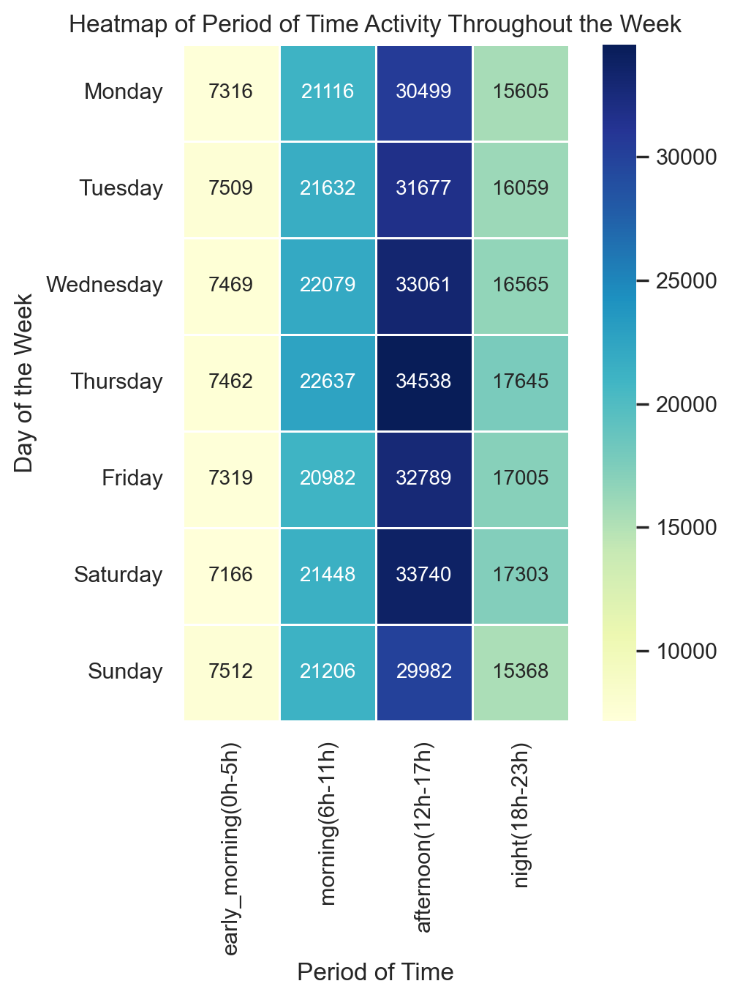

In [420]:
# Create an empty DataFrame to store the aggregated activity, initializing with zeros
heatmap_data = pd.DataFrame(index=dow_columns, columns=time_columns)

# Sum the hourly activity for each day and fill in the heatmap data
for day in dow_columns:
    # Summing the hourly columns for the current day and filling NaNs with zero
    heatmap_data.loc[day] = df.loc[df[day] > 0, time_columns].sum().fillna(0)

# Convert all data to numeric (float)
heatmap_data = heatmap_data.astype(float)

# Plot the heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(heatmap_data, 
            cmap='YlGnBu', 
            linewidths=0.5, 
            annot=True, 
            square=True,
            annot_kws={'size': 10 }, 
            fmt='.0f')
plt.title('Heatmap of Period of Time Activity Throughout the Week')
plt.xlabel('Period of Time')
plt.ylabel('Day of the Week')
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\887570863.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cuisine_by_age = df.groupby('age_group')[CUI_columns].sum()


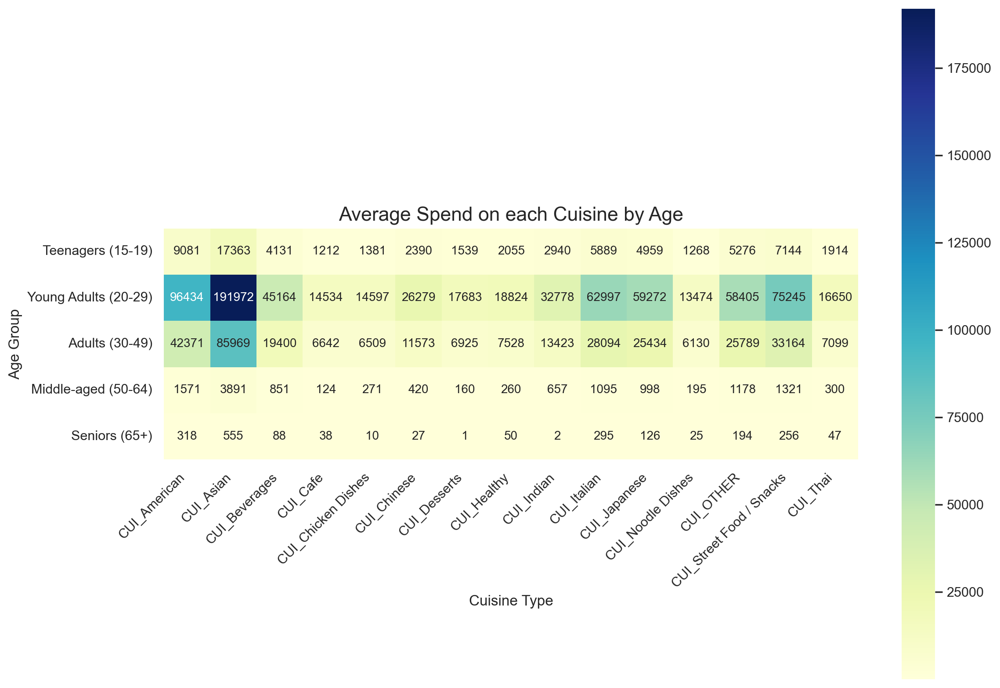

In [421]:
cuisine_by_age = df.groupby('age_group')[CUI_columns].sum()

plt.figure(figsize=(12, 8))
sns.heatmap(cuisine_by_age, 
            annot=True,
            annot_kws={'size': 10 }, 
            cmap='YlGnBu', 
            fmt='.0f', 
            square=True)

plt.title('Average Spend on each Cuisine by Age', fontsize=16)
plt.xlabel('Cuisine Type', fontsize=12)
plt.ylabel('Age Group', fontsize=12)


plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

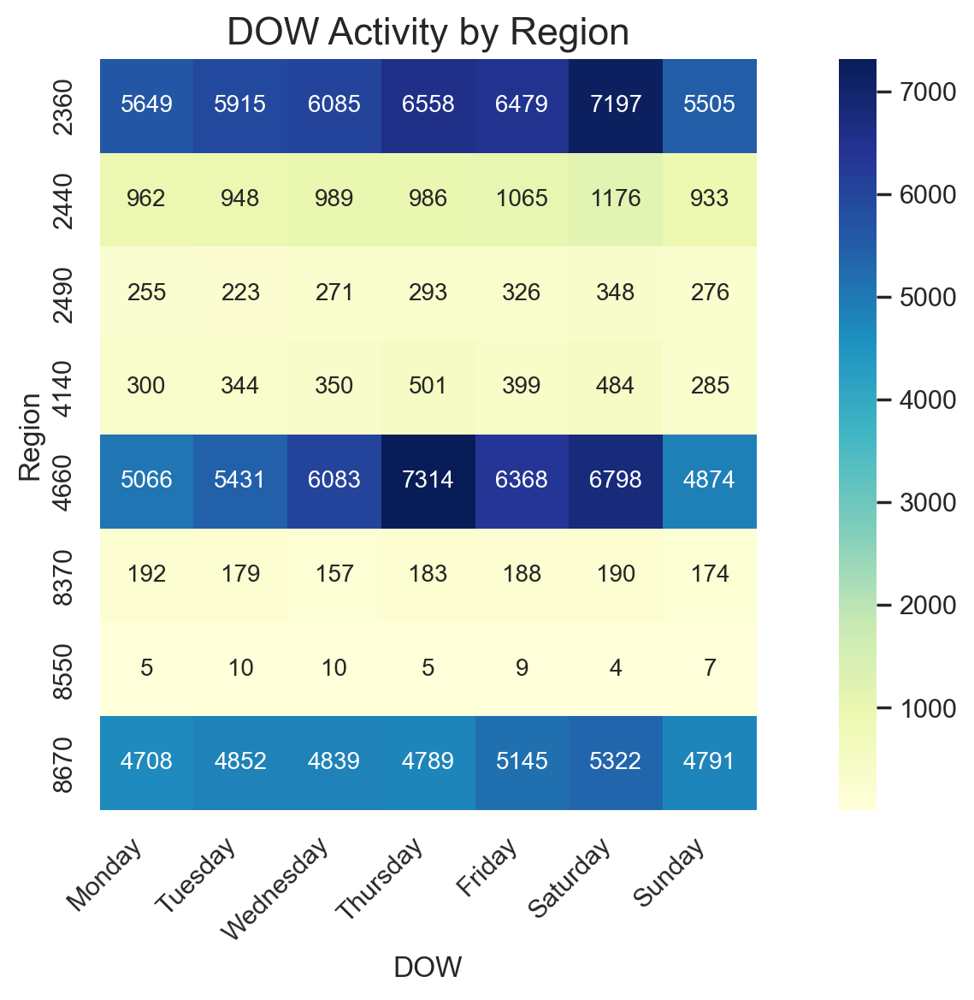

In [422]:
# Group by region and sum the DOW
cuisine_by_region = df.groupby('customer_region')[dow_columns].sum()  
plt.figure(figsize=(10, 6))
sns.heatmap(cuisine_by_region, 
            annot=True,
            annot_kws={'size': 10}, 
            cmap='YlGnBu', 
            fmt='.0f', 
            square=True)

plt.title('DOW Activity by Region', fontsize=16)
plt.xlabel('DOW', fontsize=12)  
plt.ylabel('Region', fontsize=12)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

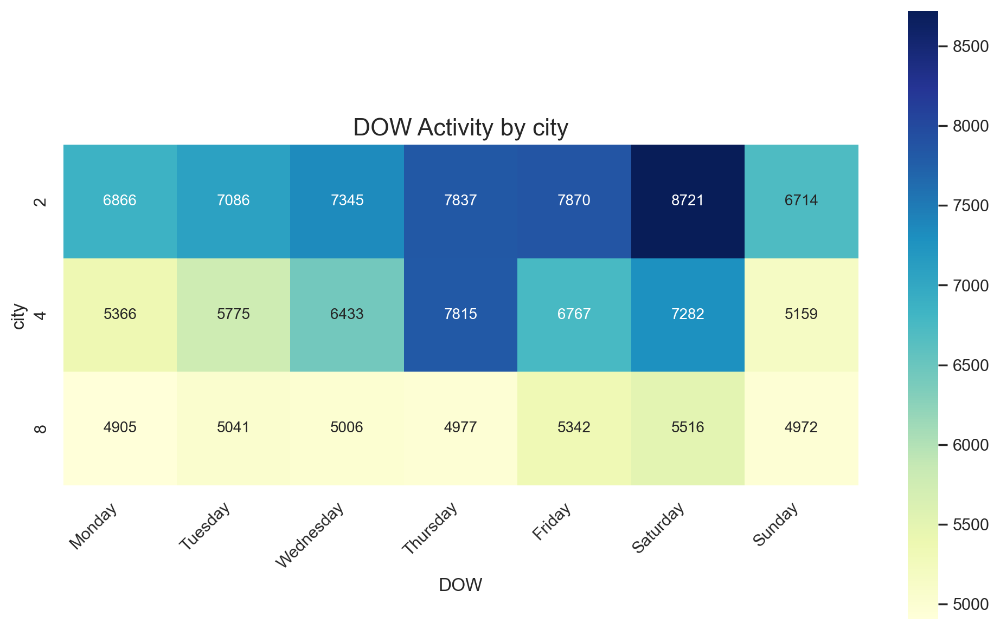

In [423]:
# Group by city and sum the DOW
cuisine_by_region = df.groupby('customer_city')[dow_columns].sum()  
plt.figure(figsize=(10, 6))
sns.heatmap(cuisine_by_region, 
            annot=True,
            annot_kws={'size': 10}, 
            cmap='YlGnBu', 
            fmt='.0f', 
            square=True)

plt.title('DOW Activity by city', fontsize=16)
plt.xlabel('DOW', fontsize=12)  
plt.ylabel('city', fontsize=12)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<a class="anchor" id="multi">

## 6.2 Multivariate Analysis
    
</a>

- Payment Method

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3596763885.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  payment_counts = df.groupby(['age_group', 'payment_method']).size().unstack(fill_value=0)


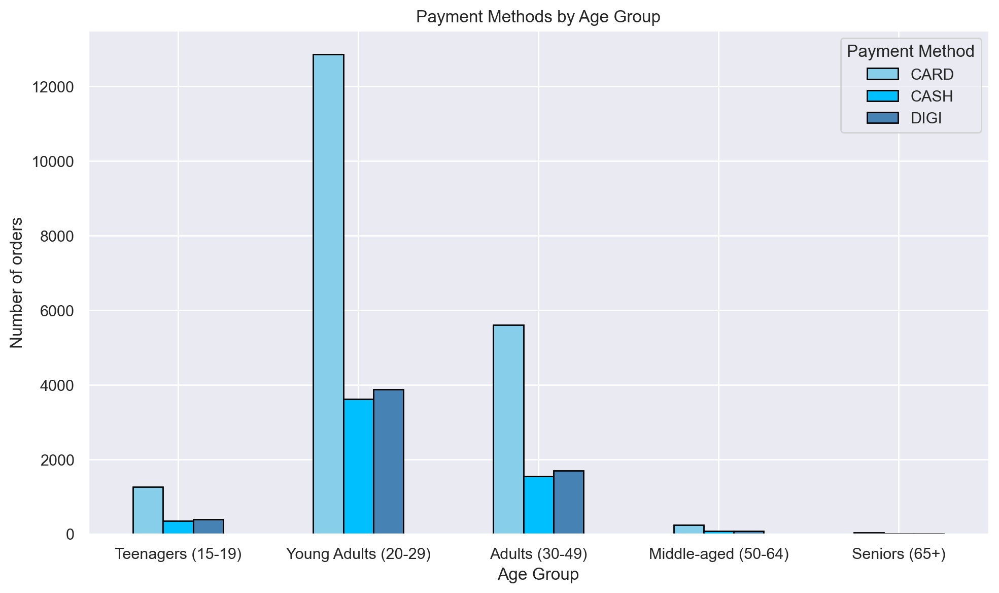

In [424]:
payment_counts = df.groupby(['age_group', 'payment_method']).size().unstack(fill_value=0)

colors=['#87CEEB','#00BFFF','#4682B4']
payment_counts.plot(kind='bar', 
                    stacked=False, 
                    figsize=(10, 6), 
                    color=colors, 
                    edgecolor='black') 

plt.title('Payment Methods by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Number of orders')
plt.xticks(rotation=0)  
plt.legend(title='Payment Method')
plt.tight_layout()  
plt.show()

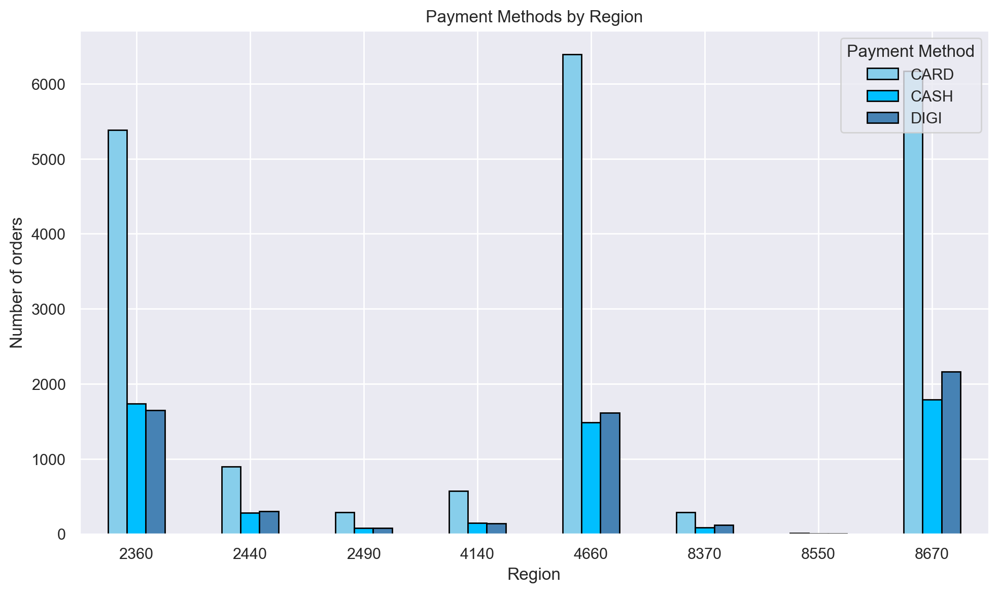

In [425]:
payment_counts_region = df.groupby(['customer_region', 'payment_method']).size().unstack(fill_value=0)

colors=['#87CEEB','#00BFFF','#4682B4']
payment_counts_region.plot(kind='bar', 
                    stacked=False, 
                    figsize=(10, 6), 
                    color=colors, 
                    edgecolor='black') 

plt.title('Payment Methods by Region')
plt.xlabel('Region')
plt.ylabel('Number of orders')
plt.xticks(rotation=0)  
plt.legend(title='Payment Method')
plt.tight_layout()  
plt.show()

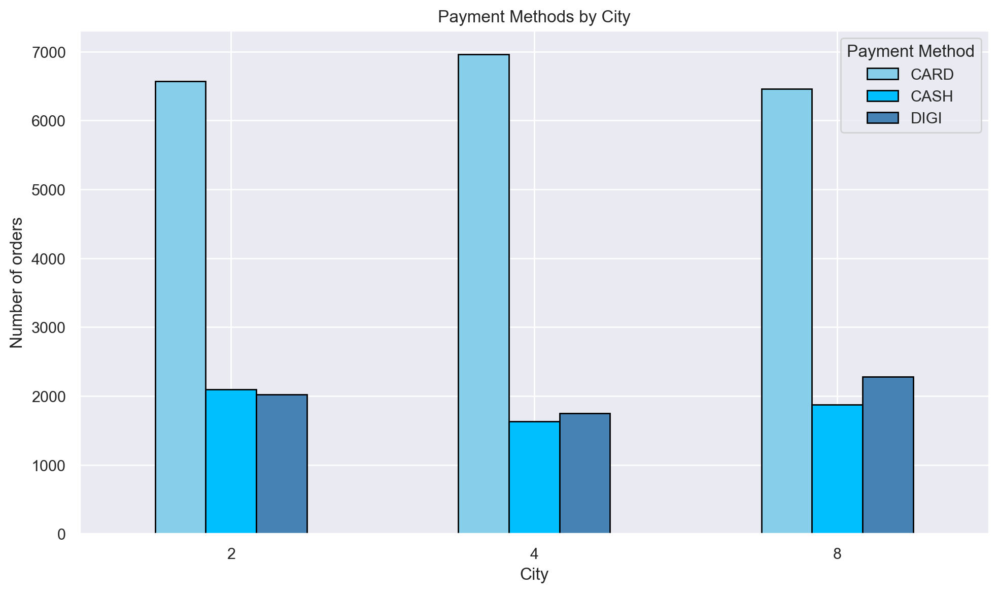

In [426]:
payment_counts_region = df.groupby(['customer_city', 'payment_method']).size().unstack(fill_value=0)

colors=['#87CEEB','#00BFFF','#4682B4']
payment_counts_region.plot(kind='bar', 
                    stacked=False, 
                    figsize=(10, 6), 
                    color=colors, 
                    edgecolor='black') 

plt.title('Payment Methods by City')
plt.xlabel('City')
plt.ylabel('Number of orders')
plt.xticks(rotation=0)  
plt.legend(title='Payment Method')
plt.tight_layout()  
plt.show()

- Age Group

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3399958030.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_counts = df.groupby(['customer_region', 'age_group']).size().reset_index(name='count')


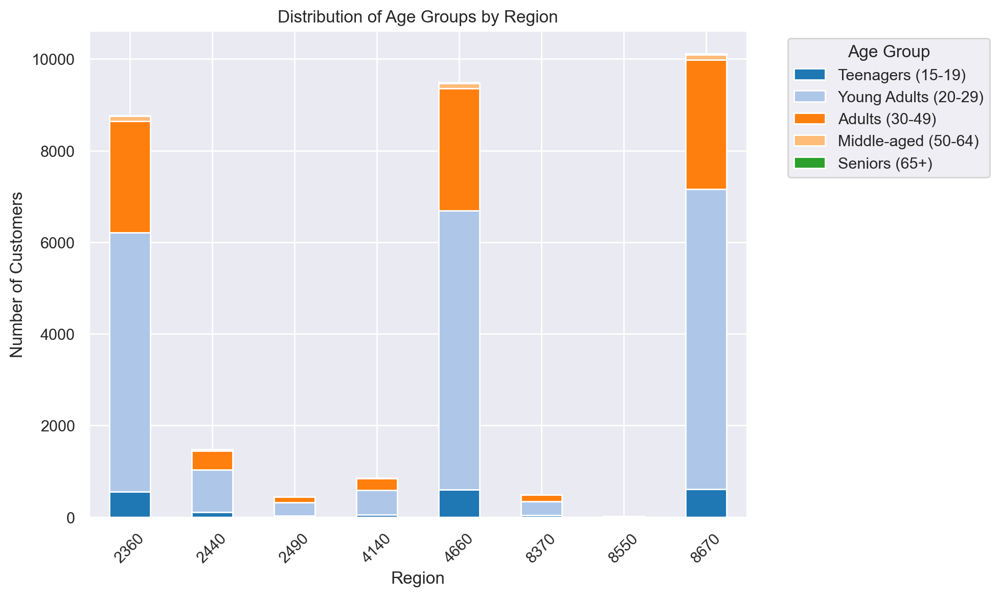

In [427]:
# Grouping data by region and age group
age_counts = df.groupby(['customer_region', 'age_group']).size().reset_index(name='count')

# Creating a pivot table
pivot_age_counts = age_counts.pivot(index='customer_region', columns='age_group', values='count').fillna(0)

# Plotting the stacked bar chart
pivot_age_counts.plot(kind='bar', 
                      stacked=True, 
                      figsize=(10, 6), 
                      color=plt.cm.tab20.colors) # Ensuring the color palette is correct

plt.title('Distribution of Age Groups by Region')
plt.xlabel('Region')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)  
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')  
plt.tight_layout()  
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\2226398907.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_counts_city = df.groupby(['customer_city', 'age_group']).size().reset_index(name='count')


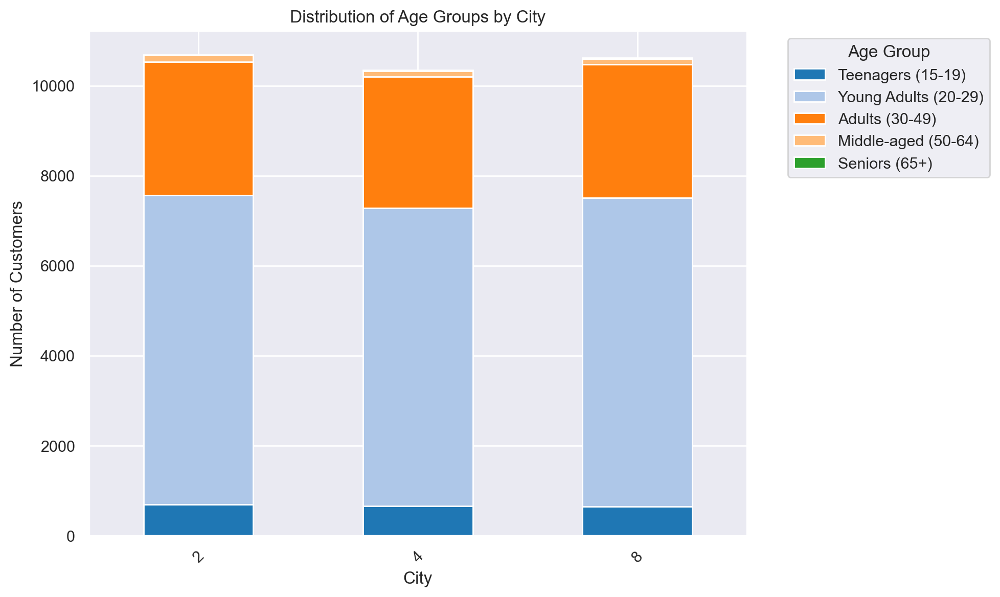

In [428]:
# Grouping data by city and age group
age_counts_city = df.groupby(['customer_city', 'age_group']).size().reset_index(name='count')

# Create the stacked bar plot
age_counts_city_pivot = age_counts_city.pivot(index='customer_city', columns='age_group', values='count').fillna(0)

age_counts_city_pivot.plot(kind='bar', 
                            stacked=True, 
                            figsize=(10, 6),
                            color=plt.cm.tab20.colors) # Ensuring the color palette is correct
plt.title('Distribution of Age Groups by City')
plt.xlabel('City')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)  
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')  
plt.tight_layout()  
plt.show()

- Cuisine Type

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\810195366.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(3, 'total_expenditure'))


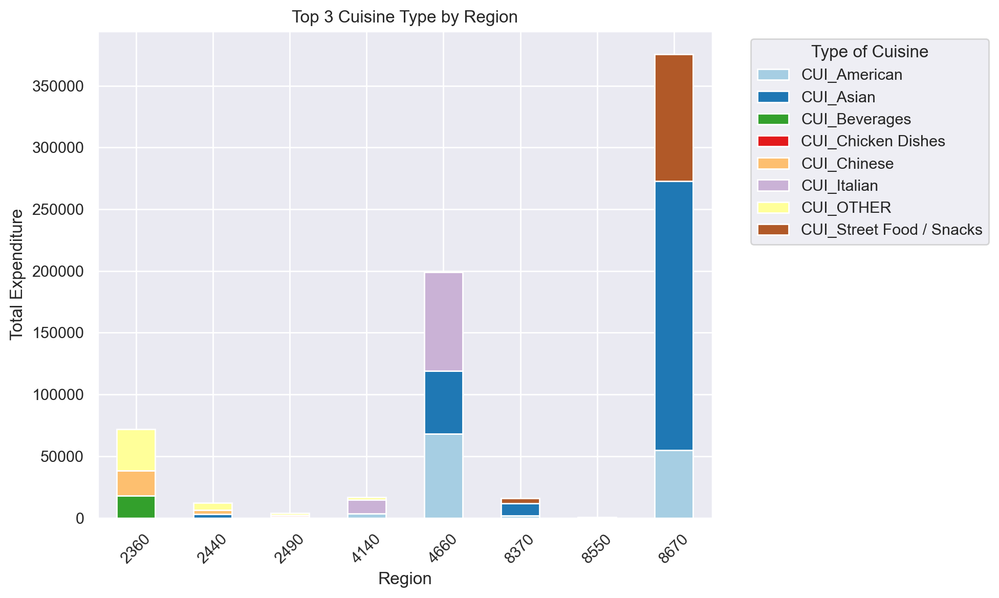

In [429]:
cuisine_counts = df.groupby('customer_region')[CUI_columns].sum().reset_index()

cuisine_counts_ = cuisine_counts.melt(id_vars='customer_region', 
                                            value_vars=CUI_columns, 
                                            var_name='cuisine_type', 
                                            value_name='total_expenditure')

top_cuisines = (
    cuisine_counts_.groupby('customer_region')
    .apply(lambda x: x.nlargest(3, 'total_expenditure'))
    .reset_index(drop=True)
)


top_cuisine_counts = top_cuisines.pivot(index='customer_region', 
                                        columns='cuisine_type', 
                                        values='total_expenditure').fillna(0)


num_cuisines = top_cuisine_counts.shape[1]
colors = plt.cm.Paired(np.linspace(0, 1, num_cuisines)) 


top_cuisine_counts.plot(kind='bar', 
                        stacked=True, 
                        figsize=(10, 6), 
                        color=colors)

plt.title('Top 3 Cuisine Type by Region')
plt.xlabel('Region')
plt.ylabel('Total Expenditure')
plt.xticks(rotation=45)
plt.legend(title='Type of Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3083526721.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(3, 'total_expenditure'))


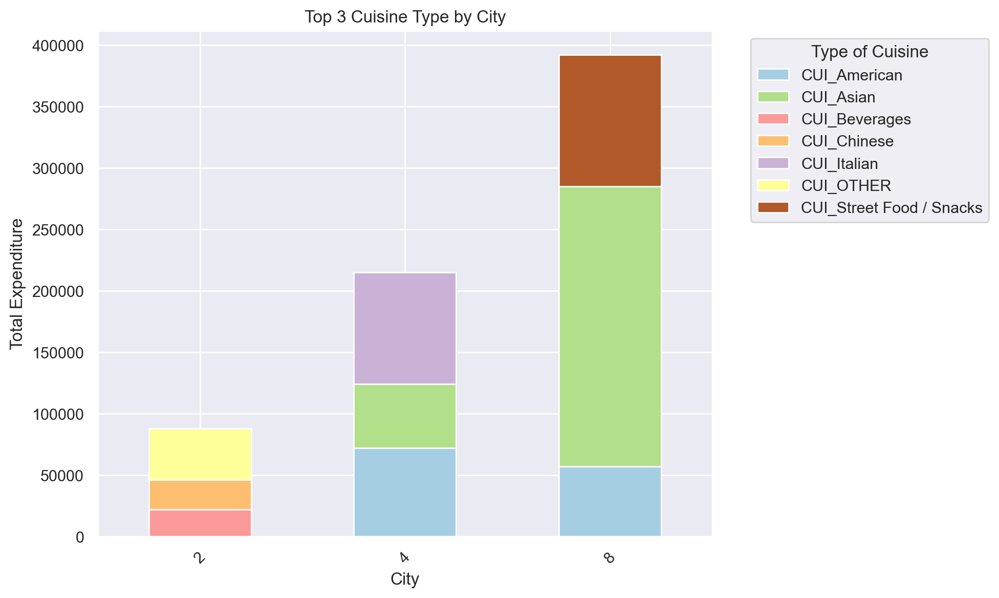

In [430]:
cuisine_counts = df.groupby('customer_city')[CUI_columns].sum().reset_index()

cuisine_counts_1= cuisine_counts.melt(id_vars='customer_city', 
                                            value_vars=CUI_columns, 
                                            var_name='cuisine_type', 
                                            value_name='total_expenditure')

top_cuisines = (
    cuisine_counts_1.groupby('customer_city')
    .apply(lambda x: x.nlargest(3, 'total_expenditure'))
    .reset_index(drop=True)
)


top_cuisine_counts = top_cuisines.pivot(index='customer_city', 
                                        columns='cuisine_type', 
                                        values='total_expenditure').fillna(0)


num_cuisines = top_cuisine_counts.shape[1]
colors = plt.cm.Paired(np.linspace(0, 1, num_cuisines)) 


top_cuisine_counts.plot(kind='bar', 
                        stacked=True, 
                        figsize=(10, 6), 
                        color=colors)

plt.title('Top 3 Cuisine Type by City')
plt.xlabel('City')
plt.ylabel('Total Expenditure')
plt.xticks(rotation=45)
plt.legend(title='Type of Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


- Total Spending

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3486694700.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='customer_region', y='total_spend', data=region_spend, palette="viridis")


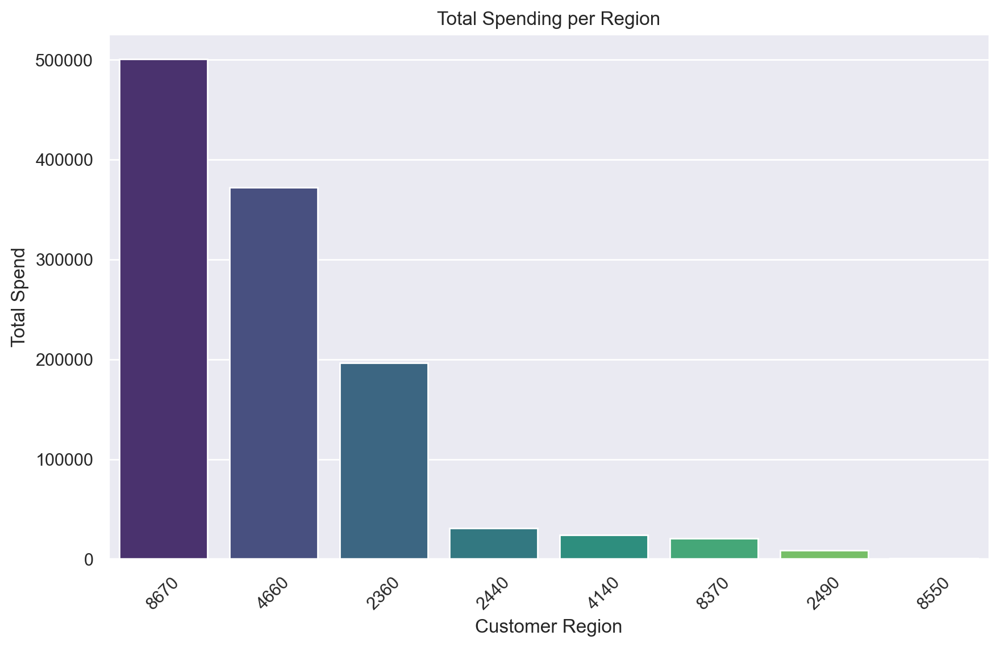

In [431]:
# Group by region and sum the total spending
region_spend = df.groupby('customer_region')['total_spend'].sum().reset_index()

region_spend = region_spend.sort_values(by='total_spend', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y='total_spend', data=region_spend, palette="viridis")

plt.title("Total Spending per Region")
plt.xlabel("Customer Region")
plt.ylabel("Total Spend")
plt.xticks(rotation=45)
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\1988037854.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='customer_city', y='total_spend', data=region_spend, palette="viridis")


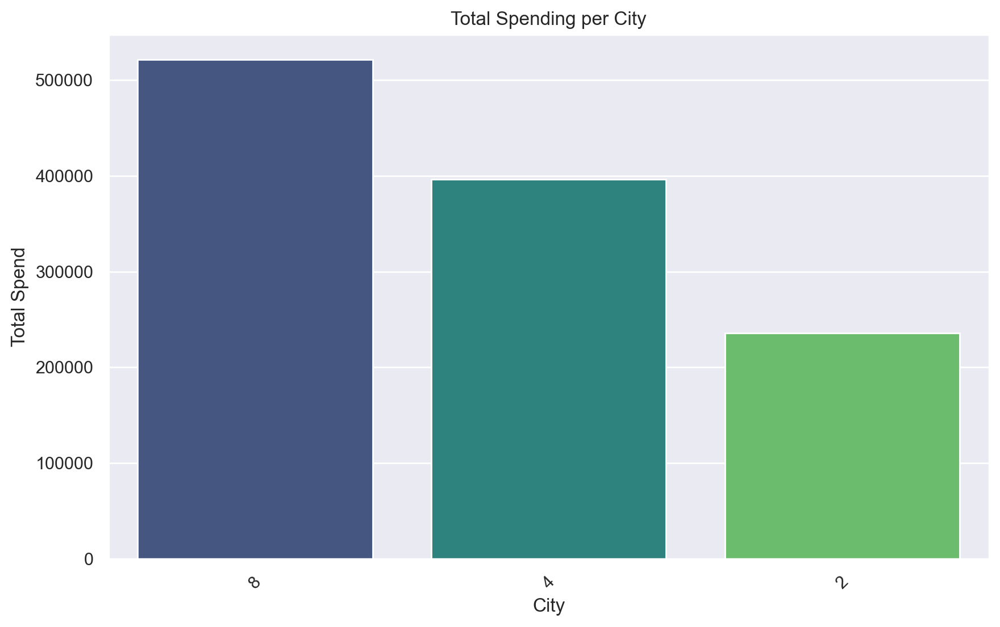

In [432]:
# Group by age group and  total spending
region_spend = df.groupby('customer_city')['total_spend'].sum().reset_index()

region_spend = region_spend.sort_values(by='total_spend', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_city', y='total_spend', data=region_spend, palette="viridis")

plt.title("Total Spending per City")
plt.xlabel("City")
plt.ylabel("Total Spend")
plt.xticks(rotation=45)
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3458598274.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  region_spend = df.groupby('age_group')['total_spend'].sum().reset_index()
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3458598274.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='age_group', y='total_spend', data=region_spend, palette="viridis")


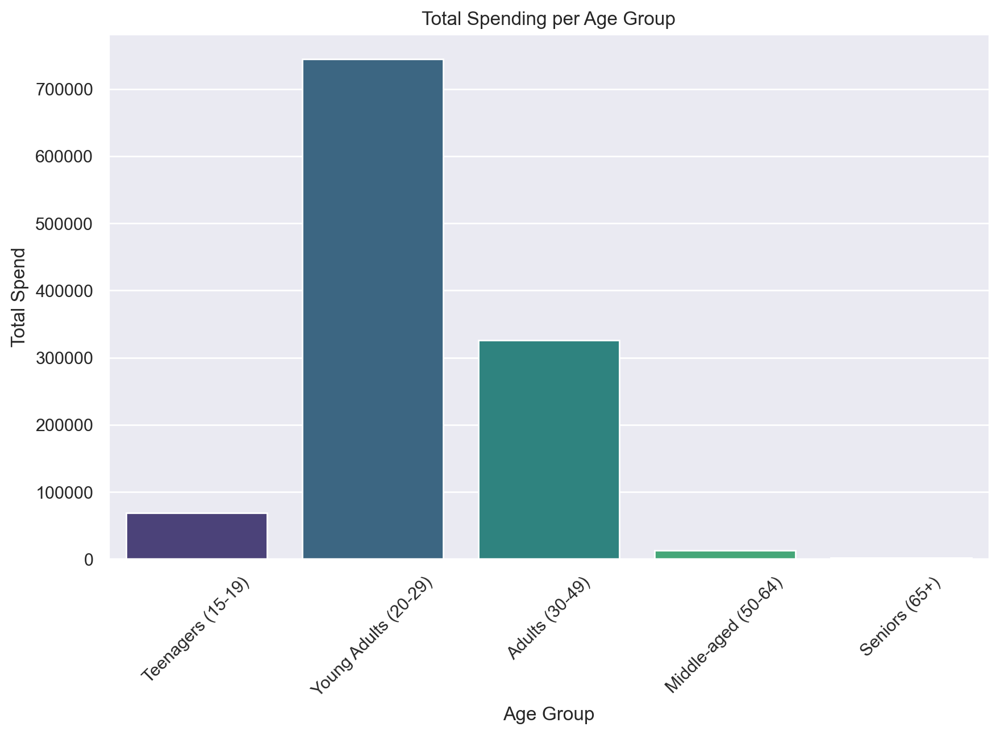

In [433]:
# Group by age group and  total spending
region_spend = df.groupby('age_group')['total_spend'].sum().reset_index()

region_spend = region_spend.sort_values(by='total_spend', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='age_group', y='total_spend', data=region_spend, palette="viridis")

plt.title("Total Spending per Age Group")
plt.xlabel("Age Group")
plt.ylabel("Total Spend")
plt.xticks(rotation=45)
plt.show()

- Cuisine Diversity

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\116692479.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='customer_region', y='cuisine_diversity', data=region_spend, palette="viridis")


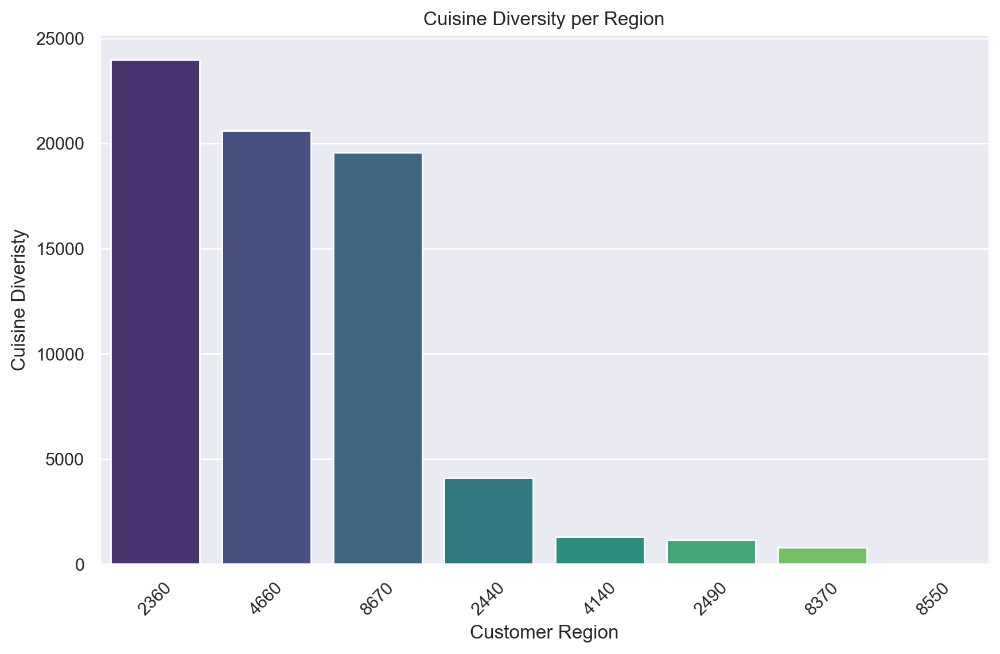

In [434]:
# Group by region and cuisine diversity
region_spend = df.groupby('customer_region')['cuisine_diversity'].sum().reset_index()

region_spend = region_spend.sort_values(by='cuisine_diversity', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y='cuisine_diversity', data=region_spend, palette="viridis")

plt.title("Cuisine Diversity per Region")
plt.xlabel("Customer Region")
plt.ylabel("Cuisine Diveristy")
plt.xticks(rotation=45)
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\824820022.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='customer_city', y='cuisine_diversity', data=region_spend, palette="viridis")


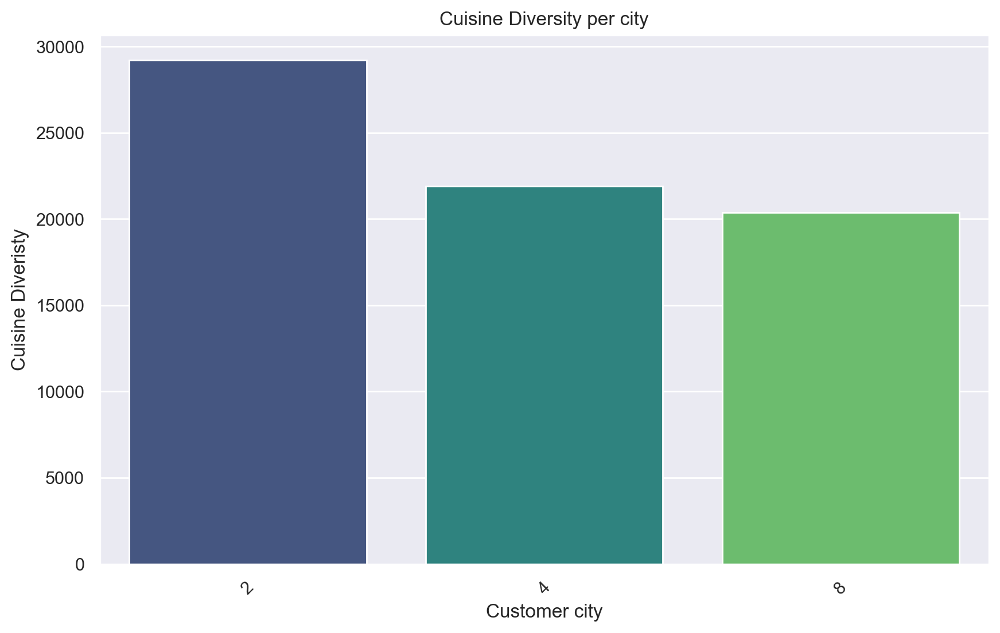

In [435]:
# Group by region and cuisine diversity
region_spend = df.groupby('customer_city')['cuisine_diversity'].sum().reset_index()

region_spend = region_spend.sort_values(by='cuisine_diversity', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_city', y='cuisine_diversity', data=region_spend, palette="viridis")

plt.title("Cuisine Diversity per city")
plt.xlabel("Customer city")
plt.ylabel("Cuisine Diveristy")
plt.xticks(rotation=45)
plt.show()

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\910129614.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  region_spend = df.groupby('age_group')['cuisine_diversity'].sum().reset_index()
C:\Users\anama\AppData\Local\Temp\ipykernel_30700\910129614.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='age_group', y='cuisine_diversity', data=region_spend, palette="viridis")


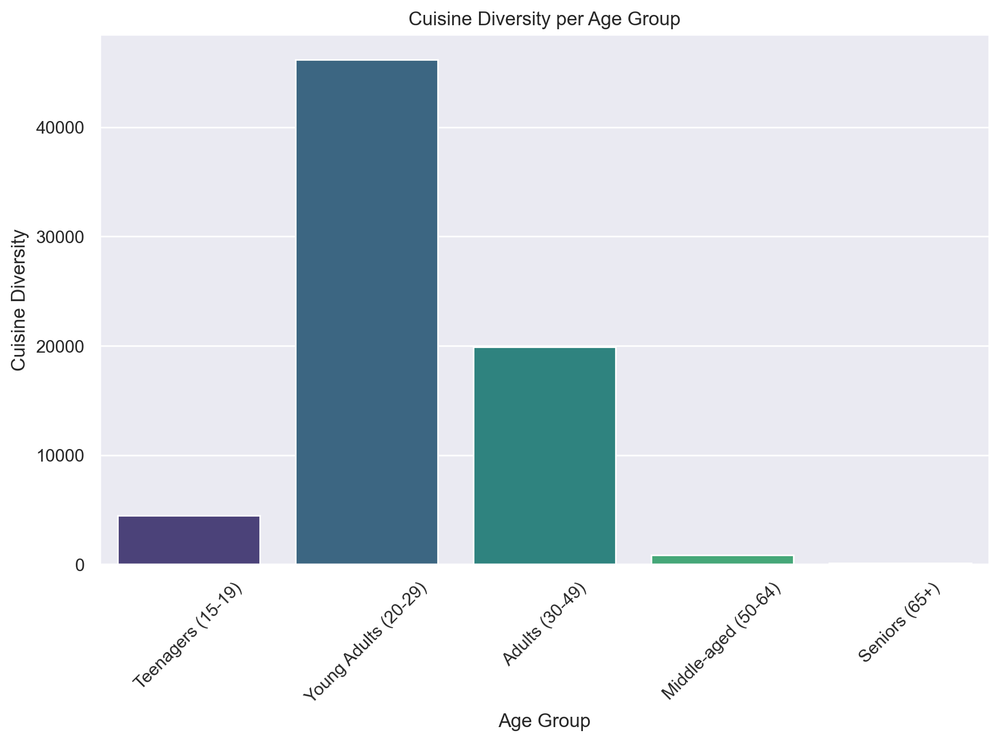

In [436]:
# Group by age group and cuisine diversity
region_spend = df.groupby('age_group')['cuisine_diversity'].sum().reset_index()

region_spend = region_spend.sort_values(by='cuisine_diversity', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='age_group', y='cuisine_diversity', data=region_spend, palette="viridis")

plt.title("Cuisine Diversity per Age Group")
plt.xlabel("Age Group")
plt.ylabel("Cuisine Diversity")
plt.xticks(rotation=45)
plt.show()

- 3 Variables

In [437]:
df['sum_of_orders']=df[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']].sum(axis=1)
# Group by customer_region and customer_age
grouped = df.groupby(['customer_city', 'customer_age'])['sum_of_orders'].sum().reset_index()

# Sort the results
grouped = grouped.sort_values(['customer_city', 'customer_age'])

C:\Users\anama\AppData\Local\Temp\ipykernel_30700\3001984167.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sum_of_orders']=df[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']].sum(axis=1)


In [438]:
city_stats = grouped.groupby('customer_city').agg({
    'customer_age': ['mean', 'min', 'max'],
    'sum_of_orders': ['mean', 'min', 'max', 'sum']
}).reset_index()

print(city_stats)


  customer_city customer_age         sum_of_orders                 
                        mean min max          mean min   max    sum
0             2    45.491803  15  79    859.655738   1  4536  52439
1             4    44.220339  15  80    755.881356   1  4063  44597
2             8    46.396825  15  80    567.603175   1  3140  35759


C:\Users\anama\AppData\Local\Temp\ipykernel_30700\899955026.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  base_colors = plt.cm.get_cmap('Set1')(np.linspace(0, 1, num_regions))


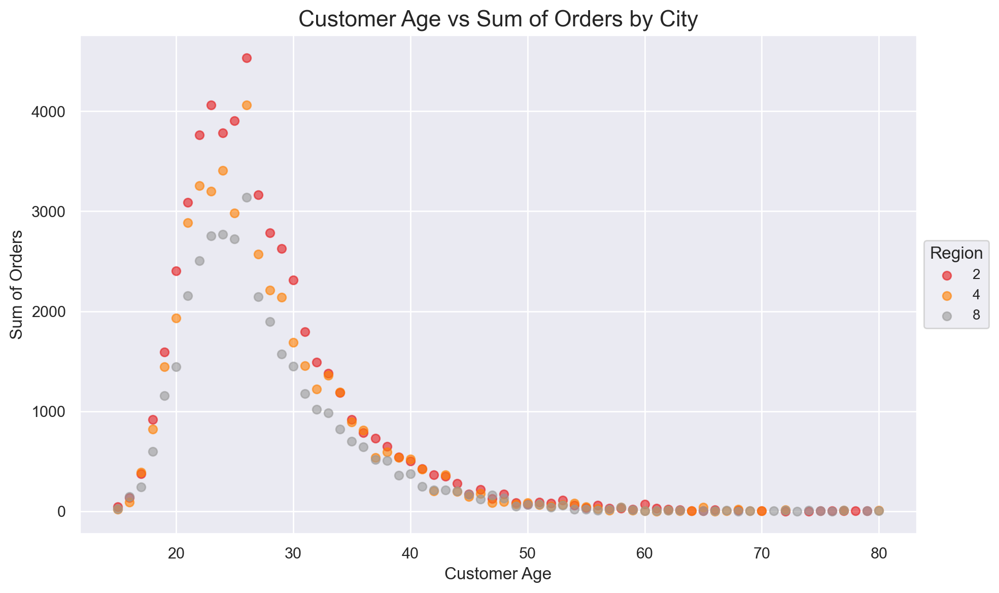

In [439]:
# Create a high-contrast color palette
num_regions = len(grouped['customer_city'].unique())
base_colors = plt.cm.get_cmap('Set1')(np.linspace(0, 1, num_regions))
custom_colors = ['#FF1493', '#00FFFF', '#FFD700', '#32CD32', '#FF4500', '#8A2BE2', '#00CED1']
color_palette = list(base_colors) + custom_colors

plt.figure(figsize=(10, 6))

for i, region in enumerate(grouped['customer_city'].unique()):
    region_data = grouped[grouped['customer_city'] == region]
    plt.scatter(region_data['customer_age'], region_data['sum_of_orders'], 
                label=region, alpha=0.6, color=color_palette[i])

plt.xlabel('Customer Age', fontsize=12)
plt.ylabel('Sum of Orders', fontsize=12)
plt.title('Customer Age vs Sum of Orders by City', fontsize=16)
plt.legend(title='Region', title_fontsize='12', fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [440]:
# my_colors = plt.get_cmap('tab20').colors  

# cuisine_cols = all_cols = [col for col in df.columns if col.startswith('CUI_')]
# all_cols.append("customer_region")
# all_cols.append("age_group")
# group_by_ageG_region_CUI =  df[all_cols].groupby(['customer_region','age_group']).sum()

# group_by_ageG_region_CUI = (
#     group_by_ageG_region_CUI
#     .apply(lambda x: x.nlargest(5),axis=1)
    
# )

# high_contrast_colors = [
#     "#000000",  # Black
#     "#FF0000",  # Red
#     "#00FFFF",  # Cyan
#     "#00FF00",  # Green
#     "#FF00FF",  # Magenta
#     "#0000FF",  # Blue
#     "#FFFF00",  # Yellow
#     "#FFA500",  # Orange
#     "#800080",  # Purple
#     "#008080",  # Teal
#     "#FF6347",  # Tomato (bright red-orange)
#     "#40E0D0",  # Turquoise
#     "#8B0000",  # Dark Red
#     "#808080",  # Gray
#     "#00008B",  # Dark Blue
#     "#ADFF2F"   # Green Yellow
# ]
# rows = math.ceil(len(df["customer_region"].unique())/3)

# fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
# axes = axes.flatten()  
# for i,region in enumerate(df["customer_region"].unique() ):
#     # Filter data for the current customer_region
#     region_data = group_by_ageG_region_CUI.loc[region]
    
#     # Plot
#     region_data.plot(kind='bar',ax=axes[i], figsize=(30, 20), width=1,color=high_contrast_colors)
#     axes[i].set_title(f'CUI by Age Group for Customer Region {region}')
#     axes[i].set_xlabel('Age Group')
#     axes[i].set_ylabel('Expenses')
#     axes[i].tick_params(axis='x', rotation=0)  # Set x-axis label rotation

#     axes[i].legend(title='CUI Type')
    
    
# # Show the plot
# for j in range(i + 1, len(axes)):
#     axes[j].axis('off')
# plt.tight_layout()
# plt.show()

<a class="anchor" id="enc">

# 7. Encoding
    
</a>

In [441]:
df.columns.values

array(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo',
       'payment_method', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday',
       'Friday', 'Saturday', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4',
       'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12',
       'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
       'HR_20', 'HR_21', 'HR_22', 'HR_23', 'early_morning(0h-5h)',
       'morning(6h-11h)', 'afternoon(12h-17h)', 'night(18h-23h)',
       'age_group', 'Sum_of_Orders', 'recency', 'active_period',
       'frequency', 'total_spend', 'cuisine_diversity', 'customer_city',
       'Weekdays', 'Weeke

In [442]:
df = df.drop(columns=['customer_region'])

In [443]:
df_ohc = df.copy()

In [444]:
categorical_features_new = ['last_promo', 'payment_method', 'age_group', 'is_chain', 'customer_city']

In [445]:
# Remove 'age_group' and 'last_promo' from the list of categorical features
columns_to_remove = ['age_group', 'last_promo']  
cf_for_ohc = [col for col in categorical_features_new if col not in columns_to_remove]

# Initialize the encoder with the chosen settings
ohc = OneHotEncoder(sparse_output=False, drop=None)

# Fit the encoder on the selected categorical features
ohc.fit(df_ohc[cf_for_ohc])

# Transform the selected categorical features
ohc_features = ohc.transform(df_ohc[cf_for_ohc])

# Create a DataFrame with encoded feature names
ohc_df = pd.DataFrame(
    ohc_features,
    index=df_ohc.index,
    columns=ohc.get_feature_names_out(cf_for_ohc)
)

# Concatenate the encoded features back to the original dataset
ohc_encoded = pd.concat(
    [df_ohc.drop(columns=cf_for_ohc), ohc_df],
    axis=1
)


In [446]:
ohc_encoded.columns.values

array(['customer_age', 'vendor_count', 'product_count', 'first_order',
       'last_order', 'last_promo', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'Sunday', 'Monday',
       'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'HR_0',
       'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8',
       'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15',
       'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22',
       'HR_23', 'early_morning(0h-5h)', 'morning(6h-11h)',
       'afternoon(12h-17h)', 'night(18h-23h)', 'age_group',
       'Sum_of_Orders', 'recency', 'active_period', 'frequency',
       'total_spend', 'cuisine_diversity', 'Weekdays', 'Weekends',
       'sum_of_orders', 'payment_method_CARD', 'payment_method_CASH

In [447]:
ohc_encoded.head()

,customer_age,vendor_count,product_count,first_order,last_order,last_promo,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group,Sum_of_Orders,recency,active_period,frequency,total_spend,cuisine_diversity,Weekdays,Weekends,sum_of_orders,payment_method_CARD,payment_method_CASH,payment_method_DIGI,is_chain_0,is_chain_1,customer_city_2,customer_city_4,customer_city_8
0,18,2,5,0,1,DELIVERY,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,2,Teenagers (15-19),2,89,2,1.0,28.88,1,0,2,2,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
1,17,2,2,0,1,DISCOUNT,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Teenagers (15-19),2,89,2,1.0,19.21,2,0,2,2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,38,1,2,0,1,DISCOUNT,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Adults (30-49),2,89,2,1.0,9.20,1,0,2,2,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
3,26,2,3,0,2,DELIVERY,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,Young Adults (20-29),2,88,3,0.666667,31.56,2,1,1,2,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,20,2,5,0,2,NO PROMO,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Young Adults (20-29),2,88,3,0.666667,55.44,2,1,1,2,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0


In [448]:
# Define the encoder for 'age_group' with explicit categories
ordinal_encoder = OrdinalEncoder(
    categories=[['Teenagers (15-19)', 'Young Adults (20-29)', 'Adults (30-49)', 'Middle-aged (50-64)', 'Seniors (65-80)']],
    handle_unknown='use_encoded_value',
    unknown_value=-1  # Use -1 for unknown categories
)

if 'age_group' not in df_ohc.columns:
    raise KeyError("The column 'age_group' is not in the DataFrame.")

# Fit and transform the 'age_group' column and add it to the DataFrame
df_ohc['age_group_encoded'] = ordinal_encoder.fit_transform(df_ohc[['age_group']])

# Map the 'last_promo' feature to binary values
promo_mapping = {
    'No PROMO': 0,  # No promo maps to 0
    'DISCOUNT': 1,   # All promos map to 1
    'DELIVERY': 1,
    'FREEBIE': 1
}

# Apply the mapping to create the binary encoded column for 'last_promo'
df_ohc['last_promo_encoded'] = df_ohc['last_promo'].map(promo_mapping)

# If there are any NaN values in 'last_promo_encoded', fill them with 0
df_ohc['last_promo_encoded'] = df_ohc['last_promo_encoded'].fillna(0)

# Concatenate the encoded columns with the existing DataFrame
df_encoded = pd.concat([ohc_encoded, df_ohc[['age_group_encoded', 'last_promo_encoded']]], axis=1)

In [449]:
df_encoded.head()

,customer_age,vendor_count,product_count,first_order,last_order,last_promo,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group,Sum_of_Orders,recency,active_period,frequency,total_spend,cuisine_diversity,Weekdays,Weekends,sum_of_orders,payment_method_CARD,payment_method_CASH,payment_method_DIGI,is_chain_0,is_chain_1,customer_city_2,customer_city_4,customer_city_8,age_group_encoded,last_promo_encoded
0,18,2,5,0,1,DELIVERY,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,2,Teenagers (15-19),2,89,2,1.0,28.88,1,0,2,2,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
1,17,2,2,0,1,DISCOUNT,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Teenagers (15-19),2,89,2,1.0,19.21,2,0,2,2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
2,38,1,2,0,1,DISCOUNT,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Adults (30-49),2,89,2,1.0,9.20,1,0,2,2,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0
3,26,2,3,0,2,DELIVERY,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,Young Adults (20-29),2,88,3,0.666667,31.56,2,1,1,2,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
4,20,2,5,0,2,NO PROMO,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Young Adults (20-29),2,88,3,0.666667,55.44,2,1,1,2,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0


In [466]:
df_encoded.drop(columns=['age_group', 'last_promo'], inplace=True)


<a class="anchor" id="scale">

# 8. Scaling
    
</a>

In [452]:
df_scale = df.copy()

In [453]:
df.columns.values

array(['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'Sunday',
       'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
       'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
       'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14',
       'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21',
       'HR_22', 'HR_23', 'early_morning(0h-5h)', 'morning(6h-11h)',
       'afternoon(12h-17h)', 'night(18h-23h)', 'age_group',
       'Sum_of_Orders', 'recency', 'active_period', 'frequency',
       'total_spend', 'cuisine_diversity', 'customer_city', 'Weekdays',
       'Weekends', 'sum_of_order

In [454]:
numeric_cols =['customer_age', 'vendor_count', 'product_count','first_order', 'last_order',
                     'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
                    'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
                    'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
                    'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'Sunday',
                    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
                    'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
                    'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14',
                    'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21',
                    'HR_22', 'HR_23', 'early_morning(0h-5h)', 'morning(6h-11h)',
                    'afternoon(12h-17h)', 'night(18h-23h)','Sum_of_Orders', 'recency', 'active_period', 'frequency',
                    'total_spend', 'cuisine_diversity','Weekends', 'sum_of_orders']

- Min-max scaler

In [467]:
# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Fit the scaler on the numerical features
scaled_feat = scaler.fit_transform(df_scale[numeric_cols])

# Convert the scaled features back to a DataFrame 
scaled_feat_df = pd.DataFrame(scaled_feat, columns=numeric_cols, index=df_scale.index)

# Concatenate the scaled features back to the original DataFrames
df_min_max_scaled = pd.concat([df_scale.drop(columns=numeric_cols), scaled_feat_df], axis=1)
df_min_max_scaled_encoded = pd.concat([df_encoded.drop(columns=numeric_cols), scaled_feat_df], axis=1)

In [468]:
df_min_max_scaled_encoded.head()

,Weekdays,payment_method_CARD,payment_method_CASH,payment_method_DIGI,is_chain_0,is_chain_1,customer_city_2,customer_city_4,customer_city_8,age_group_encoded,last_promo_encoded,customer_age,vendor_count,product_count,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),Sum_of_Orders,recency,active_period,frequency,total_spend,cuisine_diversity,Weekends,sum_of_orders
0,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.046154,0.057143,0.064935,0.0,0.011111,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.205537,0.0,0.0,0.0,0.0,0.0,0.0,0.090909,0.000000,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.133333,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.068966,0.032787,0.988889,0.011111,0.250000,0.061793,0.083333,0.090909,0.032787
1,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.030769,0.057143,0.025974,0.0,0.011111,0.093892,0.032276,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.090909,0.000000,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.066667,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.054054,0.000000,0.000000,0.032787,0.988889,0.011111,0.250000,0.041102,0.166667,0.090909,0.032787
2,0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,0.353846,0.028571,0.025974,0.0,0.011111,0.067380,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.090909,0.000000,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.066667,0.000000,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.054054,0.000000,0.000000,0.032787,0.988889,0.011111,0.250000,0.019685,0.083333,0.090909,0.032787
3,1,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.169231,0.057143,0.038961,0.0,0.022222,0.000000,0.069199,0.0,0.0,0.0,0.0,0.0,0.0,0.127108,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.076923,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.071429,0.0,0.0,0.1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.025641,0.000000,0.032787,0.977778,0.022222,0.166667,0.067527,0.166667,0.045455,0.032787
4,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.076923,0.057143,0.064935,0.0,0.022222,0.106709,0.206435,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.076923,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076923,0.066667,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.054054,0.000000,0.000000,0.032787,0.977778,0.022222,0.166667,0.118621,0.166667,0.045455,0.032787


- Standard Scaler

In [469]:
# 1. Create a StandardScaler instance
scaler = StandardScaler()

# 2. Fit and transform the numerical columns
scaled_feat = scaler.fit_transform(df_scale[numeric_cols])

# 3. Convert the scaled features back to a DataFrame
scaled_feat_df = pd.DataFrame(scaled_feat, columns=numeric_cols, index=df_scale.index)

# 4. Concatenate the scaled features back to the original DataFrames
df_standard_scaled = pd.concat([df_scale.drop(columns=numeric_cols), scaled_feat_df], axis=1)
df_standard_scaled_encoded = pd.concat([df_encoded.drop(columns=numeric_cols), scaled_feat_df], axis=1)

In [470]:
df_standard_scaled_encoded.head()

,Weekdays,payment_method_CARD,payment_method_CASH,payment_method_DIGI,is_chain_0,is_chain_1,customer_city_2,customer_city_4,customer_city_8,age_group_encoded,last_promo_encoded,customer_age,vendor_count,product_count,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),Sum_of_Orders,recency,active_period,frequency,total_spend,cuisine_diversity,Weekends,sum_of_orders
0,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,-1.338050,-0.399572,-0.069431,-1.183266,-2.691007,-0.436462,-0.464162,-0.285297,-0.143166,-0.244386,-0.236288,-0.186047,-0.173833,4.038654,-0.3127,-0.330489,-0.177102,-0.327942,-0.266515,-0.194024,0.496912,-0.567359,-0.585044,-0.600057,-0.644372,-0.628135,0.293126,-0.166196,-0.173983,-0.1876,-0.24087,-0.238856,-0.227738,-0.211093,-0.219166,-0.261504,-0.332740,-0.391635,-0.418192,-0.387664,-0.375187,-0.367683,-0.392931,-0.417112,-0.42601,2.010814,-0.328968,-0.268484,-0.20898,-0.171644,-0.166682,-0.390814,-0.593880,-0.698477,0.663266,-0.498308,2.691007,-1.160188,1.557000,-0.194602,-0.860516,0.488075,-0.498308
1,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,-1.479296,-0.399572,-0.583074,-1.183266,-2.691007,0.745882,-0.151007,-0.285297,-0.143166,-0.244386,-0.236288,-0.186047,-0.173833,-0.232730,-0.3127,-0.330489,-0.177102,-0.327942,-0.266515,-0.194024,0.496912,-0.567359,-0.585044,-0.600057,-0.644372,-0.628135,0.293126,-0.166196,-0.173983,-0.1876,-0.24087,-0.238856,-0.227738,-0.211093,-0.219166,-0.261504,-0.332740,0.860332,0.737900,-0.387664,-0.375187,-0.367683,-0.392931,-0.417112,-0.42601,-0.391899,-0.328968,-0.268484,-0.20898,-0.171644,-0.166682,-0.390814,0.431970,-0.698477,-0.497101,-0.498308,2.691007,-1.160188,1.557000,-0.442515,-0.177250,0.488075,-0.498308
2,0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,1.486865,-0.780775,-0.583074,-1.183266,-2.691007,0.412022,-0.464162,-0.285297,-0.143166,-0.244386,-0.236288,-0.186047,-0.173833,-0.232730,-0.3127,-0.330489,-0.177102,-0.327942,-0.266515,-0.194024,0.496912,-0.567359,-0.585044,-0.600057,-0.644372,-0.628135,0.293126,-0.166196,-0.173983,-0.1876,-0.24087,-0.238856,-0.227738,-0.211093,-0.219166,-0.261504,1.162867,-0.391635,0.737900,-0.387664,-0.375187,-0.367683,-0.392931,-0.417112,-0.42601,-0.391899,-0.328968,-0.268484,-0.20898,-0.171644,-0.166682,-0.390814,0.431970,-0.698477,-0.497101,-0.498308,2.691007,-1.160188,1.557000,-0.699144,-0.860516,0.488075,-0.498308
3,1,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,-0.208084,-0.399572,-0.411860,-1.183266,-2.647970,-0.436462,0.207234,-0.285297,-0.143166,-0.244386,-0.236288,-0.186047,-0.173833,2.408784,-0.3127,-0.330489,-0.177102,-0.327942,-0.266515,-0.194024,-0.565458,0.480419,-0.585044,-0.600057,-0.644372,-0.628135,0.293126,-0.166196,-0.173983,-0.1876,-0.24087,-0.238856,-0.227738,-0.211093,-0.219166,-0.261504,-0.332740,-0.391635,0.737900,-0.387664,-0.375187,1.397283,-0.392931,-0.417112,-0.42601,-0.391899,-0.328968,-0.268484,-0.20898,-0.171644,-0.166682,-0.390814,-0.080955,-0.295483,-0.497101,-0.498308,2.647970,-1.126053,0.754685,-0.125894,-0.177250,-0.131474,-0.498308
4,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-1.055558,-0.399572,-0.069431,-1.183266,-2.647970,0.907278,1.538754,-0.285297,-0.143166,-0.244386,-0.236288,-0.186047,-0.173833,-0.232730,-0.3127,-0.330489,-0.177102,-0.327942,-0.266515,-0.194024,-0.565458,0.480419,-0.585044,-0.600057,-0.644372,-0.628135,0.293126,-0.166196,-0.173983,-0.1876,-0.24087,-0.238856,-0.227738,-0.211093,-0.219166,1.890366,1.162867,-0.391635,-0.418192,-0.387664,-0.375187,-0.367683,-0.392931,-0.417112,-0.42601,-0.391899,-0.328968,-0.268484,-0.20898,-0.171644,-0.166682,-0.390814,0.431970,-0.698